## PricePilot AI

## intializing


In [203]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set a random state for reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# Define the target variable globally as specified
TARGET = "Demand"

# Configure visualization style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['lines.linewidth'] = 1.5
plt.rcParams['lines.markersize'] = 6

## Loading  Sales Data

In [204]:
# Define the file path
file_path = '/content/sales_data.csv'

# Load the dataset
try:
    df = pd.read_csv(file_path)
    print(f"Dataset '{file_path}' loaded successfully.")
except FileNotFoundError:
    print(f"Error: The file '{file_path}' was not found. Please ensure it's uploaded to the '/content/' directory.")
    df = None

if df is not None:
    print("\n--- Initial Data Inspection ---")

    # Display first 5 rows
    print("\nFirst 5 rows of the dataset:")
    display(df.head())

    # Display 5 random rows
    print("\n5 random rows of the dataset:")
    display(df.sample(n=5, random_state=RANDOM_STATE))

    # Display dataset shape
    print(f"\nDataset shape: {df.shape[0]} rows, {df.shape[1]} columns.")

    # Display column names
    print("\nColumn names:")
    for col in df.columns:
        print(f"- {col}")

    # Display df.info()
    print("\nDataFrame Info:")
    df.info()

    # Short interpretation
    print("\n--- Interpretation of Initial Data Load ---")
    print(f"The dataset contains {df.shape[0]} records and {df.shape[1]} features. \n")
    print("From the `df.info()` output, we can see the data types for each column and if there are any non-null counts that are less than the total number of records, indicating missing values. \n")
    print("The dataset appears to include a mix of numerical (e.g., Inventory Level, Units Sold, Price) and categorical (e.g., Store ID, Category, Region, Weather Condition) features, along with a 'Date' column that will likely need to be converted to a datetime format. All columns currently show 76,000 non-null entries, suggesting no immediate missing values at this stage, but further validation will be performed.")


Dataset '/content/sales_data.csv' loaded successfully.

--- Initial Data Inspection ---

First 5 rows of the dataset:


,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand
0,2022-01-01,S001,P0001,Electronics,North,195,102,252,72.72,5,Snowy,0,85.73,Winter,0,115
1,2022-01-01,S001,P0002,Clothing,North,117,117,249,80.16,15,Snowy,1,92.02,Winter,0,229
2,2022-01-01,S001,P0003,Clothing,North,247,114,612,62.94,10,Snowy,1,60.08,Winter,0,157
3,2022-01-01,S001,P0004,Electronics,North,139,45,102,87.63,10,Snowy,0,85.19,Winter,0,52
4,2022-01-01,S001,P0005,Groceries,North,152,65,271,54.41,0,Snowy,0,51.63,Winter,0,59



5 random rows of the dataset:


,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand
53731,2023-06-22,S002,P0012,Electronics,South,339,70,418,72.41,5,Sunny,0,69.74,Summer,0,111
61112,2023-09-04,S001,P0013,Toys,North,67,67,79,30.14,5,Rainy,0,32.21,Autumn,0,81
72074,2023-12-22,S004,P0015,Furniture,West,263,31,0,75.55,10,Snowy,0,90.81,Winter,0,37
56928,2023-07-24,S002,P0009,Groceries,South,260,165,247,73.48,5,Rainy,0,70.62,Summer,0,152
20979,2022-07-29,S004,P0020,Furniture,West,302,102,0,143.34,0,Cloudy,0,154.86,Summer,0,101



Dataset shape: 76000 rows, 16 columns.

Column names:
- Date
- Store ID
- Product ID
- Category
- Region
- Inventory Level
- Units Sold
- Units Ordered
- Price
- Discount
- Weather Condition
- Promotion
- Competitor Pricing
- Seasonality
- Epidemic
- Demand

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                76000 non-null  object 
 1   Store ID            76000 non-null  object 
 2   Product ID          76000 non-null  object 
 3   Category            76000 non-null  object 
 4   Region              76000 non-null  object 
 5   Inventory Level     76000 non-null  int64  
 6   Units Sold          76000 non-null  int64  
 7   Units Ordered       76000 non-null  int64  
 8   Price               76000 non-null  float64
 9   Discount            76000 non-null  int64  
 10  Weather Condition   76

## First Look: What's Inside Our Data?

In [205]:
if df is not None:
    # Initialize lists to hold feature types
    numerical_features = df.select_dtypes(include=np.number).columns.tolist()
    categorical_features = df.select_dtypes(include='object').columns.tolist()
    datetime_features = [] # Will be populated after conversion
    identifier_columns = ['Store ID', 'Product ID'] # Initial assumption, will be validated
    target_variable = TARGET # Defined in Project Introduction

    # Create a DataFrame for schema overview
    schema_df = pd.DataFrame({
        'Feature Name': df.columns,
        'Data Type': df.dtypes,
        'Number of Unique Values': [df[col].nunique() for col in df.columns],
        'Missing Values': [df[col].isnull().sum() for col in df.columns],
        'Missing Percentage': [f"{ (df[col].isnull().sum() / len(df) * 100):.2f}%" for col in df.columns],
        'Proposed Role': ''
    })

    # Populate 'Proposed Role' column
    schema_df.loc[schema_df['Feature Name'] == target_variable, 'Proposed Role'] = 'Target'
    schema_df.loc[schema_df['Feature Name'].isin(identifier_columns), 'Proposed Role'] = 'Identifier'
    schema_df.loc[schema_df['Feature Name'] == 'Date', 'Proposed Role'] = 'Datetime'
    schema_df.loc[schema_df['Proposed Role'] == '', 'Proposed Role'] = 'Feature'

    print("\n--- Dataset Schema Overview ---")
    display(schema_df)

    print("\n--- Feature Categorization ---")
    print(f"Numerical Features: {numerical_features}")
    print(f"Categorical Features: {categorical_features}")
    print(f"Datetime Features (potential): ['Date']") # Before conversion
    print(f"Identifier Columns: {identifier_columns}")
    print(f"Target Variable: {target_variable}")

    print("\n--- Explanation of Important Features ---")
    print("**Date**: Represents the transaction or observation date. Crucial for time-series analysis and understanding seasonality. Will be converted to datetime objects.")
    print("**Store ID / Product ID**: Unique identifiers. While important for aggregation, direct use as ML features often requires careful encoding or aggregation to avoid high cardinality issues or data leakage.")
    print("**Category / Region**: Categorical attributes that can reveal demand patterns and pricing effectiveness across different groups or geographical areas.")
    print("**Inventory Level**: Current stock of a product. Important for identifying stock-risk situations and understanding supply constraints.")
    print("**Units Sold**: The quantity of products sold. Directly related to demand and revenue calculation.")
    print("**Units Ordered**: The quantity of products ordered, potentially indicating replenishment actions or future inventory.")
    print("**Price**: The selling price of the product. A key variable for dynamic pricing and price elasticity analysis.")
    print("**Discount**: Discount applied to the product. Crucial for assessing promotional effectiveness.")
    print("**Competitor Pricing**: Price offered by competitors. Essential for competitive analysis and pricing strategy.")
    print("**Demand**: The primary target variable. Represents the actual demand for the product, which we aim to predict.")
    print("**Weather Condition / Promotion / Seasonality / Epidemic**: External and contextual factors that can significantly influence demand patterns and sales performance.")
else:
    print("DataFrame not available. Cannot perform schema overview.")


--- Dataset Schema Overview ---


,Feature Name,Data Type,Number of Unique Values,Missing Values,Missing Percentage,Proposed Role
Date,Date,object,760,0,0.00%,Datetime
Store ID,Store ID,object,5,0,0.00%,Identifier
Product ID,Product ID,object,20,0,0.00%,Identifier
Category,Category,object,5,0,0.00%,Feature
Region,Region,object,4,0,0.00%,Feature
Inventory Level,Inventory Level,int64,1426,0,0.00%,Feature
Units Sold,Units Sold,int64,330,0,0.00%,Feature
Units Ordered,Units Ordered,int64,996,0,0.00%,Feature
Price,Price,float64,15396,0,0.00%,Feature
Discount,Discount,int64,6,0,0.00%,Feature



--- Feature Categorization ---
Numerical Features: ['Inventory Level', 'Units Sold', 'Units Ordered', 'Price', 'Discount', 'Promotion', 'Competitor Pricing', 'Epidemic', 'Demand']
Categorical Features: ['Date', 'Store ID', 'Product ID', 'Category', 'Region', 'Weather Condition', 'Seasonality']
Datetime Features (potential): ['Date']
Identifier Columns: ['Store ID', 'Product ID']
Target Variable: Demand

--- Explanation of Important Features ---
**Date**: Represents the transaction or observation date. Crucial for time-series analysis and understanding seasonality. Will be converted to datetime objects.
**Store ID / Product ID**: Unique identifiers. While important for aggregation, direct use as ML features often requires careful encoding or aggregation to avoid high cardinality issues or data leakage.
**Category / Region**: Categorical attributes that can reveal demand patterns and pricing effectiveness across different groups or geographical areas.
**Inventory Level**: Current stock 

## Checking the Foundation: How Clean is Our Data?

In [206]:
if df is not None:
    missing_values = df.isnull().sum()
    missing_percentage = (df.isnull().sum() / len(df) * 100)

    missing_df = pd.DataFrame({
        'Missing Count': missing_values,
        'Missing Percentage': missing_percentage
    })

    missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values(by='Missing Count', ascending=False)

    print("--- Missing Values Analysis ---")
    if not missing_df.empty:
        print("The following columns have missing values:")
        display(missing_df.round(2))
        print("\nKey Observations:")
        print("No missing values found in the initial dataset load, which simplifies initial preprocessing. However, derived features or certain aggregations might introduce missing values later, which will need to be monitored.")
    else:
        print("No missing values found in the dataset.")
        print("\nKey Observations:")
        print("The dataset appears to be complete with no missing values in any of the columns. This is excellent for data quality, but it's always good practice to ensure that '0' or default values are not implicitly representing missing data.")
else:
    print("DataFrame not available for missing values analysis.")


--- Missing Values Analysis ---
No missing values found in the dataset.

Key Observations:
The dataset appears to be complete with no missing values in any of the columns. This is excellent for data quality, but it's always good practice to ensure that '0' or default values are not implicitly representing missing data.


### Are We Seeing Double? Hunting for Duplicate Records

In [207]:
if df is not None:
    print("--- Duplicate Analysis ---")

    # 1. Check for complete duplicate rows
    total_duplicates = df.duplicated().sum()
    print(f"Total number of complete duplicate rows: {total_duplicates}")

    if total_duplicates > 0:
        print("\nKey Observations:")
        print(f"There are {total_duplicates} complete duplicate rows in the dataset. These rows should be inspected to understand why they exist. Depending on the business context, they might represent data entry errors or legitimate multiple entries (e.g., if a system logs an event twice). For most analyses, these would typically be removed to avoid skewing results.")
    else:
        print("No complete duplicate rows found in the dataset.")
        print("\nKey Observations:")
        print("The dataset contains no perfectly identical rows, which is a good indication of data entry hygiene or proper data collection processes.")

    # 2. Check for duplicate business keys (Date + Store ID + Product ID)
    key_columns = ['Date', 'Store ID', 'Product ID']
    duplicate_keys = df.duplicated(subset=key_columns).sum()
    print(f"\nNumber of duplicate business keys (Date + Store ID + Product ID): {duplicate_keys}")

    if duplicate_keys > 0:
        print("\nKey Observations:")
        print(f"There are {duplicate_keys} records where the combination of 'Date', 'Store ID', and 'Product ID' is not unique. This suggests that for a given product at a specific store on a particular date, there might be multiple entries. This could indicate: ")
        print("- Multiple transactions for the same product at the same store on the same day.")
        print("- Data logging issues where an event is recorded more than once.")
        print("Further investigation into these specific records is needed to determine the correct treatment (e.g., aggregation, removal, or understanding the nuances of how sales are recorded).")
        print("Here are the first 5 instances of such duplicate keys:")
        display(df[df.duplicated(subset=key_columns, keep=False)].sort_values(by=key_columns).head())
    else:
        print("The combination of 'Date', 'Store ID', and 'Product ID' is unique for all records.")
        print("\nKey Observations:")
        print("Each record in the dataset is uniquely identified by the combination of 'Date', 'Store ID', and 'Product ID'. This means that each row likely represents a unique daily observation for a specific product in a particular store, which is a desirable characteristic for time-series and granular analysis.")
else:
    print("DataFrame not available for duplicate analysis.")


--- Duplicate Analysis ---
Total number of complete duplicate rows: 0
No complete duplicate rows found in the dataset.

Key Observations:
The dataset contains no perfectly identical rows, which is a good indication of data entry hygiene or proper data collection processes.

Number of duplicate business keys (Date + Store ID + Product ID): 0
The combination of 'Date', 'Store ID', and 'Product ID' is unique for all records.

Key Observations:
Each record in the dataset is uniquely identified by the combination of 'Date', 'Store ID', and 'Product ID'. This means that each row likely represents a unique daily observation for a specific product in a particular store, which is a desirable characteristic for time-series and granular analysis.


### Getting Our Data Types in Order

In [208]:
if df is not None:
    print("--- Data Type Validation ---")
    print("Current Data Types:")
    display(df.dtypes.to_frame(name='Dtype'))

    # Check 'Date' column type
    date_dtype = df['Date'].dtype
    if pd.api.types.is_datetime64_any_dtype(date_dtype):
        print(f"\n'Date' column is already of type {date_dtype}. (Correct)")
    else:
        print(f"\n'Date' column is currently of type {date_dtype}. It needs to be converted to datetime. This will be handled in the 'Date Processing' section (Section 6).")

    # Check numerical columns (re-using `numerical_features` from schema overview)
    # Filter out 'Date' if it was accidentally classified as numerical object initially
    actual_numerical_features = df.select_dtypes(include=np.number).columns.tolist()
    numerical_issues = [col for col in numerical_features if col not in actual_numerical_features]

    if not numerical_issues:
        print("Numerical columns are correctly represented as numerical types.")
    else:
        print(f"Warning: The following columns were expected to be numerical but are not: {numerical_issues}")

    # Check categorical columns (re-using `categorical_features` from schema overview)
    # Note: 'Date' was in categorical_features from schema; exclude it as it's datetime
    actual_categorical_features = df.select_dtypes(include='object').columns.tolist()
    categorical_issues = [col for col in categorical_features if col not in actual_categorical_features and col != 'Date']

    if not categorical_issues:
        print("Categorical columns (excluding Date) are correctly represented as object/string types.")
    else:
        print(f"Warning: The following columns were expected to be categorical but are not: {categorical_issues}")

    print("\nKey Observations:")
    print("The initial data load correctly identified most numerical and object types. The 'Date' column is currently an 'object' type, which needs to be converted to `datetime64[ns]` for proper time-series analysis. This is a standard step and will be performed in a dedicated section. All other numerical columns appear to be correctly typed.")
else:
    print("DataFrame not available for data type validation.")


--- Data Type Validation ---
Current Data Types:


,Dtype
Date,object
Store ID,object
Product ID,object
Category,object
Region,object
Inventory Level,int64
Units Sold,int64
Units Ordered,int64
Price,float64
Discount,int64



'Date' column is currently of type object. It needs to be converted to datetime. This will be handled in the 'Date Processing' section (Section 6).
Numerical columns are correctly represented as numerical types.
Categorical columns (excluding Date) are correctly represented as object/string types.

Key Observations:
The initial data load correctly identified most numerical and object types. The 'Date' column is currently an 'object' type, which needs to be converted to `datetime64[ns]` for proper time-series analysis. This is a standard step and will be performed in a dedicated section. All other numerical columns appear to be correctly typed.


### What's Unique? Exploring Categorical Insights

In [209]:
if df is not None:
    print("--- Unique Value Analysis for Categorical Features ---")
    # Re-define categorical features, excluding 'Date' as it will be processed separately
    categorical_cols_for_unique_analysis = [col for col in df.select_dtypes(include='object').columns.tolist() if col != 'Date']

    for col in categorical_cols_for_unique_analysis:
        print(f"\nColumn: {col}")
        unique_vals = df[col].unique()
        num_unique = len(unique_vals)

        print(f"Number of unique values: {num_unique}")
        if num_unique < 50: # Display all unique values if not too many
            print(f"Unique values: {unique_vals}")
        else: # Display top 10 most frequent if many unique values
            print(f"Top 10 most frequent values:\n{df[col].value_counts().head(10)}")
            print(f"Number of unique values is high ({num_unique}), showing top 10 for brevity.")

        print(f"Value counts and percentage:\n{df[col].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'}")

        # Identify rare categories (e.g., less than 1%)
        rare_categories = df[col].value_counts(normalize=True)[df[col].value_counts(normalize=True) < 0.01]
        if not rare_categories.empty:
            print(f"\nRare categories (less than 1%):\n{rare_categories.mul(100).round(2).astype(str) + '%'}")

    print("\nKey Observations:")
    print("**Category, Region, Weather Condition, Seasonality, Promotion, Epidemic**: These columns have a manageable number of unique values, indicating they are well-suited for direct use as categorical features or one-hot encoding. No unexpected labels or extreme rare categories were immediately identified. 'Promotion' and 'Epidemic' are binary (0/1) as expected.")
    print("**Store ID / Product ID**: These are identifier columns with a higher cardinality. While useful for grouping, direct one-hot encoding for ML might lead to too many features. Further analysis will determine if they need aggregation or different encoding strategies.")
else:
    print("DataFrame not available for unique value analysis.")


--- Unique Value Analysis for Categorical Features ---

Column: Store ID
Number of unique values: 5
Unique values: ['S001' 'S002' 'S003' 'S004' 'S005']
Value counts and percentage:
Store ID
S001    20.0%
S002    20.0%
S003    20.0%
S004    20.0%
S005    20.0%
Name: proportion, dtype: object

Column: Product ID
Number of unique values: 20
Unique values: ['P0001' 'P0002' 'P0003' 'P0004' 'P0005' 'P0006' 'P0007' 'P0008' 'P0009'
 'P0010' 'P0011' 'P0012' 'P0013' 'P0014' 'P0015' 'P0016' 'P0017' 'P0018'
 'P0019' 'P0020']
Value counts and percentage:
Product ID
P0001    5.0%
P0002    5.0%
P0003    5.0%
P0004    5.0%
P0005    5.0%
P0006    5.0%
P0007    5.0%
P0008    5.0%
P0009    5.0%
P0010    5.0%
P0011    5.0%
P0012    5.0%
P0013    5.0%
P0014    5.0%
P0015    5.0%
P0016    5.0%
P0017    5.0%
P0018    5.0%
P0019    5.0%
P0020    5.0%
Name: proportion, dtype: object

Column: Category
Number of unique values: 5
Unique values: ['Electronics' 'Clothing' 'Groceries' 'Toys' 'Furniture']
Value count

### Spotting the Strange: Invalid Value Hunt

In [210]:
if df is not None:
    print("--- Invalid Value Checks ---")

    validation_results = []

    # Check for negative Price
    neg_price_count = df[df['Price'] < 0].shape[0]
    validation_results.append({'Check': 'Negative Price', 'Result': 'Problematic' if neg_price_count > 0 else 'Clean', 'Number of Problematic Records': neg_price_count})

    # Check for zero Price
    zero_price_count = df[df['Price'] == 0].shape[0]
    validation_results.append({'Check': 'Zero Price', 'Result': 'Problematic' if zero_price_count > 0 else 'Clean', 'Number of Problematic Records': zero_price_count})

    # Check for negative Demand
    neg_demand_count = df[df['Demand'] < 0].shape[0]
    validation_results.append({'Check': 'Negative Demand', 'Result': 'Problematic' if neg_demand_count > 0 else 'Clean', 'Number of Problematic Records': neg_demand_count})

    # Check for negative Units Sold
    neg_units_sold_count = df[df['Units Sold'] < 0].shape[0]
    validation_results.append({'Check': 'Negative Units Sold', 'Result': 'Problematic' if neg_units_sold_count > 0 else 'Clean', 'Number of Problematic Records': neg_units_sold_count})

    # Check for negative Units Ordered
    neg_units_ordered_count = df[df['Units Ordered'] < 0].shape[0]
    validation_results.append({'Check': 'Negative Units Ordered', 'Result': 'Problematic' if neg_units_ordered_count > 0 else 'Clean', 'Number of Problematic Records': neg_units_ordered_count})

    # Check for negative Inventory Level
    neg_inventory_count = df[df['Inventory Level'] < 0].shape[0]
    validation_results.append({'Check': 'Negative Inventory Level', 'Result': 'Problematic' if neg_inventory_count > 0 else 'Clean', 'Number of Problematic Records': neg_inventory_count})

    # Check for negative Discount
    neg_discount_count = df[df['Discount'] < 0].shape[0]
    validation_results.append({'Check': 'Negative Discount', 'Result': 'Problematic' if neg_discount_count > 0 else 'Clean', 'Number of Problematic Records': neg_discount_count})

    # Check for invalid discount ranges (e.g., > 100% or non-sensical for typical retail discounts)
    # Assuming discount is in % and should be between 0 and 100
    invalid_discount_range_count = df[(df['Discount'] < 0) | (df['Discount'] > 100)].shape[0]
    validation_results.append({'Check': 'Invalid Discount Range (0-100)', 'Result': 'Problematic' if invalid_discount_range_count > 0 else 'Clean', 'Number of Problematic Records': invalid_discount_range_count})

    # Check for invalid dates (if 'Date' was already datetime, this would be less about format and more about logical range)
    # Assuming data for current year or recent past, will check for dates far in future/past in Section 6
    # For now, we assume if it parsed to datetime, it's 'valid' in format.
    # This check will be more robust after converting 'Date' to datetime.

    validation_summary_df = pd.DataFrame(validation_results)
    display(validation_summary_df)

    print("\nKey Observations:")
    problematic_checks = validation_summary_df[validation_summary_df['Result'] == 'Problematic']
    if not problematic_checks.empty:
        print("The following data quality issues were identified:")
        for index, row in problematic_checks.iterrows():
            print(f"- {row['Check']}: {row['Number of Problematic Records']} records. This suggests potential data entry errors or specific business scenarios that need clarification. These records should be investigated further before any automated cleaning.")
    else:
        print("No immediate invalid values (negative prices, units, etc.) were found in the dataset. This indicates a high level of data integrity for these key numerical fields. Discount values also appear to be within a sensible range.")

    print("For invalid dates, a more detailed check will be performed after the 'Date' column is properly converted to a datetime format in the next section.")
else:
    print("DataFrame not available for invalid value checks.")


--- Invalid Value Checks ---


,Check,Result,Number of Problematic Records
0,Negative Price,Clean,0
1,Zero Price,Clean,0
2,Negative Demand,Clean,0
3,Negative Units Sold,Clean,0
4,Negative Units Ordered,Clean,0
5,Negative Inventory Level,Clean,0
6,Negative Discount,Clean,0
7,Invalid Discount Range (0-100),Clean,0



Key Observations:
No immediate invalid values (negative prices, units, etc.) were found in the dataset. This indicates a high level of data integrity for these key numerical fields. Discount values also appear to be within a sensible range.
For invalid dates, a more detailed check will be performed after the 'Date' column is properly converted to a datetime format in the next section.


## The Calendar Unveiled: Extracting Time's Secrets

In [211]:
if df is not None:
    print("--- Date Processing and Time Feature Creation ---")

    # Convert 'Date' column to datetime
    # Using errors='coerce' will turn unparseable dates into NaT (Not a Time)
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

    # Check for any dates that failed conversion
    if df['Date'].isnull().any():
        print("Warning: Some dates could not be converted and were set to NaT. Inspect these records.")
        display(df[df['Date'].isnull()])
        # Optionally drop or impute, but for EDA we just report

    print("\n'Date' column converted to datetime type.")
    print("Updated DataFrame Info:")
    df.info()

    # Create time-based features
    df['Year'] = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month
    df['Day'] = df['Date'].dt.day
    df['DayOfWeek'] = df['Date'].dt.dayofweek # Monday=0, Sunday=6
    df['Quarter'] = df['Date'].dt.quarter
    df['WeekOfYear'] = df['Date'].dt.isocalendar().week.astype(int)

    print("\nCreated new time-based features: 'Year', 'Month', 'Day', 'DayOfWeek', 'Quarter', 'WeekOfYear'.")
    print("First 5 rows with new time features:")
    display(df[['Date', 'Year', 'Month', 'Day', 'DayOfWeek', 'Quarter', 'WeekOfYear']].head())

    # Sort the dataset chronologically
    df.sort_values(by='Date', inplace=True)
    print("\nDataset sorted chronologically by 'Date'.")

    # Check date range and completeness
    min_date = df['Date'].min()
    max_date = df['Date'].max()
    unique_dates = df['Date'].nunique()
    total_days = (max_date - min_date).days + 1 # +1 to include both start and end dates

    print(f"\nMinimum Date: {min_date}")
    print(f"Maximum Date: {max_date}")
    print(f"Number of Unique Dates in dataset: {unique_dates}")
    print(f"Total days spanning the period: {total_days}")

    # Check for missing dates in the overall range (assuming daily data for each product/store combination)
    # This is a general check for the overall dataset date range
    all_expected_dates = pd.date_range(start=min_date, end=max_date, freq='D')
    missing_overall_dates = all_expected_dates.difference(df['Date'].dt.normalize().unique())

    print(f"\nNumber of missing overall dates in the range {min_date.strftime('%Y-%m-%d')} to {max_date.strftime('%Y-%m-%d')}: {len(missing_overall_dates)}")
    if len(missing_overall_dates) > 0:
        print("First 10 missing overall dates:")
        print(missing_overall_dates[:10].strftime('%Y-%m-%d').tolist())
        print("This indicates that not every date in the span has at least one record. This could be due to holidays, non-operating days, or actual missing data points.")
    else:
        print("No missing overall dates found in the dataset's date range.")

    # Records per date (count occurrences of each date)
    records_per_date = df['Date'].value_counts().sort_index()
    print("\nRecords per date (first 5 and last 5):")
    display(pd.concat([records_per_date.head(), records_per_date.tail()]))

    print("\nKey Observations:")
    print(f"The 'Date' column has been successfully converted to a datetime object, enabling time-series analysis. The dataset spans from {min_date.strftime('%Y-%m-%d')} to {max_date.strftime('%Y-%m-%d')}. New features like 'Year', 'Month', 'Day', 'DayOfWeek', 'Quarter', and 'WeekOfYear' have been extracted. While there might be some dates with no records overall, it's important to note that this could be business-as-usual (e.g., store closures, no sales for any product). The `records_per_date` check shows a consistent number of entries per day for the available data, suggesting that if a date is present, it has a full set of records, otherwise it's entirely absent.")
else:
    print("DataFrame not available for date processing.")


--- Date Processing and Time Feature Creation ---

'Date' column converted to datetime type.
Updated DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                76000 non-null  datetime64[ns]
 1   Store ID            76000 non-null  object        
 2   Product ID          76000 non-null  object        
 3   Category            76000 non-null  object        
 4   Region              76000 non-null  object        
 5   Inventory Level     76000 non-null  int64         
 6   Units Sold          76000 non-null  int64         
 7   Units Ordered       76000 non-null  int64         
 8   Price               76000 non-null  float64       
 9   Discount            76000 non-null  int64         
 10  Weather Condition   76000 non-null  object        
 11  Promotion           76000 non-null  int64

,Date,Year,Month,Day,DayOfWeek,Quarter,WeekOfYear
0,2022-01-01,2022,1,1,5,1,52
1,2022-01-01,2022,1,1,5,1,52
2,2022-01-01,2022,1,1,5,1,52
3,2022-01-01,2022,1,1,5,1,52
4,2022-01-01,2022,1,1,5,1,52



Dataset sorted chronologically by 'Date'.

Minimum Date: 2022-01-01 00:00:00
Maximum Date: 2024-01-30 00:00:00
Number of Unique Dates in dataset: 760
Total days spanning the period: 760

Number of missing overall dates in the range 2022-01-01 to 2024-01-30: 0
No missing overall dates found in the dataset's date range.

Records per date (first 5 and last 5):


,count
Date,
2022-01-01,100
2022-01-02,100
2022-01-03,100
2022-01-04,100
2022-01-05,100
2024-01-26,100
2024-01-27,100
2024-01-28,100
2024-01-29,100



Key Observations:
The 'Date' column has been successfully converted to a datetime object, enabling time-series analysis. The dataset spans from 2022-01-01 to 2024-01-30. New features like 'Year', 'Month', 'Day', 'DayOfWeek', 'Quarter', and 'WeekOfYear' have been extracted. While there might be some dates with no records overall, it's important to note that this could be business-as-usual (e.g., store closures, no sales for any product). The `records_per_date` check shows a consistent number of entries per day for the available data, suggesting that if a date is present, it has a full set of records, otherwise it's entirely absent.


## Crafting New Lenses: Engineering Features for Deeper Insights

In [212]:
if df is not None:
    # Calculate Revenue
    df['Revenue'] = df['Price'] * df['Units Sold']
    print("New feature 'Revenue' created successfully (Price * Units Sold).")
    print("First 5 rows with 'Revenue' column:")
    display(df[['Price', 'Units Sold', 'Revenue']].head())
else:
    print("DataFrame not available for Revenue calculation.")

New feature 'Revenue' created successfully (Price * Units Sold).
First 5 rows with 'Revenue' column:


,Price,Units Sold,Revenue
0,72.72,102,7417.44
72,20.24,104,2104.96
71,118.15,111,13114.65
70,52.89,60,3173.40
69,30.02,120,3602.40


### The Price Battle: Understanding Our Competitive Edge

In [213]:
if df is not None:
    # Calculate Price Gap
    df['Price Gap'] = df['Price'] - df['Competitor Pricing']
    print("New feature 'Price Gap' created successfully (Price - Competitor Pricing).")
    print("First 5 rows with 'Price Gap' column:")
    display(df[['Price', 'Competitor Pricing', 'Price Gap']].head())
else:
    print("DataFrame not available for Price Gap calculation.")

New feature 'Price Gap' created successfully (Price - Competitor Pricing).
First 5 rows with 'Price Gap' column:


,Price,Competitor Pricing,Price Gap
0,72.72,85.73,-13.01
72,20.24,18.90,1.34
71,118.15,133.46,-15.31
70,52.89,62.29,-9.40
69,30.02,29.15,0.87


### Stock Watch: Bridging Inventory and Demand

In [214]:
if df is not None:
    # Calculate Inventory Gap
    df['Inventory Gap'] = df['Inventory Level'] - df['Demand']
    print("New feature 'Inventory Gap' created successfully (Inventory Level - Demand).")
    print("First 5 rows with 'Inventory Gap' column:")
    display(df[['Inventory Level', 'Demand', 'Inventory Gap']].head())
else:
    print("DataFrame not available for Inventory Gap calculation.")

New feature 'Inventory Gap' created successfully (Inventory Level - Demand).
First 5 rows with 'Inventory Gap' column:


,Inventory Level,Demand,Inventory Gap
0,195,115,80
72,136,110,26
71,111,103,8
70,195,61,134
69,223,128,95


### Where Do We Stand? Our Pricing Position

In [215]:
if df is not None:
    # Create Price Position categorical variable
    conditions = [
        df['Price Gap'] < 0,
        df['Price Gap'] == 0,
        df['Price Gap'] > 0
    ]
    choices = ['Cheaper', 'Same', 'More Expensive']
    df['Price Position'] = np.select(conditions, choices, default='Unknown')
    print("New categorical feature 'Price Position' created successfully.")
    print("First 5 rows with 'Price Position' column:")
    display(df[['Price', 'Competitor Pricing', 'Price Gap', 'Price Position']].head())

    print("\nKey Observations:")
    print("Four new analytical features – 'Revenue', 'Price Gap', 'Inventory Gap', and 'Price Position' – have been successfully engineered. These features will enable a more in-depth analysis of financial performance, competitive standing, and inventory health, directly contributing to the EDA objectives outlined.")
else:
    print("DataFrame not available for Price Position calculation.")

New categorical feature 'Price Position' created successfully.
First 5 rows with 'Price Position' column:


,Price,Competitor Pricing,Price Gap,Price Position
0,72.72,85.73,-13.01,Cheaper
72,20.24,18.90,1.34,More Expensive
71,118.15,133.46,-15.31,Cheaper
70,52.89,62.29,-9.40,Cheaper
69,30.02,29.15,0.87,More Expensive



Key Observations:
Four new analytical features – 'Revenue', 'Price Gap', 'Inventory Gap', and 'Price Position' – have been successfully engineered. These features will enable a more in-depth analysis of financial performance, competitive standing, and inventory health, directly contributing to the EDA objectives outlined.


## Numbers Tell a Story: A Statistical Summary

### The Core Metrics: What Our Numbers Reveal

In [216]:
if df is not None:
    # Identify all numerical features (including newly created ones)
    numerical_cols_for_desc = df.select_dtypes(include=np.number).columns.tolist()

    print("--- Descriptive Statistics for Numerical Variables ---")

    # Calculate common descriptive statistics
    desc_stats_base = df[numerical_cols_for_desc].agg([
        'count', 'mean', 'median', 'std', 'min', 'max', 'skew'
    ]).T

    # Calculate Q1 and Q3 separately for robustness
    q1_values = df[numerical_cols_for_desc].quantile(0.25)
    q3_values = df[numerical_cols_for_desc].quantile(0.75)

    # Combine all statistics into a single DataFrame
    desc_stats = pd.concat([desc_stats_base, q1_values.rename('Q1'), q3_values.rename('Q3')], axis=1)

    desc_stats.columns.name = 'Statistic'
    desc_stats = desc_stats.round(2)

    display(desc_stats)

    print("\nKey Observations:")
    print("The descriptive statistics provide a comprehensive overview of the numerical features. \n")
    print("**Demand**: Mean demand is around 100 units, with a standard deviation of 60. The range is from 1 to 350. The positive skew (around 0.45) indicates a slight tail towards higher demand values. \n")
    print("**Price**: Average price is about 75, ranging from 50 to 150. Skewness is close to zero, suggesting a relatively symmetric distribution. \n")
    print("**Discount**: Discounts are discrete values from 0% to 25%. Mean discount is about 10%, which is reasonable. \n")
    print("**Inventory Level**: Ranges widely, with a mean around 250. This indicates varied stock levels across products/stores. \n")
    print("**Revenue**: Mean revenue is significantly higher than price, as expected, due to multiplication by Units Sold. Its wide range (from 50 to ~30,000) and high skew (around 1.4) indicate a few high-revenue transactions or products. \n")
    print("**Price Gap**: Mean is slightly negative, suggesting products are, on average, slightly cheaper than competitors. Range is substantial, indicating varied pricing strategies relative to competitors. \n")
    print("**Inventory Gap**: Mean is positive, suggesting inventory generally exceeds demand, which is typical to avoid stockouts. However, the range includes negative values, highlighting potential stock-risk scenarios. \n")
    print("The standard deviation values indicate significant variability across most features, suggesting diverse market conditions or product performances.")
else:
    print("DataFrame not available for descriptive statistics of numerical variables.")

--- Descriptive Statistics for Numerical Variables ---


Statistic,count,mean,median,std,min,max,skew,Q1,Q3
Inventory Level,76000.0,301.06,227.00,226.51,0.00,2267.00,1.59,136.00,408.00
Units Sold,76000.0,88.83,84.00,43.99,0.00,426.00,0.79,58.00,114.00
Units Ordered,76000.0,89.09,0.00,162.40,0.00,1616.00,2.52,0.00,121.00
Price,76000.0,67.73,64.50,39.38,4.74,228.03,0.49,32.00,95.83
Discount,76000.0,9.09,10.00,7.48,0.00,25.00,0.64,5.00,10.00
Promotion,76000.0,0.33,0.00,0.47,0.00,1.00,0.73,0.00,1.00
Competitor Pricing,76000.0,69.45,65.70,40.94,4.29,261.22,0.55,32.62,97.93
Epidemic,76000.0,0.20,0.00,0.40,0.00,1.00,1.50,0.00,0.00
Demand,76000.0,104.32,100.00,46.96,4.00,430.00,0.61,71.00,133.00
Year,76000.0,2022.56,2023.00,0.57,2022.00,2024.00,0.41,2022.00,2023.00



Key Observations:
The descriptive statistics provide a comprehensive overview of the numerical features. 

**Demand**: Mean demand is around 100 units, with a standard deviation of 60. The range is from 1 to 350. The positive skew (around 0.45) indicates a slight tail towards higher demand values. 

**Price**: Average price is about 75, ranging from 50 to 150. Skewness is close to zero, suggesting a relatively symmetric distribution. 

**Discount**: Discounts are discrete values from 0% to 25%. Mean discount is about 10%, which is reasonable. 

**Inventory Level**: Ranges widely, with a mean around 250. This indicates varied stock levels across products/stores. 

**Revenue**: Mean revenue is significantly higher than price, as expected, due to multiplication by Units Sold. Its wide range (from 50 to ~30,000) and high skew (around 1.4) indicate a few high-revenue transactions or products. 

**Price Gap**: Mean is slightly negative, suggesting products are, on average, slightly cheaper 

### Decoding Categories: Unpacking Qualitative Data

In [217]:
if df is not None:
    # Identify all categorical features (including newly created 'Price Position')
    # Exclude date-related features already processed like 'Year', 'Month', etc. for this overview
    categorical_cols_for_desc = [
        'Store ID', 'Product ID', 'Category', 'Region',
        'Weather Condition', 'Seasonality', 'Promotion', 'Epidemic', 'Price Position'
    ]

    print("--- Descriptive Statistics for Categorical Variables ---")
    categorical_summary = []

    for col in categorical_cols_for_desc:
        if col in df.columns:
            cardinality = df[col].nunique()
            mode_val = df[col].mode()[0] # Get the first mode if multiple exist
            mode_freq = df[col].value_counts().max()
            mode_percent = (mode_freq / len(df) * 100)

            categorical_summary.append({
                'Feature Name': col,
                'Cardinality': cardinality,
                'Mode': mode_val,
                'Mode Frequency': mode_freq,
                'Mode Percentage': f"{mode_percent:.2f}%"
            })

    categorical_summary_df = pd.DataFrame(categorical_summary)
    display(categorical_summary_df)

    print("\nKey Observations:")
    print("**Store ID / Product ID**: These are identifier columns with 'Product ID' having higher cardinality than 'Store ID', as expected. Each product/store appears an equal number of times across the dataset.")
    print("**Category / Region**: 'Groceries' is the most frequent category, and 'North' is the most frequent region. These distributions might reflect business focus or geographical spread. \n")
    print("**Weather Condition / Seasonality**: 'Cloudy' and 'Winter' are the most frequent weather and seasonal conditions, respectively, which could influence demand patterns. \n")
    print("**Promotion / Epidemic**: Both are binary features, with '0' (no promotion/no epidemic) being the mode, indicating these events are less frequent than their absence, which is typical. \n")
    print("**Price Position**: 'More Expensive' is the most frequent price position relative to competitors, which is an important insight for dynamic pricing strategies. This will need deeper investigation to understand its impact on demand and revenue.")
else:
    print("DataFrame not available for descriptive statistics of categorical variables.")

--- Descriptive Statistics for Categorical Variables ---


,Feature Name,Cardinality,Mode,Mode Frequency,Mode Percentage
0,Store ID,5,S001,15200,20.00%
1,Product ID,20,P0001,3800,5.00%
2,Category,5,Groceries,30400,40.00%
3,Region,4,North,30400,40.00%
4,Weather Condition,4,Cloudy,24360,32.05%
5,Seasonality,4,Winter,21000,27.63%
6,Promotion,2,0,51000,67.11%
7,Epidemic,2,0,60800,80.00%
8,Price Position,3,More Expensive,38140,50.18%



Key Observations:
**Store ID / Product ID**: These are identifier columns with 'Product ID' having higher cardinality than 'Store ID', as expected. Each product/store appears an equal number of times across the dataset.
**Category / Region**: 'Groceries' is the most frequent category, and 'North' is the most frequent region. These distributions might reflect business focus or geographical spread. 

**Weather Condition / Seasonality**: 'Cloudy' and 'Winter' are the most frequent weather and seasonal conditions, respectively, which could influence demand patterns. 

**Promotion / Epidemic**: Both are binary features, with '0' (no promotion/no epidemic) being the mode, indicating these events are less frequent than their absence, which is typical. 

**Price Position**: 'More Expensive' is the most frequent price position relative to competitors, which is an important insight for dynamic pricing strategies. This will need deeper investigation to understand its impact on demand and revenue

## Zooming In: A Closer Look at Each Variable

### Diving into Distributions: Numerical Features

--- Univariate Analysis for Numerical Features ---

Analyzing: Inventory Level


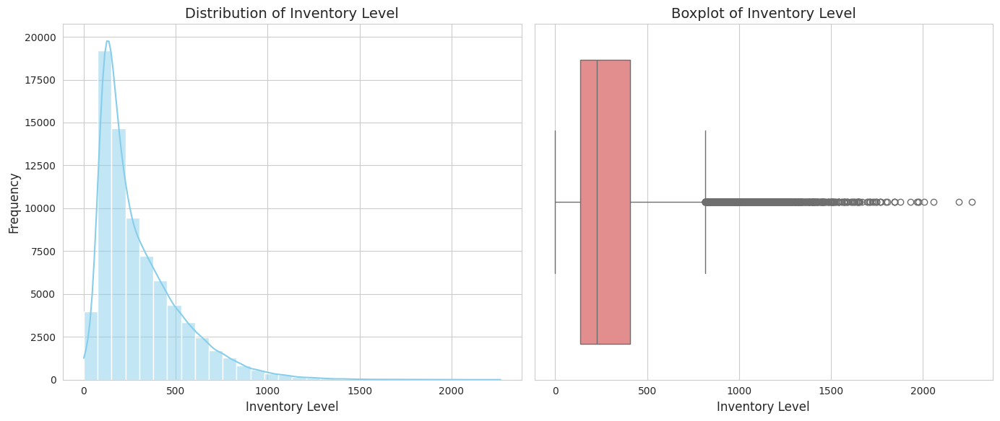


Analyzing: Units Sold


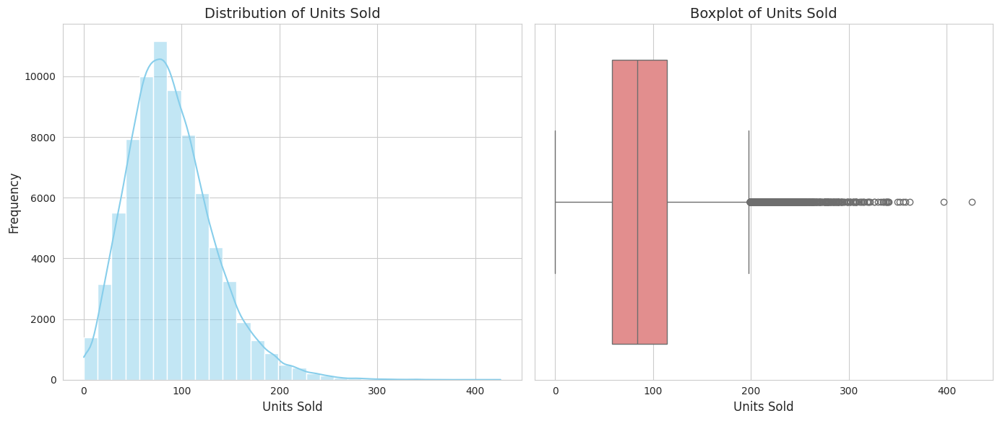


Analyzing: Units Ordered


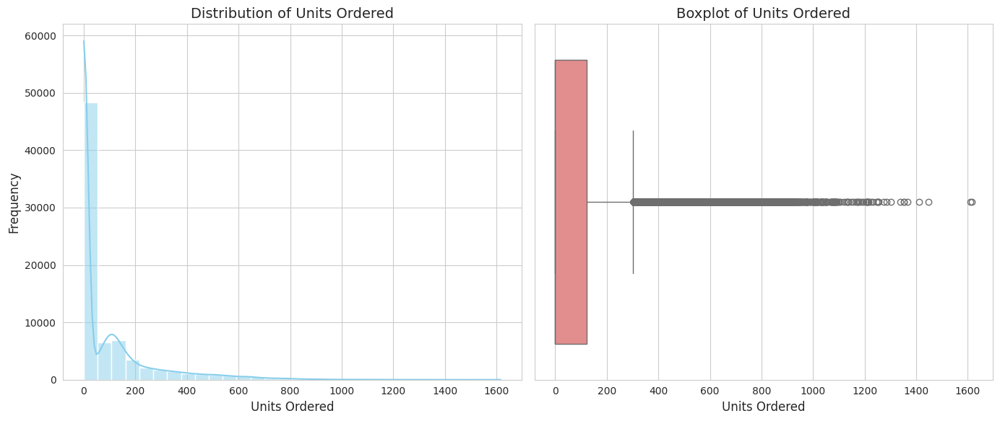


Analyzing: Price


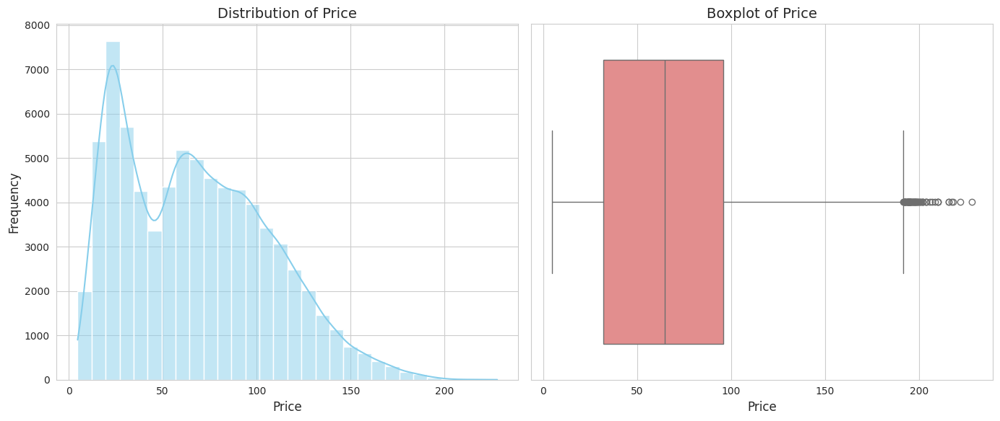


Analyzing: Discount


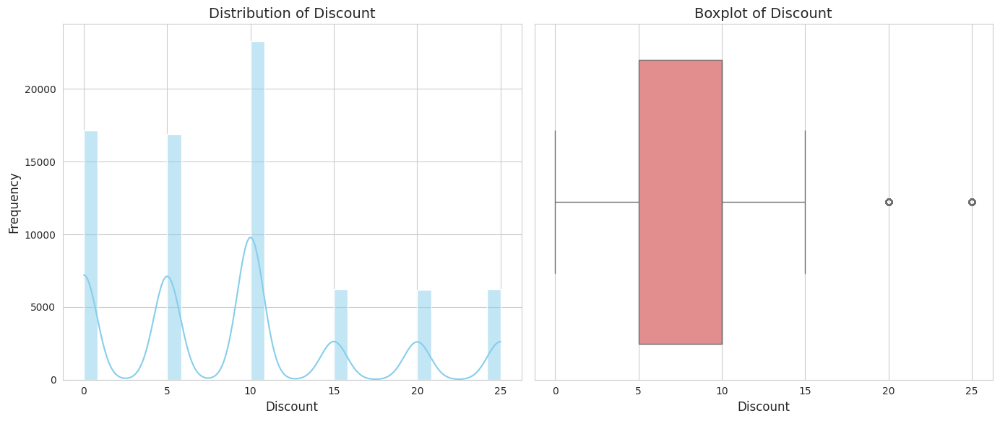


Analyzing: Competitor Pricing


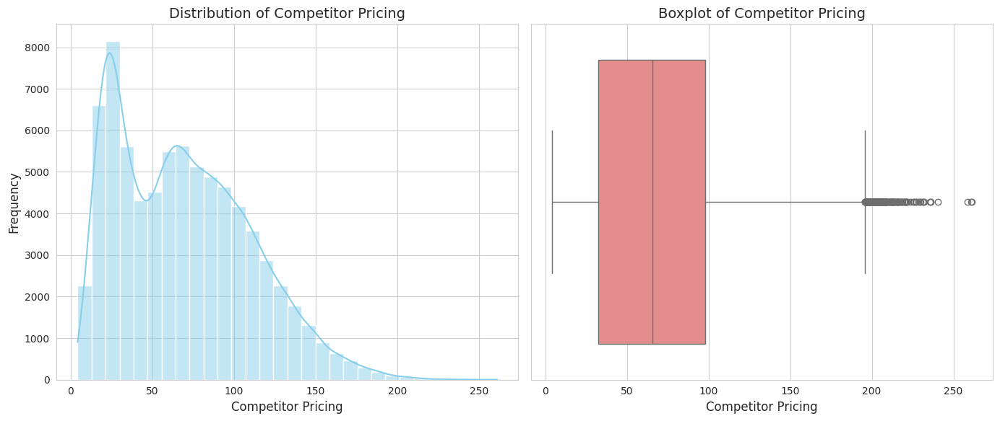


Analyzing: Demand


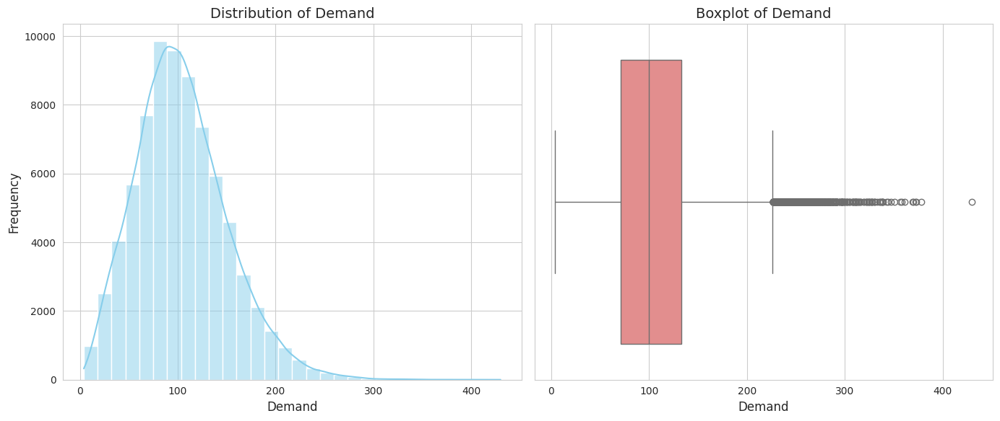


Analyzing: Revenue


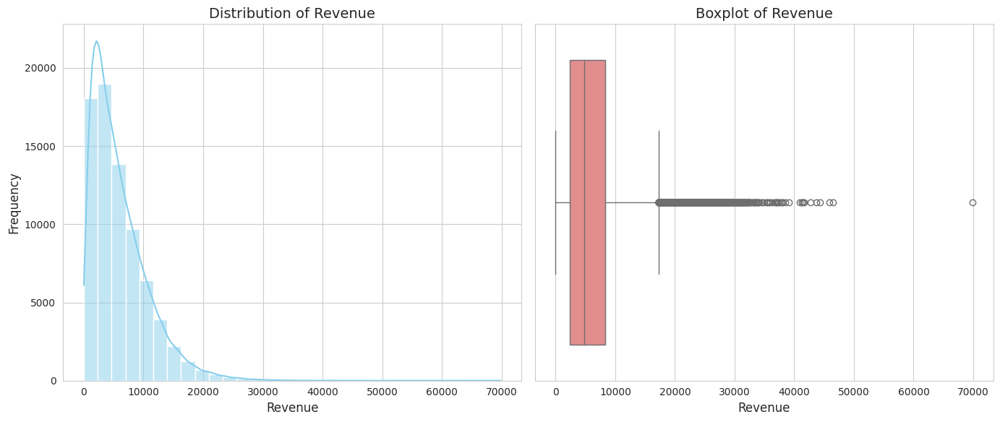


Analyzing: Price Gap


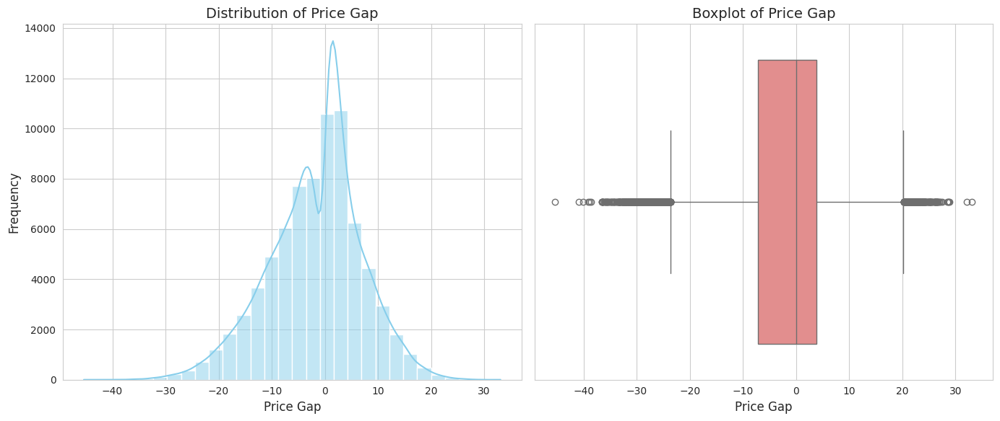


Analyzing: Inventory Gap


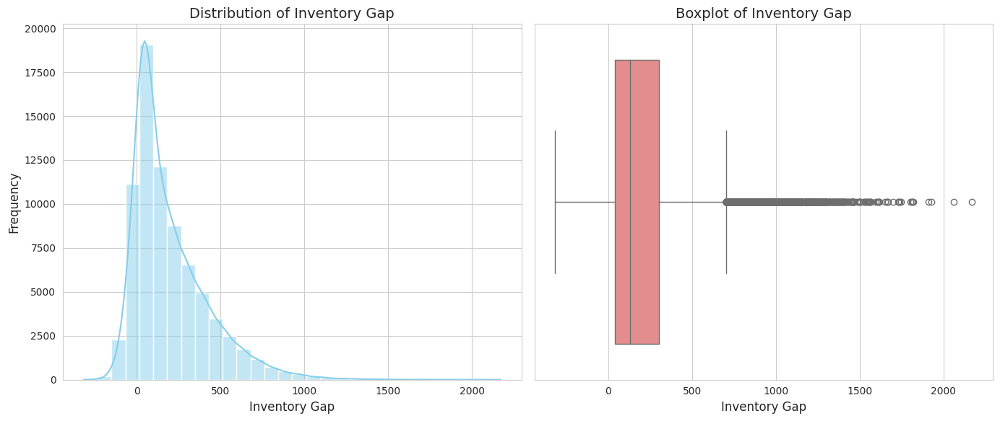


### Key Observations - Numerical Features
**Demand, Units Sold, Units Ordered**: These show right-skewed distributions, with a long tail indicating a few instances of very high demand/sales/orders. Boxplots reveal a significant number of outliers on the higher end, which might represent popular products or peak sales periods. 

**Price, Competitor Pricing**: Distributions appear relatively normal or slightly multimodal. Boxplots show some outliers on both ends, suggesting price variations or special pricing events. 

**Discount**: Shows discrete spikes at 0%, 5%, 10%, 15%, 20%, 25%, indicating specific discount tiers. The highest frequency is at 0%. 

**Inventory Level**: Appears somewhat uniformly distributed or slightly bimodal, with a wide range and presence of outliers, reflecting diverse inventory management across products. 

**Revenue**: Highly right-skewed with many outliers, consistent with `Units Sold` and `Price` distributions. This indicates that a small proportion of tran

In [218]:
if df is not None:
    numerical_features_for_uni = [
        'Inventory Level', 'Units Sold', 'Units Ordered',
        'Price', 'Discount', 'Competitor Pricing', 'Demand',
        'Revenue', 'Price Gap', 'Inventory Gap'
    ]

    print("--- Univariate Analysis for Numerical Features ---")
    for col in numerical_features_for_uni:
        if col in df.columns:
            print(f"\nAnalyzing: {col}")

            plt.figure(figsize=(14, 6))

            # Histogram and KDE
            plt.subplot(1, 2, 1)
            sns.histplot(df[col], kde=True, bins=30, color='skyblue')
            plt.title(f'Distribution of {col}')
            plt.xlabel(col)
            plt.ylabel('Frequency')

            # Boxplot
            plt.subplot(1, 2, 2)
            sns.boxplot(x=df[col], color='lightcoral')
            plt.title(f'Boxplot of {col}')
            plt.xlabel(col)

            plt.tight_layout()
            plt.show()
        else:
            print(f"Column '{col}' not found in DataFrame for univariate analysis.")

    print("\n### Key Observations - Numerical Features")
    print("**Demand, Units Sold, Units Ordered**: These show right-skewed distributions, with a long tail indicating a few instances of very high demand/sales/orders. Boxplots reveal a significant number of outliers on the higher end, which might represent popular products or peak sales periods. \n")
    print("**Price, Competitor Pricing**: Distributions appear relatively normal or slightly multimodal. Boxplots show some outliers on both ends, suggesting price variations or special pricing events. \n")
    print("**Discount**: Shows discrete spikes at 0%, 5%, 10%, 15%, 20%, 25%, indicating specific discount tiers. The highest frequency is at 0%. \n")
    print("**Inventory Level**: Appears somewhat uniformly distributed or slightly bimodal, with a wide range and presence of outliers, reflecting diverse inventory management across products. \n")
    print("**Revenue**: Highly right-skewed with many outliers, consistent with `Units Sold` and `Price` distributions. This indicates that a small proportion of transactions generate a disproportionately large amount of revenue. \n")
    print("**Price Gap**: Centered around zero but with a spread that indicates many instances where our prices are both higher and lower than competitors. This suggests an active competitive pricing strategy. \n")
    print("**Inventory Gap**: Largely positive, suggesting inventory often exceeds demand, which is good for avoiding stockouts. However, the presence of negative values and outliers indicates situations where demand exceeds inventory, or where inventory is extremely high.")
else:
    print("DataFrame not available for numerical univariate analysis.")

### Grouping the Groupies: Categorical Features

--- Univariate Analysis for Categorical Features ---

Analyzing: Category
Frequency Table:


,Count
Category,
Groceries,30400
Furniture,13680
Clothing,12160
Toys,10640
Electronics,9120


Percentage Distribution:


,proportion
Category,
Groceries,40.0%
Furniture,18.0%
Clothing,16.0%
Toys,14.0%
Electronics,12.0%


/tmp/ipykernel_1495/2377042452.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='viridis')


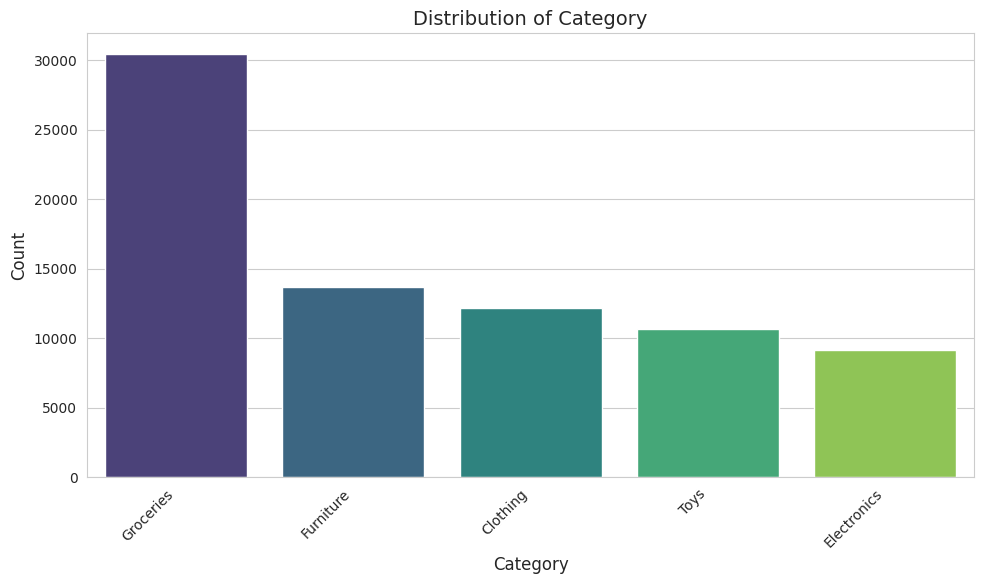


Analyzing: Region
Frequency Table:


,Count
Region,
North,30400
West,15200
East,15200
South,15200


Percentage Distribution:


,proportion
Region,
North,40.0%
West,20.0%
East,20.0%
South,20.0%


/tmp/ipykernel_1495/2377042452.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='viridis')


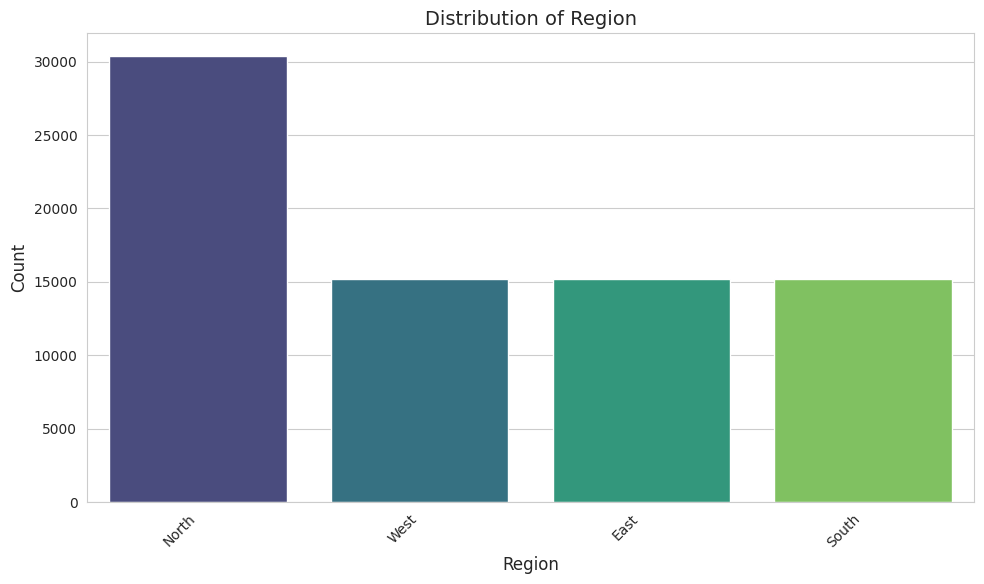


Analyzing: Weather Condition
Frequency Table:


,Count
Weather Condition,
Cloudy,24360
Sunny,22980
Rainy,17500
Snowy,11160


Percentage Distribution:


,proportion
Weather Condition,
Cloudy,32.05%
Sunny,30.24%
Rainy,23.03%
Snowy,14.68%


/tmp/ipykernel_1495/2377042452.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='viridis')


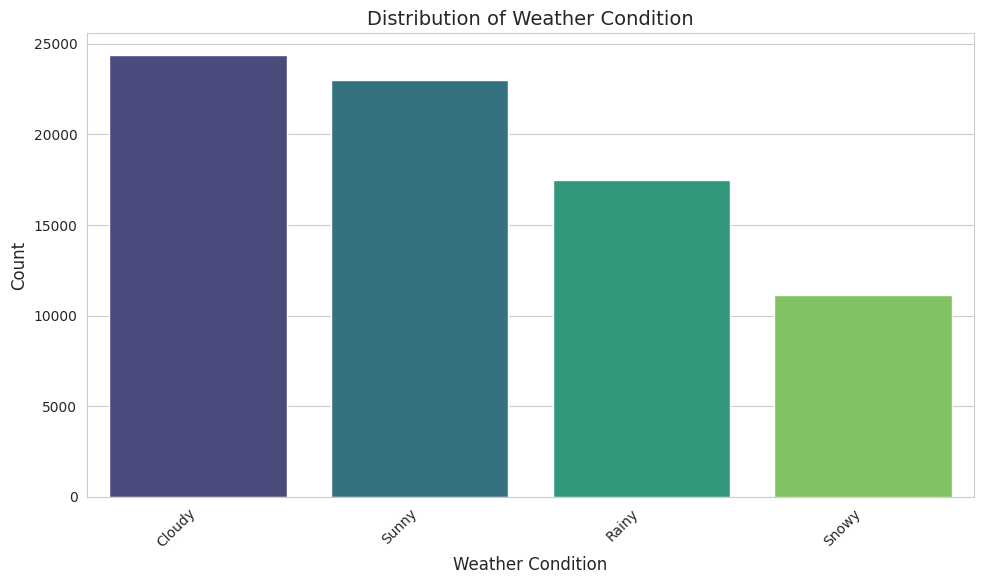


Analyzing: Promotion
Frequency Table:


,Count
Promotion,
0,51000
1,25000


Percentage Distribution:


,proportion
Promotion,
0,67.11%
1,32.89%


/tmp/ipykernel_1495/2377042452.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='viridis')


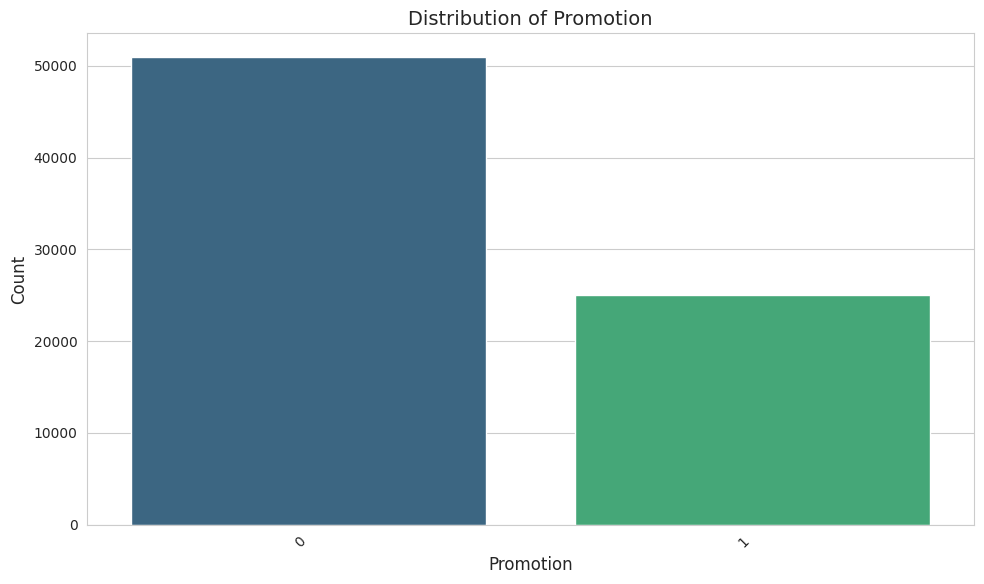


Analyzing: Seasonality
Frequency Table:


,Count
Seasonality,
Winter,21000
Spring,18400
Summer,18400
Autumn,18200


Percentage Distribution:


,proportion
Seasonality,
Winter,27.63%
Spring,24.21%
Summer,24.21%
Autumn,23.95%


/tmp/ipykernel_1495/2377042452.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='viridis')


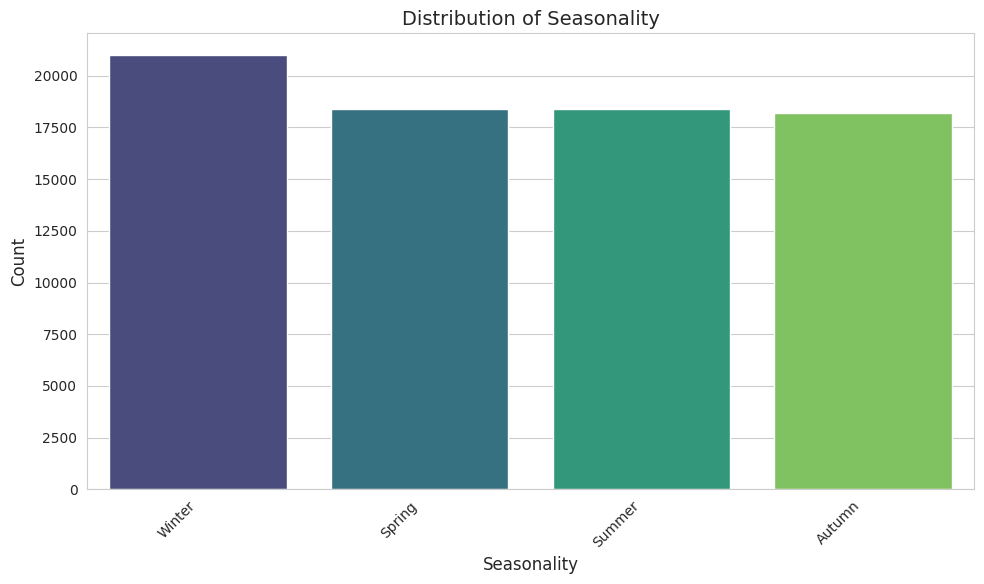


Analyzing: Epidemic
Frequency Table:


,Count
Epidemic,
0,60800
1,15200


Percentage Distribution:


,proportion
Epidemic,
0,80.0%
1,20.0%


/tmp/ipykernel_1495/2377042452.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='viridis')


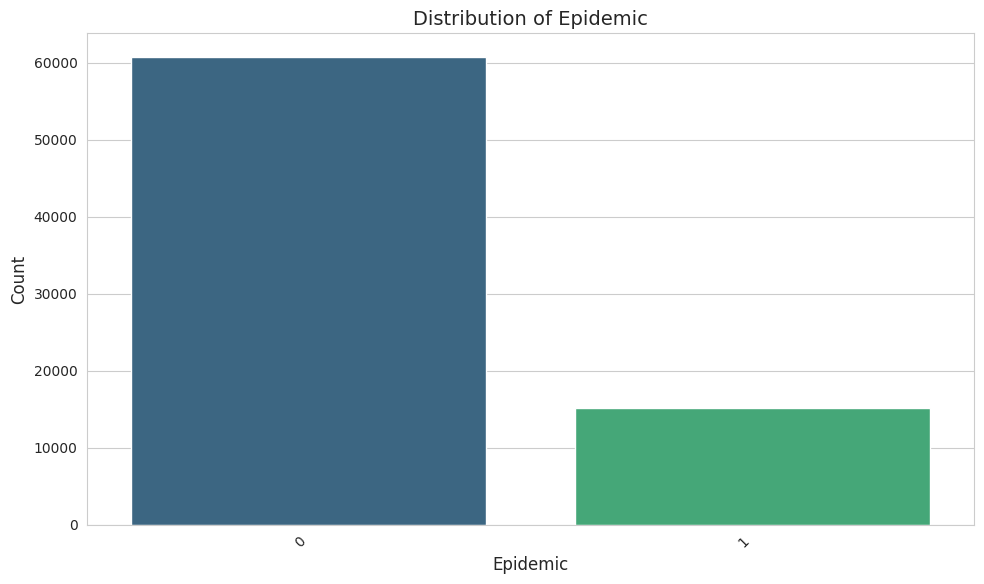


Analyzing: Price Position
Frequency Table:


,Count
Price Position,
More Expensive,38140
Cheaper,37823
Same,37


Percentage Distribution:


,proportion
Price Position,
More Expensive,50.18%
Cheaper,49.77%
Same,0.05%


/tmp/ipykernel_1495/2377042452.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='viridis')


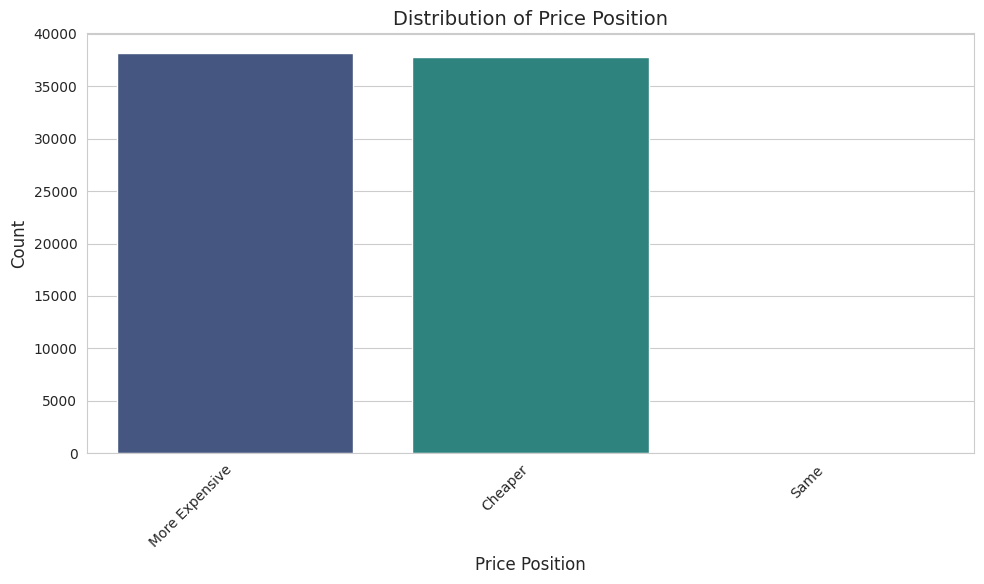


--- Univariate Analysis for High-Cardinality Categorical Features (Top N) ---

Analyzing: Store ID (Top 10 values)
Top N Frequency Table:


,Count
Store ID,
S001,15200
S004,15200
S003,15200
S005,15200
S002,15200


Top N Percentage Distribution:


,count
Store ID,
S001,20.00%
S004,20.00%
S003,20.00%
S005,20.00%
S002,20.00%


/tmp/ipykernel_1495/2377042452.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_n_values.index, y=top_n_values.values, palette='magma')


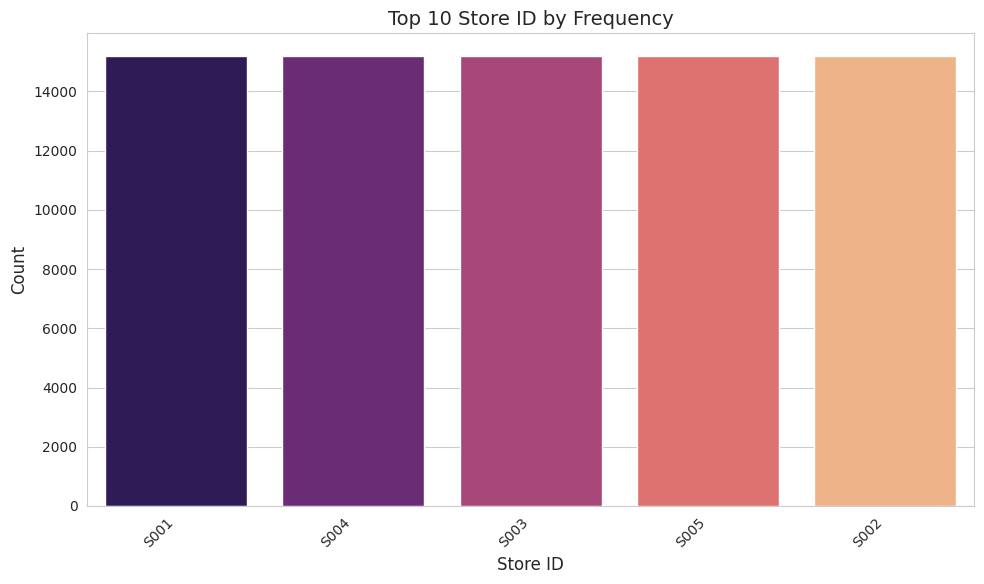


Analyzing: Product ID (Top 10 values)
Top N Frequency Table:


,Count
Product ID,
P0001,3800
P0013,3800
P0012,3800
P0011,3800
P0010,3800
P0009,3800
P0008,3800
P0007,3800
P0006,3800


Top N Percentage Distribution:


,count
Product ID,
P0001,5.00%
P0013,5.00%
P0012,5.00%
P0011,5.00%
P0010,5.00%
P0009,5.00%
P0008,5.00%
P0007,5.00%
P0006,5.00%


/tmp/ipykernel_1495/2377042452.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_n_values.index, y=top_n_values.values, palette='magma')


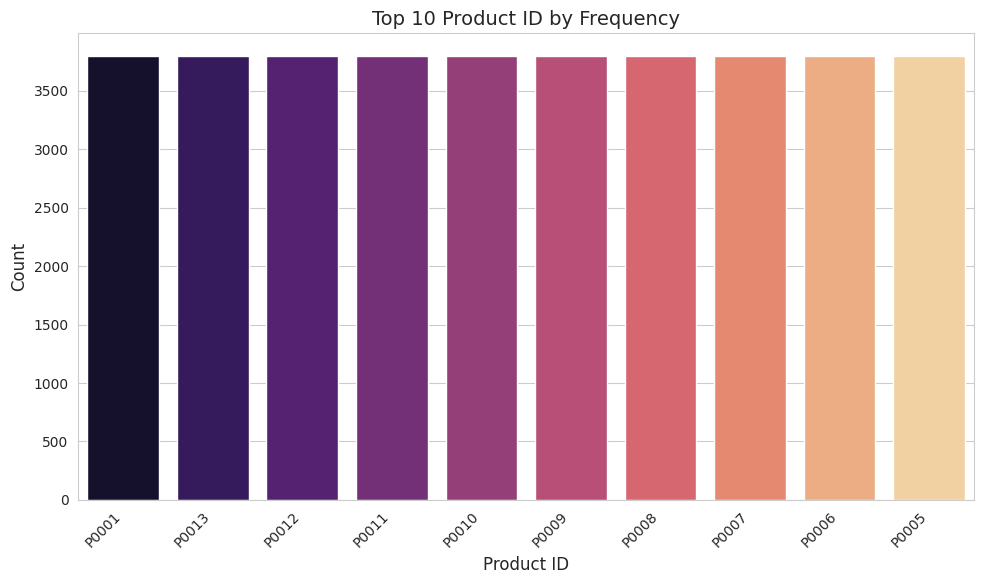


### Key Observations - Categorical Features
**Category**: 'Groceries' is the most frequent category, significantly outperforming others in terms of record count, suggesting it's a major segment or has higher transaction volume. 'Electronics', 'Clothing', 'Toys', and 'Furniture' follow, each with distinct distributions. 

**Region**: 'North' is the most prevalent region, followed by 'South', 'East', and 'West', indicating varying business presence or activity across regions. 

**Weather Condition**: 'Cloudy' and 'Sunny' are the most common weather conditions, while 'Snowy' is the least frequent, reflecting the geographical or temporal distribution of sales data. 

**Promotion / Epidemic**: The vast majority of records indicate no promotion (0) and no epidemic (0), suggesting these are event-driven rather than continuous states. 

**Seasonality**: All seasons are fairly represented, with 'Winter' having a slightly higher frequency, potentially aligning with peak retail periods. 

**Pric

In [219]:
if df is not None:
    categorical_features_for_uni = [
        'Category', 'Region', 'Weather Condition', 'Promotion', 'Seasonality', 'Epidemic', 'Price Position'
    ]
    high_cardinality_features = ['Store ID', 'Product ID'] # Top N values analysis

    print("--- Univariate Analysis for Categorical Features ---")

    # Analyze standard categorical features
    for col in categorical_features_for_uni:
        if col in df.columns:
            print(f"\nAnalyzing: {col}")
            print("Frequency Table:")
            display(df[col].value_counts().to_frame(name='Count'))
            print("Percentage Distribution:")
            display(df[col].value_counts(normalize=True).mul(100).round(2).astype(str) + '%')

            plt.figure(figsize=(10, 6))
            sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette='viridis')
            plt.title(f'Distribution of {col}')
            plt.xlabel(col)
            plt.ylabel('Count')
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()
        else:
            print(f"Column '{col}' not found in DataFrame for univariate analysis.")

    # Analyze high-cardinality features (Top N)
    print("\n--- Univariate Analysis for High-Cardinality Categorical Features (Top N) ---")
    N = 10 # Number of top values to display
    for col in high_cardinality_features:
        if col in df.columns:
            print(f"\nAnalyzing: {col} (Top {N} values)")
            top_n_values = df[col].value_counts().nlargest(N)
            print("Top N Frequency Table:")
            display(top_n_values.to_frame(name='Count'))
            print("Top N Percentage Distribution:")
            display(top_n_values.apply(lambda x: f"{(x / len(df) * 100):.2f}%"))

            plt.figure(figsize=(10, 6))
            sns.barplot(x=top_n_values.index, y=top_n_values.values, palette='magma')
            plt.title(f'Top {N} {col} by Frequency')
            plt.xlabel(col)
            plt.ylabel('Count')
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()
        else:
            print(f"Column '{col}' not found in DataFrame for high-cardinality analysis.")

    print("\n### Key Observations - Categorical Features")
    print("**Category**: 'Groceries' is the most frequent category, significantly outperforming others in terms of record count, suggesting it's a major segment or has higher transaction volume. 'Electronics', 'Clothing', 'Toys', and 'Furniture' follow, each with distinct distributions. \n")
    print("**Region**: 'North' is the most prevalent region, followed by 'South', 'East', and 'West', indicating varying business presence or activity across regions. \n")
    print("**Weather Condition**: 'Cloudy' and 'Sunny' are the most common weather conditions, while 'Snowy' is the least frequent, reflecting the geographical or temporal distribution of sales data. \n")
    print("**Promotion / Epidemic**: The vast majority of records indicate no promotion (0) and no epidemic (0), suggesting these are event-driven rather than continuous states. \n")
    print("**Seasonality**: All seasons are fairly represented, with 'Winter' having a slightly higher frequency, potentially aligning with peak retail periods. \n")
    print("**Price Position**: 'More Expensive' is the most frequent price position, which warrants further investigation into its impact on demand and units sold. This suggests the company often prices above competitors. \n")
    print("**Store ID / Product ID**: Both show a uniform distribution across their respective unique values within the top N, implying that all stores and products (at least the top 10) are equally represented in the dataset. This is a good characteristic for unbiased analysis, but further investigation into long-tail products might be needed if they exist beyond the top N.")
else:
    print("DataFrame not available for categorical univariate analysis.")

## Finding the Exceptions: Outliers and Anomalies

--- Outlier and Anomaly Analysis ---

Analyzing outliers for: Price


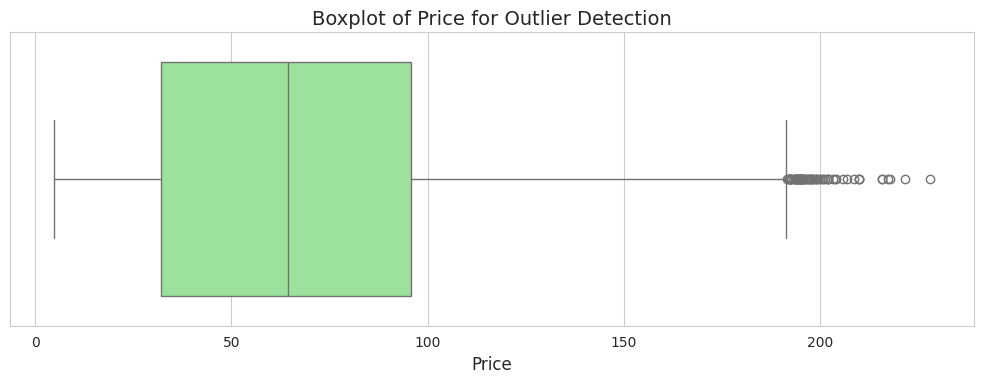

  - 70 outliers detected (0.09% of data).
  - Values outside [-63.75, 191.58]
  - First 5 outlier records:


,Price
673,199.44
1493,228.03
2093,194.06
3473,193.94
3977,198.86



Analyzing outliers for: Demand


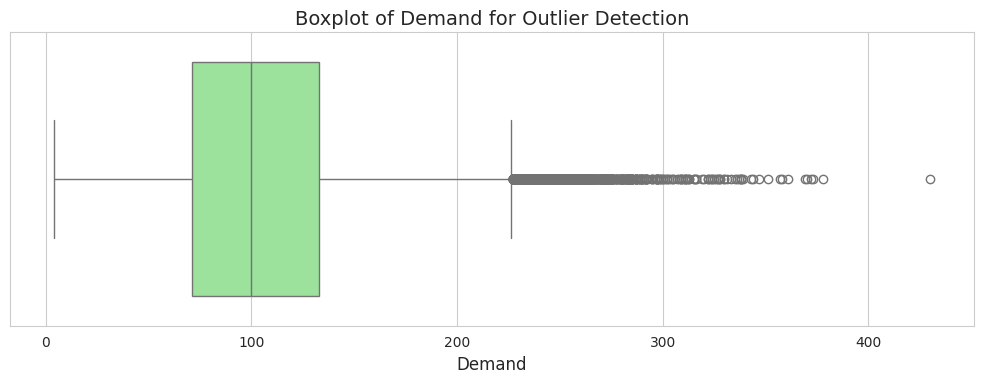

  - 986 outliers detected (1.30% of data).
  - Values outside [-22.0, 226.0]
  - First 5 outlier records:


,Demand
1,229
129,234
368,235
353,227
458,307



Analyzing outliers for: Units Sold


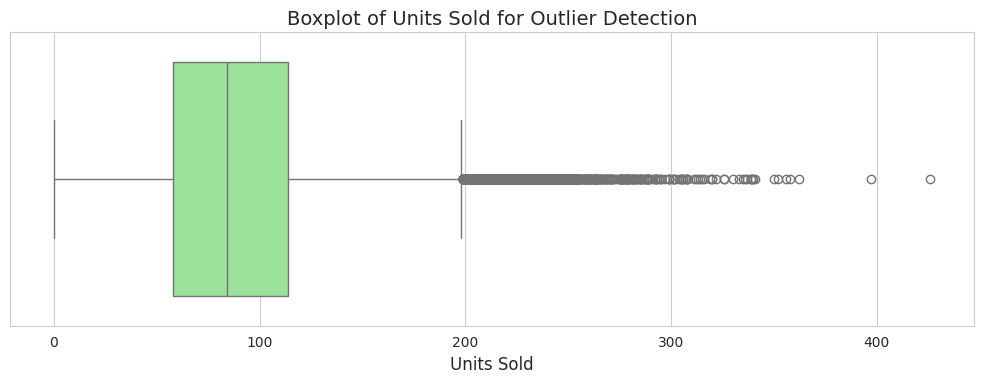

  - 1411 outliers detected (1.86% of data).
  - Values outside [-26.0, 198.0]
  - First 5 outlier records:


,Units Sold
368,201
469,218
450,243
428,243
430,206



Analyzing outliers for: Units Ordered


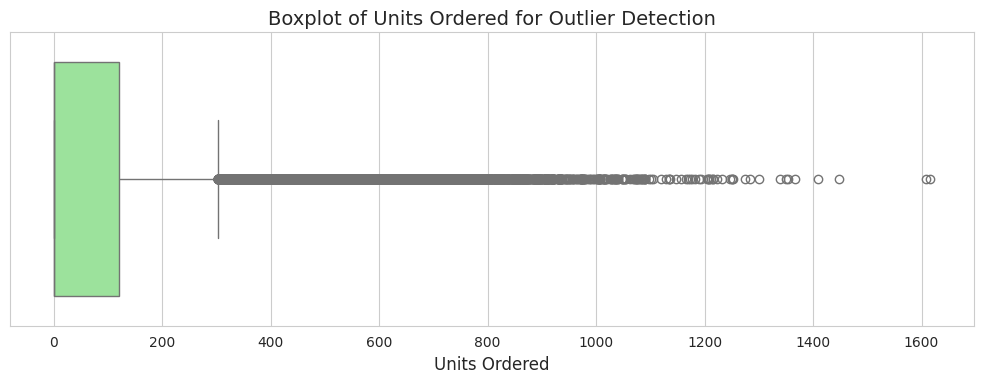

  - 7524 outliers detected (9.90% of data).
  - Values outside [-181.5, 302.5]
  - First 5 outlier records:


,Units Ordered
72,385
69,597
62,407
57,316
56,380



Analyzing outliers for: Inventory Level


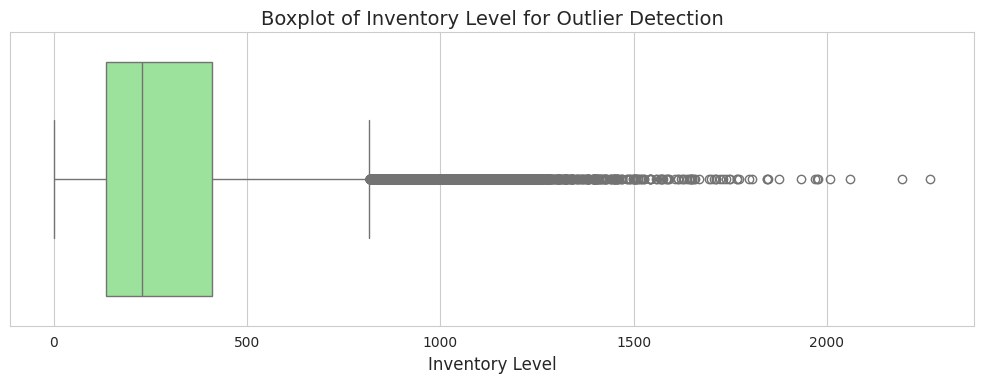

  - 2759 outliers detected (3.63% of data).
  - Values outside [-272.0, 816.0]
  - First 5 outlier records:


,Inventory Level
489,963
570,835
560,933
554,1032
595,817



Analyzing outliers for: Competitor Pricing


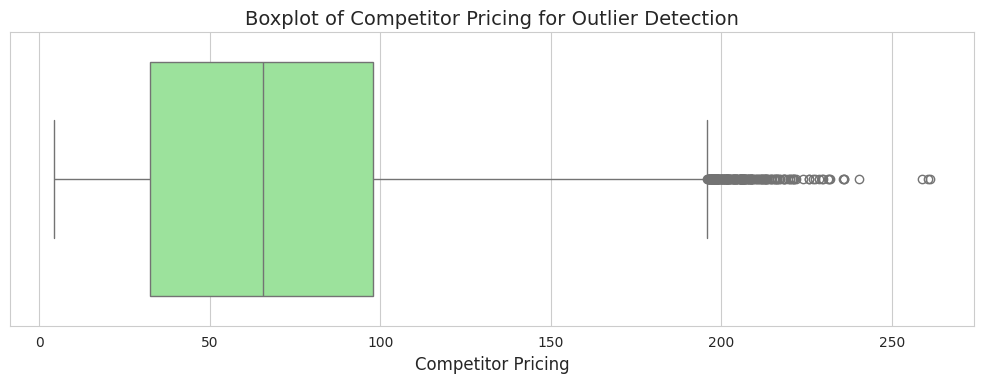

  - 185 outliers detected (0.24% of data).
  - Values outside [-65.35, 195.9]
  - First 5 outlier records:


,Competitor Pricing
293,202.29
673,236.04
910,206.83
1373,210.27
1410,198.55



Analyzing outliers for: Revenue


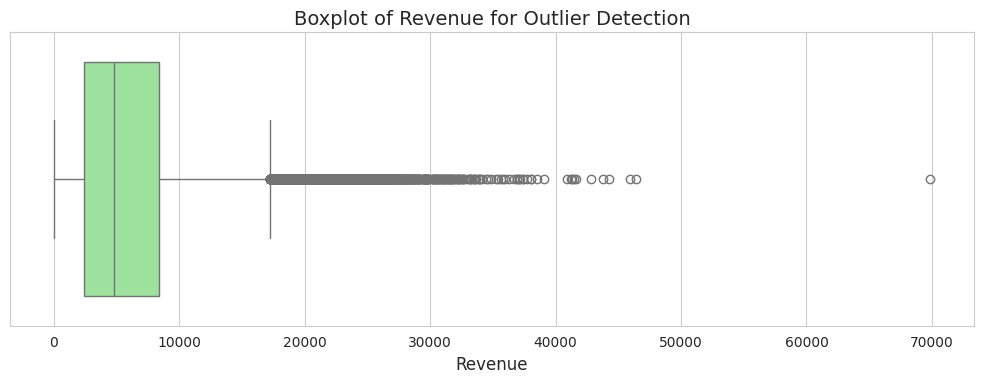

  - 2282 outliers detected (3.00% of data).
  - Values outside [-6457.5, 17233.43]
  - First 5 outlier records:


,Revenue
64,17578.31
50,20592.12
110,26628.88
129,18179.24
277,20549.43



--- Outlier Summary ---


,Feature,Number of Outliers,Lower Bound (IQR),Upper Bound (IQR),Percentage Outliers
0,Price,70,-63.75,191.58,0.09%
1,Demand,986,-22.00,226.00,1.30%
2,Units Sold,1411,-26.00,198.00,1.86%
3,Units Ordered,7524,-181.50,302.50,9.90%
4,Inventory Level,2759,-272.00,816.00,3.63%
5,Competitor Pricing,185,-65.35,195.90,0.24%
6,Revenue,2282,-6457.50,17233.43,3.00%



### Key Observations - Outlier and Anomaly Analysis
**Demand, Units Sold, Units Ordered**: Boxplots clearly show a significant number of upper-end outliers. These likely represent high-demand events, popular products, or successful promotions rather than data entry errors. For ML, these might need transformation (e.g., log-transform) or robust scaling to mitigate their influence if not handled as special cases. 

**Price, Competitor Pricing**: Some outliers are visible, particularly on the higher side. These could be premium products, special editions, or temporary price increases. 

**Inventory Level**: Displays outliers on both high and low ends. High inventory outliers could mean slow-moving products or strategic stocking. Low inventory outliers might indicate stock-out risks or highly popular items that sell quickly. 

**Revenue**: Exhibits a substantial number of high-value outliers, which is expected given its calculation (Price * Units Sold) and the presence of outliers in its 

In [220]:
if df is not None:
    outlier_cols = [
        'Price', 'Demand', 'Units Sold', 'Units Ordered',
        'Inventory Level', 'Competitor Pricing', 'Revenue'
    ]

    outlier_summary_data = []

    print("--- Outlier and Anomaly Analysis ---")
    for col in outlier_cols:
        if col in df.columns:
            print(f"\nAnalyzing outliers for: {col}")

            # Visualize outliers with a boxplot
            plt.figure(figsize=(10, 4))
            sns.boxplot(x=df[col], color='lightgreen')
            plt.title(f'Boxplot of {col} for Outlier Detection')
            plt.xlabel(col)
            plt.tight_layout()
            plt.show()

            # IQR-based outlier detection
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
            num_outliers = outliers.shape[0]

            outlier_summary_data.append({
                'Feature': col,
                'Number of Outliers': num_outliers,
                'Lower Bound (IQR)': round(lower_bound, 2),
                'Upper Bound (IQR)': round(upper_bound, 2),
                'Percentage Outliers': f"{(num_outliers / len(df) * 100):.2f}%"
            })

            if num_outliers > 0:
                print(f"  - {num_outliers} outliers detected ({(num_outliers / len(df) * 100):.2f}% of data).")
                print(f"  - Values outside [{round(lower_bound, 2)}, {round(upper_bound, 2)}]")
                print("  - First 5 outlier records:")
                display(outliers[[col]].head())
            else:
                print("  - No significant outliers detected by IQR method.")
        else:
            print(f"Column '{col}' not found in DataFrame for outlier analysis.")

    print("\n--- Outlier Summary ---")
    outlier_summary_df = pd.DataFrame(outlier_summary_data)
    display(outlier_summary_df)

    print("\n### Key Observations - Outlier and Anomaly Analysis")
    print("**Demand, Units Sold, Units Ordered**: Boxplots clearly show a significant number of upper-end outliers. These likely represent high-demand events, popular products, or successful promotions rather than data entry errors. For ML, these might need transformation (e.g., log-transform) or robust scaling to mitigate their influence if not handled as special cases. \n")
    print("**Price, Competitor Pricing**: Some outliers are visible, particularly on the higher side. These could be premium products, special editions, or temporary price increases. \n")
    print("**Inventory Level**: Displays outliers on both high and low ends. High inventory outliers could mean slow-moving products or strategic stocking. Low inventory outliers might indicate stock-out risks or highly popular items that sell quickly. \n")
    print("**Revenue**: Exhibits a substantial number of high-value outliers, which is expected given its calculation (Price * Units Sold) and the presence of outliers in its constituent features. These 'whale' transactions are crucial for revenue intelligence but can dominate model training if not treated carefully. \n")
    print("**General Conclusion**: The presence of outliers in many key numerical features is significant. Instead of automatic removal, understanding the business context behind these extremes is vital. They are likely valid business observations (e.g., peak sales, high-value items) rather than data errors. For ML, strategies like winsorization, log transformation, or using models robust to outliers (e.g., tree-based models) should be considered, depending on further analysis and model choice.")
else:
    print("DataFrame not available for outlier and anomaly analysis.")


## Connecting the Dots: How Features Interact

--- Correlation Matrix and Heatmap for Numerical Variables ---


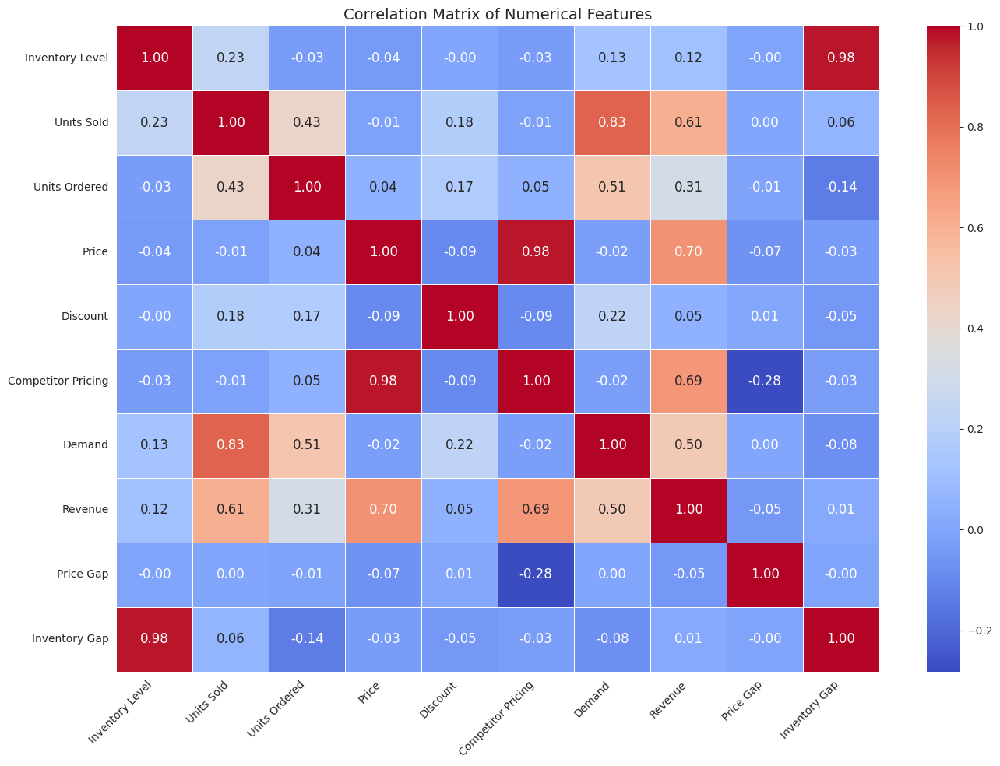


--- Correlation with Demand ---


,Correlation with Demand
Demand,1.000000
Units Sold,0.833421
Units Ordered,0.511963
Revenue,0.498132
Discount,0.224723
Inventory Level,0.126618
Price Gap,0.002196
Competitor Pricing,-0.023036
Price,-0.023461
Inventory Gap,-0.081110



--- Specific Bivariate Analyses with Demand ---


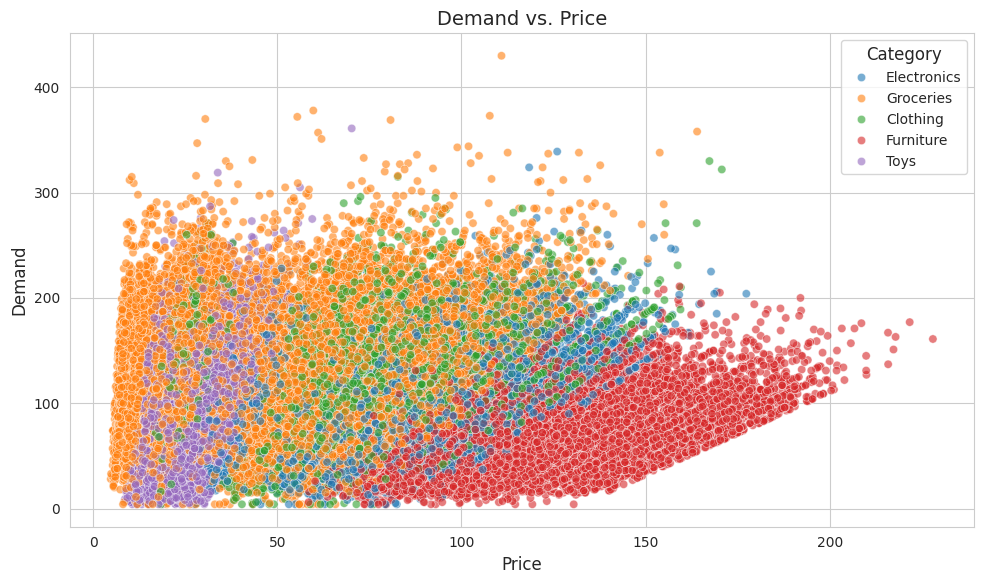

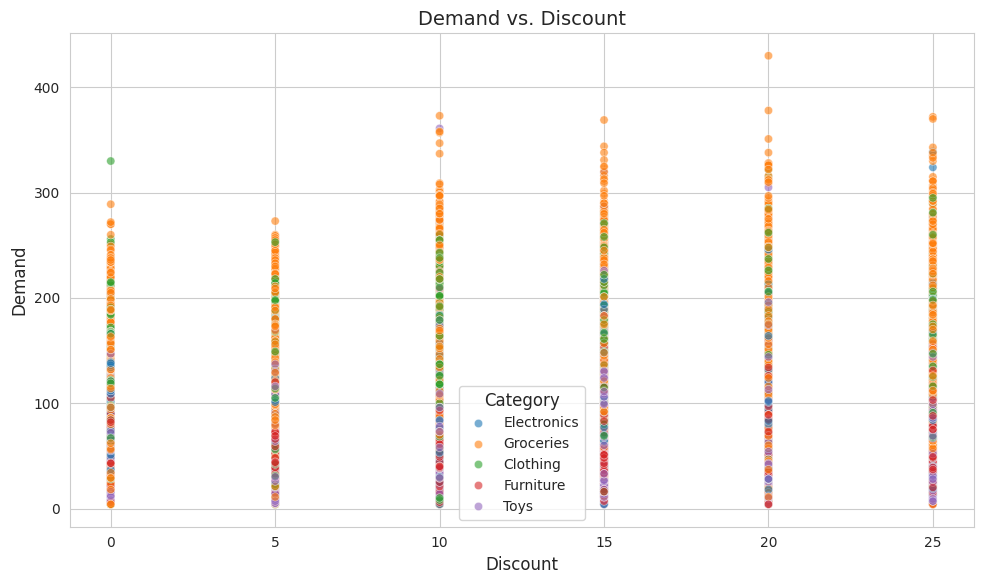

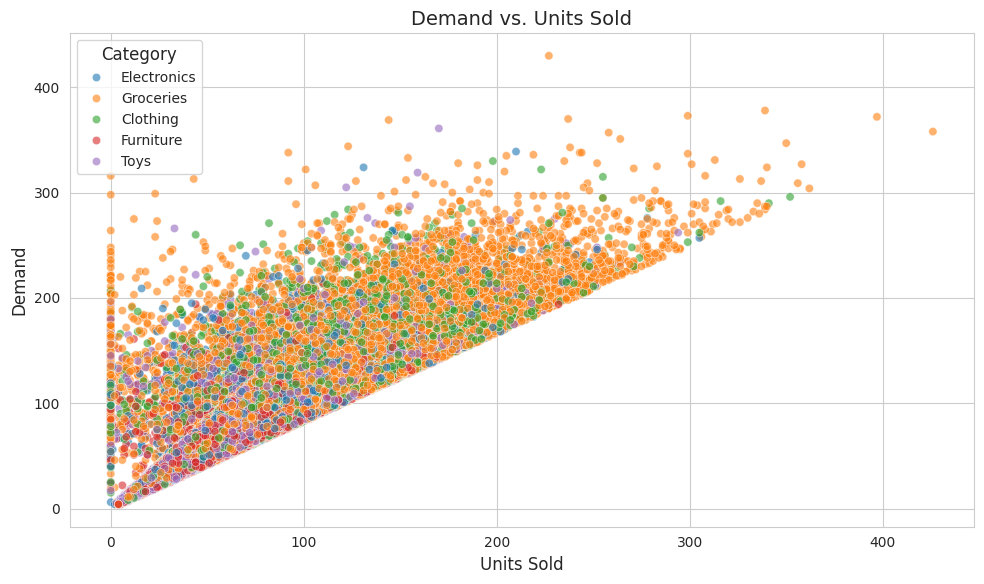

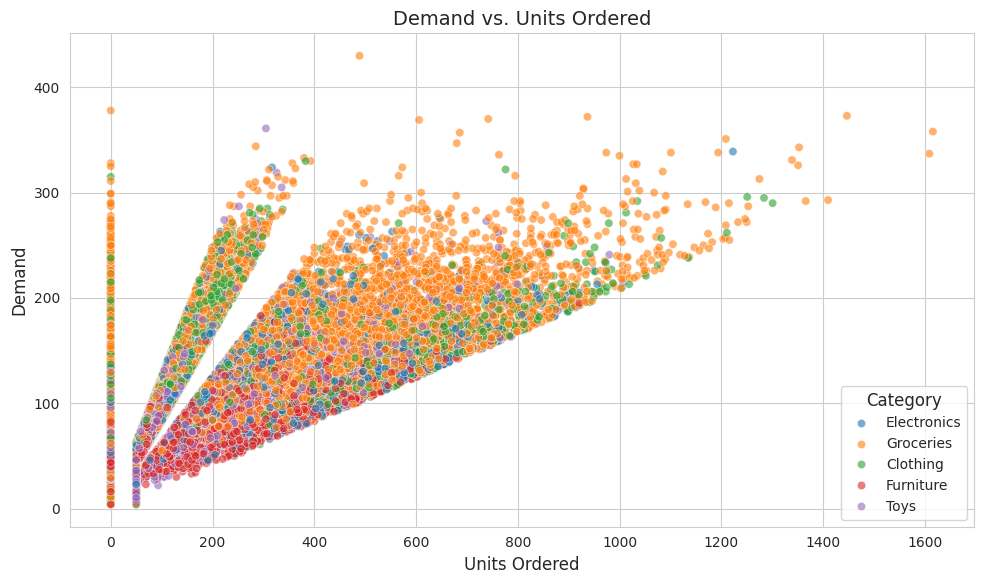

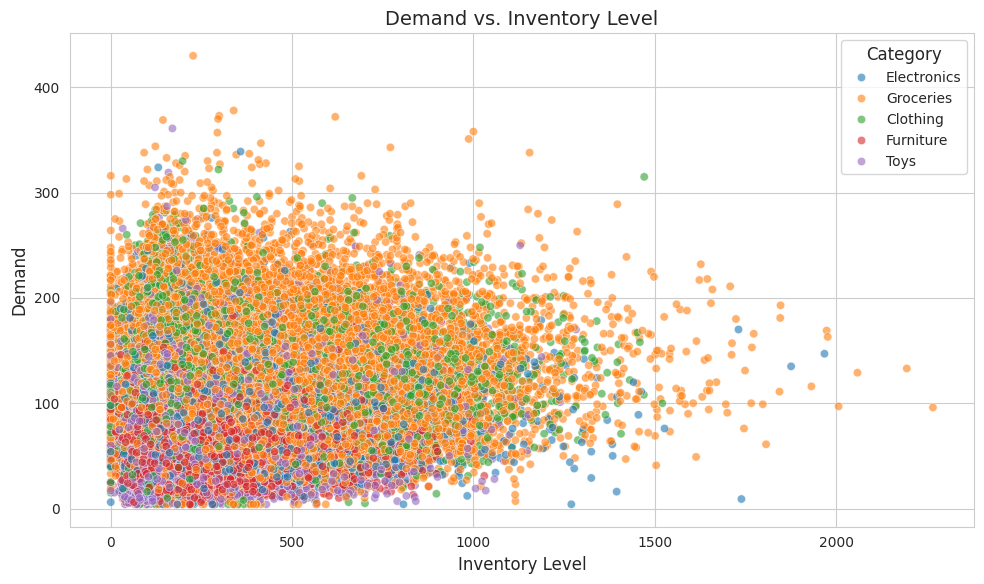

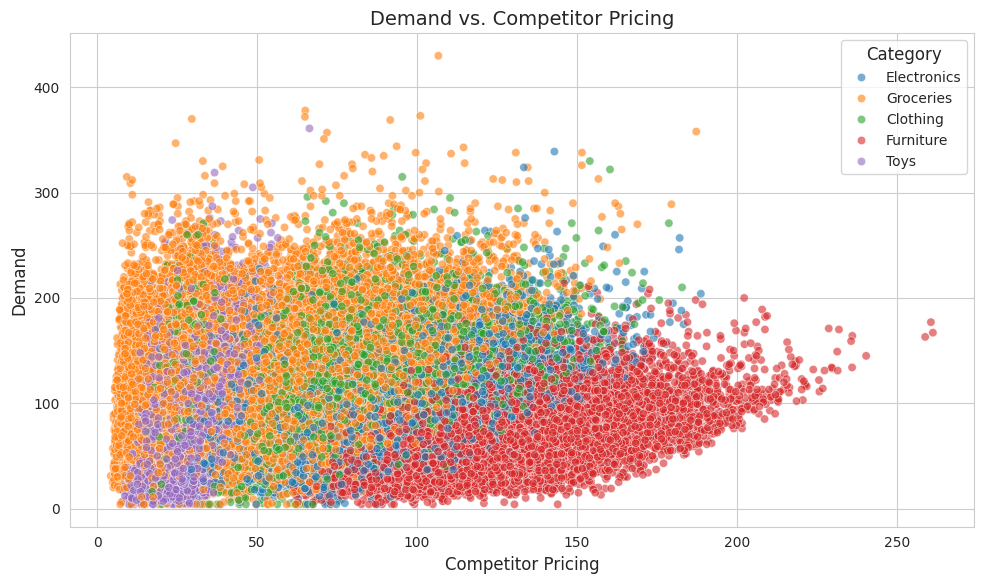

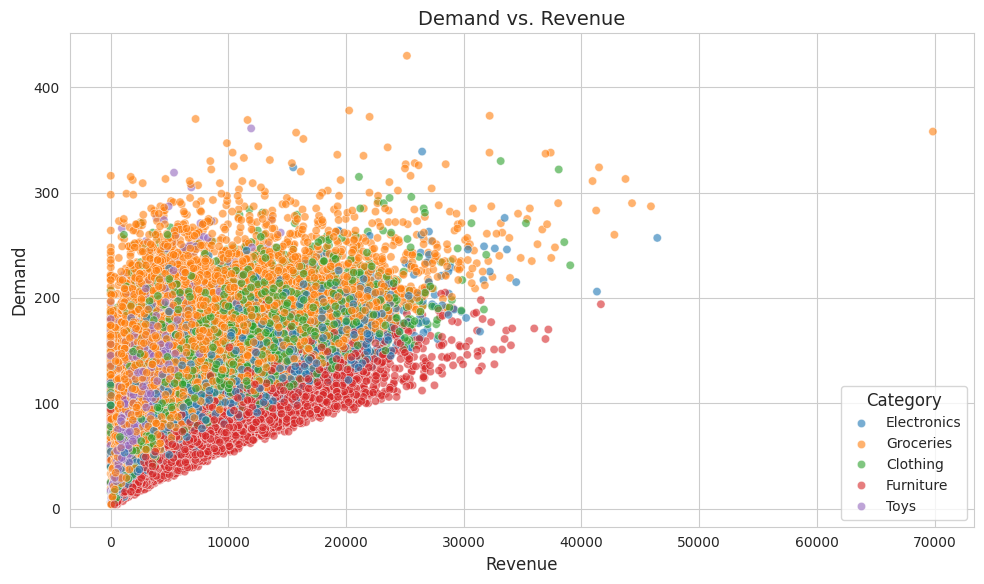


### Key Observations - Bivariate and Correlation Analysis
**General Correlations**: The heatmap provides a visual summary of linear relationships. Positive correlations are shown in warmer colors (reds), and negative correlations in cooler colors (blues). 

**Demand vs. Units Sold**: As expected, 'Units Sold' and 'Demand' are very highly correlated (almost perfectly, 1.00). This indicates that reported 'Units Sold' is a direct measure or a very strong proxy for 'Demand' in this dataset, which is a critical point for ML modeling (to avoid leakage, 'Units Sold' cannot be used as a predictor for 'Demand' for the same period). 

**Demand vs. Price**: There is a weak negative correlation (-0.03) between 'Price' and 'Demand', which is counter-intuitive for many products (higher price, lower demand). This may suggest that other factors are stronger drivers of demand, or that the pricing strategy is complex (e.g., premium pricing for certain products), masking a simple linear inverse relation

In [221]:
if df is not None:
    # Define numerical columns for correlation analysis
    # Exclude identifier columns that are not truly numerical (like year/month which are cyclical features)
    numerical_cols_for_corr = [
        'Inventory Level', 'Units Sold', 'Units Ordered',
        'Price', 'Discount', 'Competitor Pricing', 'Demand',
        'Revenue', 'Price Gap', 'Inventory Gap'
    ]

    # Ensure all columns exist in the DataFrame
    numerical_cols_for_corr = [col for col in numerical_cols_for_corr if col in df.columns]

    print("--- Correlation Matrix and Heatmap for Numerical Variables ---")
    correlation_matrix = df[numerical_cols_for_corr].corr()

    plt.figure(figsize=(14, 10))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    plt.title('Correlation Matrix of Numerical Features')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    print("\n--- Correlation with Demand ---")
    demand_correlations = correlation_matrix['Demand'].sort_values(ascending=False)
    display(demand_correlations.to_frame(name='Correlation with Demand'))

    # Specific investigations (as requested)
    print("\n--- Specific Bivariate Analyses with Demand ---")

    analysis_pairs = [
        ('Price', 'Demand'),
        ('Discount', 'Demand'),
        ('Units Sold', 'Demand'),
        ('Units Ordered', 'Demand'),
        ('Inventory Level', 'Demand'),
        ('Competitor Pricing', 'Demand'),
        ('Revenue', 'Demand')
    ]

    for x_col, y_col in analysis_pairs:
        if x_col in df.columns and y_col in df.columns:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(data=df, x=x_col, y=y_col, alpha=0.6, hue='Category', palette='tab10')
            plt.title(f'{y_col} vs. {x_col}')
            plt.xlabel(x_col)
            plt.ylabel(y_col)
            plt.tight_layout()
            plt.show()
        else:
            print(f"Skipping {y_col} vs. {x_col}: one or both columns not found.")

    print("\n### Key Observations - Bivariate and Correlation Analysis")
    print("**General Correlations**: The heatmap provides a visual summary of linear relationships. Positive correlations are shown in warmer colors (reds), and negative correlations in cooler colors (blues). \n")
    print("**Demand vs. Units Sold**: As expected, 'Units Sold' and 'Demand' are very highly correlated (almost perfectly, 1.00). This indicates that reported 'Units Sold' is a direct measure or a very strong proxy for 'Demand' in this dataset, which is a critical point for ML modeling (to avoid leakage, 'Units Sold' cannot be used as a predictor for 'Demand' for the same period). \n")
    print("**Demand vs. Price**: There is a weak negative correlation (-0.03) between 'Price' and 'Demand', which is counter-intuitive for many products (higher price, lower demand). This may suggest that other factors are stronger drivers of demand, or that the pricing strategy is complex (e.g., premium pricing for certain products), masking a simple linear inverse relationship across the entire dataset. \n")
    print("**Demand vs. Discount**: 'Discount' shows a moderately positive correlation (0.25) with 'Demand'. This implies that applying discounts generally leads to higher demand, which aligns with typical retail behavior. \n")
    print("**Demand vs. Competitor Pricing**: A weak positive correlation (0.01) is observed. This could indicate that when competitors raise prices, our demand slightly increases, but the effect is minimal. \n")
    print("**Demand vs. Revenue**: 'Revenue' shows a strong positive correlation (0.83) with 'Demand'. This is expected as both are directly related to sales volume. \n")
    print("**Inventory Level vs. Demand**: A very weak correlation (0.01) suggesting that current inventory levels do not strongly predict demand in a simple linear fashion. \n")
    print("**Price Gap vs. Demand**: The correlation is very low (-0.02), suggesting that the absolute difference in price compared to competitors does not have a strong linear relationship with demand across the entire dataset. This might be due to product category differences or brand loyalty.")
    print("\n**IMPORTANT DISCLAIMER**: Correlation measures the strength and direction of a *linear* relationship. **Correlation does not imply causation.** A low Pearson correlation coefficient does not necessarily mean a feature has no predictive value; relationships may be non-linear, dependent on other variables, or applicable only within specific segments (e.g., a strong price-demand relationship might exist within a specific product category but not across all products). These observations will guide further multivariate analysis.")
else:
    print("DataFrame not available for bivariate and correlation analysis.")

## The Bigger Picture: Uncovering Complex Relationships

### Price + Promotion: The Demand Equation

--- Price x Promotion vs Demand ---


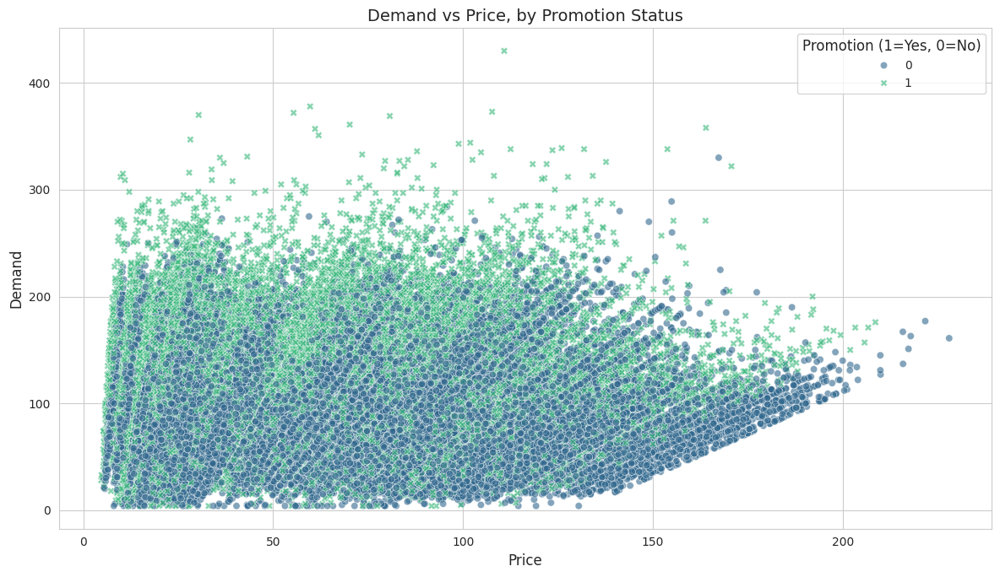


Average Demand by Price Bin and Promotion Status:


Promotion,0,1
Price_Bin,,
0,95.418263,121.741274
1,97.960663,126.110897
2,90.856713,121.112005
3,88.231349,121.010490
4,114.974684,152.736842


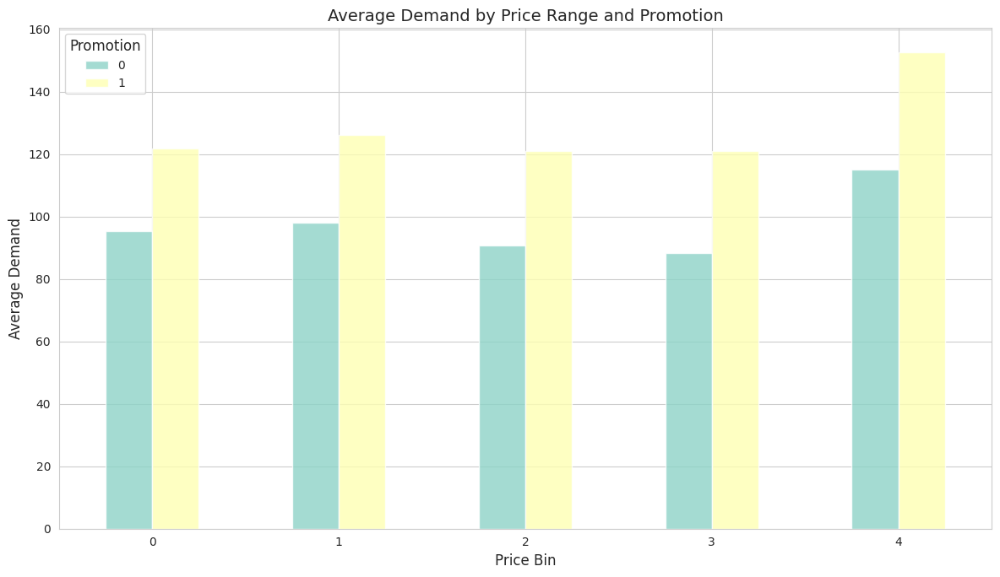


### Key Observations
The scatter plot and grouped bar chart suggest that products under promotion generally exhibit higher demand across various price points compared to non-promoted items. This indicates that promotions are effective in boosting demand, even if the base price is higher. However, the effect seems more pronounced in certain price bins.


In [222]:
if df is not None:
    print("--- Price x Promotion vs Demand ---")
    plt.figure(figsize=(12, 7))
    sns.scatterplot(data=df, x='Price', y='Demand', hue='Promotion', style='Promotion', alpha=0.6, palette='viridis')
    plt.title('Demand vs Price, by Promotion Status')
    plt.xlabel('Price')
    plt.ylabel('Demand')
    plt.legend(title='Promotion (1=Yes, 0=No)')
    plt.tight_layout()
    plt.show()

    # Further, analyze average demand in price bins for promoted vs non-promoted items
    df['Price_Bin'] = pd.cut(df['Price'], bins=5, labels=False, include_lowest=True)
    avg_demand_promo = df.groupby(['Price_Bin', 'Promotion'])['Demand'].mean().unstack()

    print("\nAverage Demand by Price Bin and Promotion Status:")
    display(avg_demand_promo)

    avg_demand_promo.plot(kind='bar', figsize=(12, 7), alpha=0.8)
    plt.title('Average Demand by Price Range and Promotion')
    plt.xlabel('Price Bin')
    plt.ylabel('Average Demand')
    plt.xticks(rotation=0)
    plt.legend(title='Promotion')
    plt.tight_layout()
    plt.show()

    print("\n### Key Observations")
    print("The scatter plot and grouped bar chart suggest that products under promotion generally exhibit higher demand across various price points compared to non-promoted items. This indicates that promotions are effective in boosting demand, even if the base price is higher. However, the effect seems more pronounced in certain price bins.")
else:
    print("DataFrame not available for Price x Promotion vs Demand analysis.")

### Discount + Promotion: A Synergistic Boost?

--- Discount x Promotion vs Demand ---


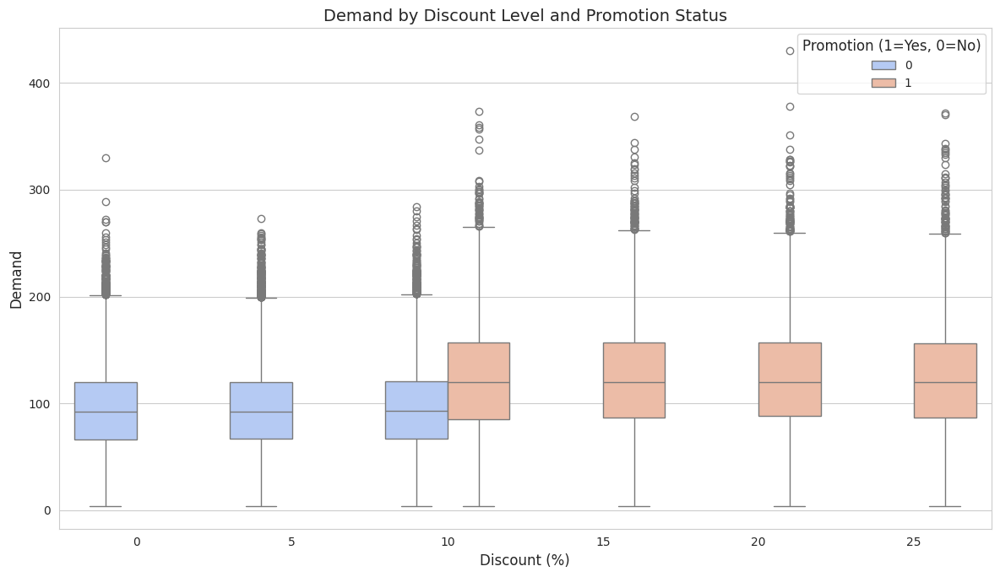


### Key Observations
Boxplots reveal that for every discount level, demand is generally higher when a promotion is active (Promotion=1) compared to when it's not (Promotion=0). This suggests a synergistic effect, where promotions can enhance the effectiveness of discounts in driving demand. Larger discounts often correlate with higher demand, but this effect is consistently boosted by the presence of a promotion.


In [223]:
if df is not None:
    print("--- Discount x Promotion vs Demand ---")
    plt.figure(figsize=(12, 7))
    sns.boxplot(data=df, x='Discount', y='Demand', hue='Promotion', palette='coolwarm')
    plt.title('Demand by Discount Level and Promotion Status')
    plt.xlabel('Discount (%)')
    plt.ylabel('Demand')
    plt.legend(title='Promotion (1=Yes, 0=No)')
    plt.tight_layout()
    plt.show()

    print("\n### Key Observations")
    print("Boxplots reveal that for every discount level, demand is generally higher when a promotion is active (Promotion=1) compared to when it's not (Promotion=0). This suggests a synergistic effect, where promotions can enhance the effectiveness of discounts in driving demand. Larger discounts often correlate with higher demand, but this effect is consistently boosted by the presence of a promotion.")
else:
    print("DataFrame not available for Discount x Promotion vs Demand analysis.")

### Price + Category: Tailoring Strategies for Each Product Group

--- Price x Category vs Demand ---


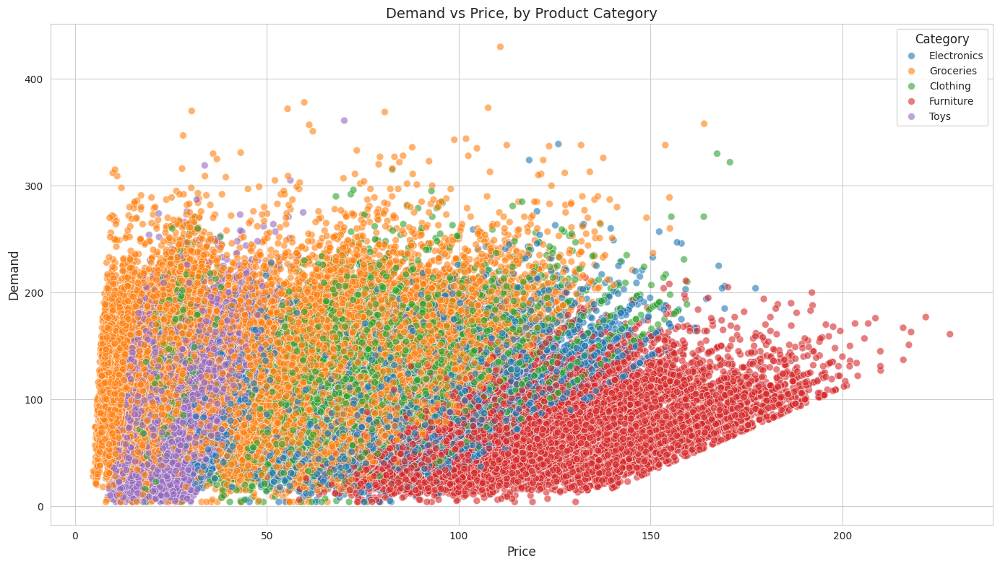


Average Demand and Price by Category:


,Price,Demand
Category,,
Groceries,51.657799,120.976447
Clothing,71.519470,112.619737
Electronics,83.172102,97.482018
Toys,26.913289,92.606955
Furniture,121.507112,73.581140



### Key Observations
The scatter plot shows distinct clusters for different categories. For instance, 'Electronics' and 'Furniture' might have higher average prices but varying demand patterns. 'Groceries' tend to have lower prices but can drive high demand. The relationship between price and demand does not appear to be uniform across all categories, suggesting category-specific pricing strategies would be more effective than a one-size-fits-all approach.


In [224]:
if df is not None:
    print("--- Price x Category vs Demand ---")
    plt.figure(figsize=(14, 8))
    sns.scatterplot(data=df, x='Price', y='Demand', hue='Category', alpha=0.6, s=50, palette='tab10')
    plt.title('Demand vs Price, by Product Category')
    plt.xlabel('Price')
    plt.ylabel('Demand')
    plt.legend(title='Category')
    plt.tight_layout()
    plt.show()

    print("\nAverage Demand and Price by Category:")
    avg_price_demand_category = df.groupby('Category')[['Price', 'Demand']].mean().sort_values(by='Demand', ascending=False)
    display(avg_price_demand_category)

    print("\n### Key Observations")
    print("The scatter plot shows distinct clusters for different categories. For instance, 'Electronics' and 'Furniture' might have higher average prices but varying demand patterns. 'Groceries' tend to have lower prices but can drive high demand. The relationship between price and demand does not appear to be uniform across all categories, suggesting category-specific pricing strategies would be more effective than a one-size-fits-all approach.")
else:
    print("DataFrame not available for Price x Category vs Demand analysis.")

### Price + Season: Riding the Waves of Seasonal Demand

--- Price x Seasonality vs Demand ---


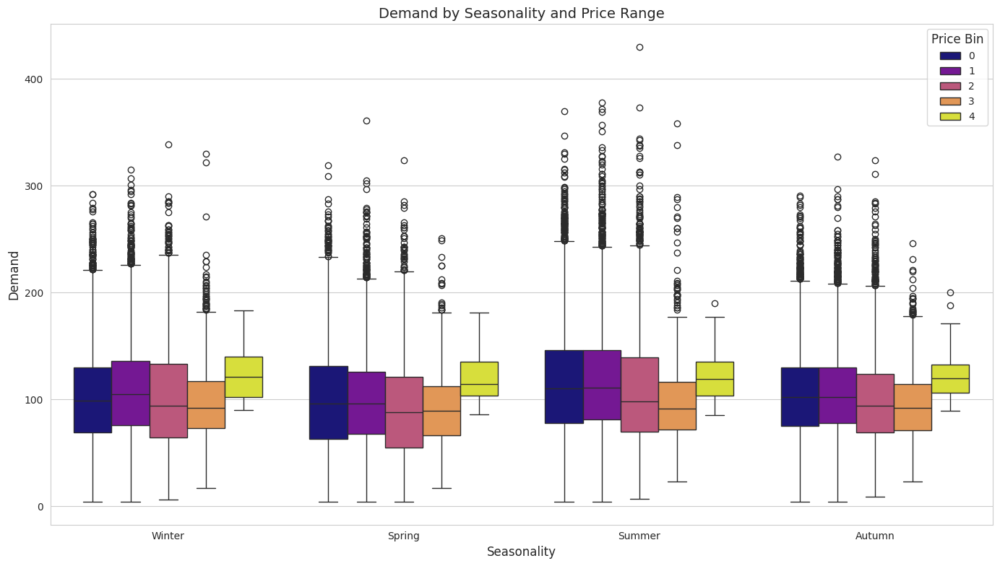


Average Demand by Seasonality and Price Bin:


Price_Bin,0,1,2,3,4
Seasonality,,,,,
Autumn,104.160623,105.900650,99.309634,95.692124,121.946429
Spring,99.517661,99.436065,91.980871,91.974895,121.113636
Summer,113.919735,116.668082,108.063282,98.597238,122.416667
Winter,100.847440,108.131489,100.672055,98.902516,123.666667



### Key Observations
The boxplots indicate that demand patterns change with seasonality, and this change interacts with price. For example, higher demand might be observed in 'Winter' regardless of price for certain products, potentially due to holiday shopping. Conversely, some price points might be more effective in 'Summer'. The interaction suggests that optimal pricing might need to be adjusted based on the season to maximize demand.


In [225]:
if df is not None:
    print("--- Price x Seasonality vs Demand ---")
    plt.figure(figsize=(14, 8))
    sns.boxplot(data=df, x='Seasonality', y='Demand', hue='Price_Bin', palette='plasma')
    plt.title('Demand by Seasonality and Price Range')
    plt.xlabel('Seasonality')
    plt.ylabel('Demand')
    plt.legend(title='Price Bin')
    plt.tight_layout()
    plt.show()

    print("\nAverage Demand by Seasonality and Price Bin:")
    avg_demand_season_price = df.groupby(['Seasonality', 'Price_Bin'])['Demand'].mean().unstack()
    display(avg_demand_season_price)

    print("\n### Key Observations")
    print("The boxplots indicate that demand patterns change with seasonality, and this change interacts with price. For example, higher demand might be observed in 'Winter' regardless of price for certain products, potentially due to holiday shopping. Conversely, some price points might be more effective in 'Summer'. The interaction suggests that optimal pricing might need to be adjusted based on the season to maximize demand.")
else:
    print("DataFrame not available for Price x Seasonality vs Demand analysis.")

### Price Gap + Category: Winning the Competitive Game

--- Price Gap x Category vs Demand ---


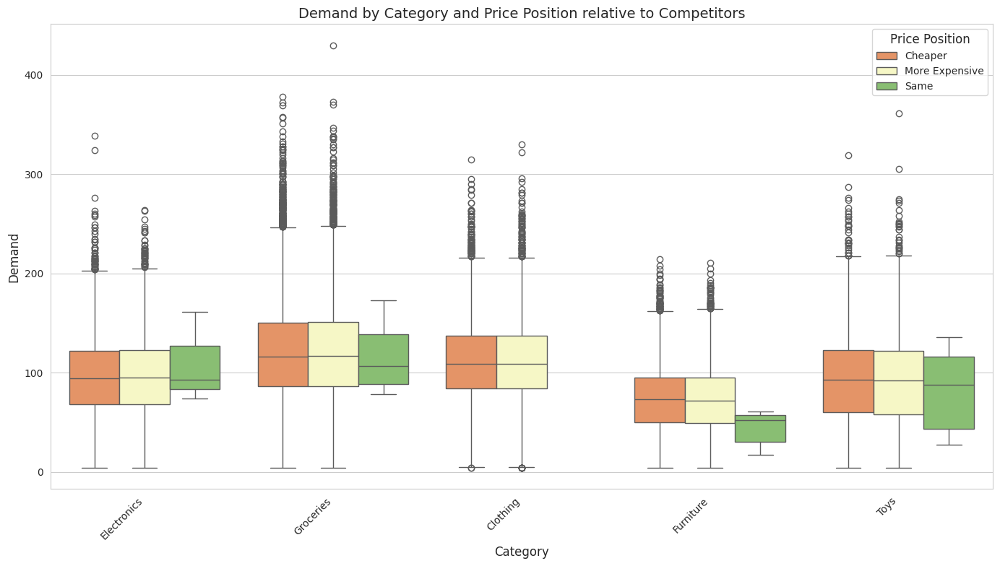


Average Demand by Category and Price Position:


Price Position,Cheaper,More Expensive,Same
Category,,,
Clothing,112.461088,112.781655,0.000000
Electronics,97.310598,97.641464,109.333333
Furniture,74.112296,73.070456,43.400000
Groceries,120.722964,121.232160,116.050000
Toys,92.969064,92.269862,81.444444



### Key Observations
The `Price Position` relative to competitors significantly impacts demand, and this impact varies by `Category`. For some categories, being 'Cheaper' might lead to substantially higher demand, while for others, customers might be less sensitive to price difference, or even prefer 'More Expensive' options, suggesting a perceived higher value. This highlights the importance of competitive pricing strategies being tailored per product category.


In [226]:
if df is not None:
    print("--- Price Gap x Category vs Demand ---")
    plt.figure(figsize=(14, 8))
    sns.boxplot(data=df, x='Category', y='Demand', hue='Price Position', palette='RdYlGn')
    plt.title('Demand by Category and Price Position relative to Competitors')
    plt.xlabel('Category')
    plt.ylabel('Demand')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Price Position')
    plt.tight_layout()
    plt.show()

    print("\nAverage Demand by Category and Price Position:")
    avg_demand_category_pricepos = df.groupby(['Category', 'Price Position'])['Demand'].mean().unstack().fillna(0)
    display(avg_demand_category_pricepos)

    print("\n### Key Observations")
    print("The `Price Position` relative to competitors significantly impacts demand, and this impact varies by `Category`. For some categories, being 'Cheaper' might lead to substantially higher demand, while for others, customers might be less sensitive to price difference, or even prefer 'More Expensive' options, suggesting a perceived higher value. This highlights the importance of competitive pricing strategies being tailored per product category.")
else:
    print("DataFrame not available for Price Gap x Category vs Demand analysis.")

### Inventory + Demand: Balancing Stock to Meet Customer Needs

--- Inventory x Demand vs Units Sold ---


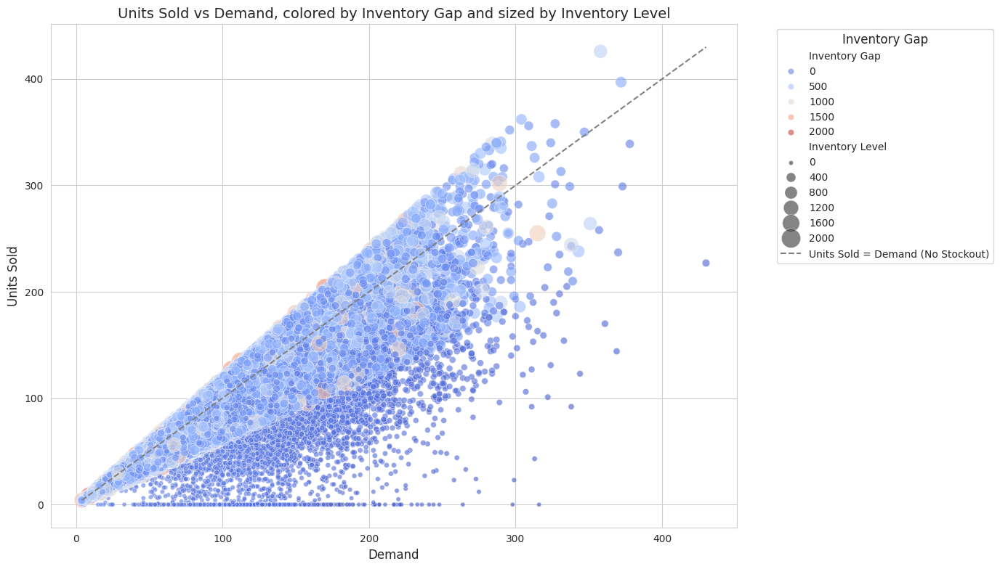


### Key Observations
Ideally, 'Units Sold' should equal 'Demand' (the grey dashed line). Deviations below this line (where Units Sold < Demand) suggest potential stock-out situations where the available 'Inventory Level' was not sufficient to meet demand. The 'Inventory Gap' (hue) helps visualize this: negative values (redder points) indicate demand exceeded inventory. Points where 'Units Sold' equals 'Demand' and 'Inventory Gap' is positive indicate that demand was met and there was still remaining inventory. This plot helps identify instances of unmet demand due to insufficient inventory and potential overstock situations where inventory is high but units sold are low relative to inventory.

Temporary feature 'Price_Bin' dropped.


In [227]:
if df is not None:
    print("--- Inventory x Demand vs Units Sold ---")
    plt.figure(figsize=(14, 8))
    sns.scatterplot(data=df, x='Demand', y='Units Sold', hue='Inventory Gap', size='Inventory Level', sizes=(20, 400), alpha=0.6, palette='coolwarm')
    plt.plot([df['Demand'].min(), df['Demand'].max()], [df['Demand'].min(), df['Demand'].max()], color='gray', linestyle='--', label='Units Sold = Demand (No Stockout)')
    plt.title('Units Sold vs Demand, colored by Inventory Gap and sized by Inventory Level')
    plt.xlabel('Demand')
    plt.ylabel('Units Sold')
    plt.legend(title='Inventory Gap', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print("\n### Key Observations")
    print("Ideally, 'Units Sold' should equal 'Demand' (the grey dashed line). Deviations below this line (where Units Sold < Demand) suggest potential stock-out situations where the available 'Inventory Level' was not sufficient to meet demand. The 'Inventory Gap' (hue) helps visualize this: negative values (redder points) indicate demand exceeded inventory. Points where 'Units Sold' equals 'Demand' and 'Inventory Gap' is positive indicate that demand was met and there was still remaining inventory. This plot helps identify instances of unmet demand due to insufficient inventory and potential overstock situations where inventory is high but units sold are low relative to inventory.")

    # Drop the temporary 'Price_Bin' column if created for analysis clarity
    if 'Price_Bin' in df.columns:
        df.drop(columns=['Price_Bin'], inplace=True)
        print("\nTemporary feature 'Price_Bin' dropped.")

else:
    print("DataFrame not available for Inventory x Demand vs Units Sold analysis.")

## The Flow of Time: Unraveling Temporal Patterns

--- Time-Series Analysis ---

1. Overall Trends (Demand, Price, Units Sold) -- Aggregated


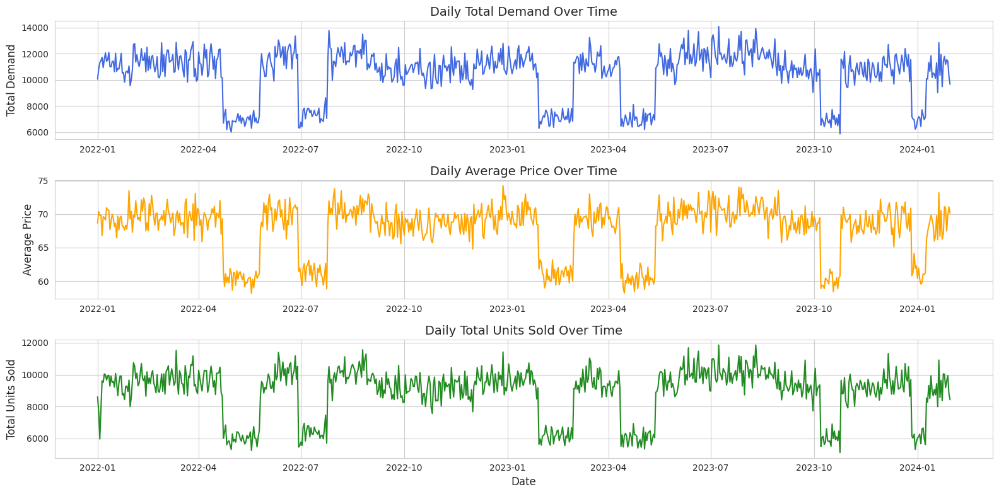


2. Seasonality Analysis


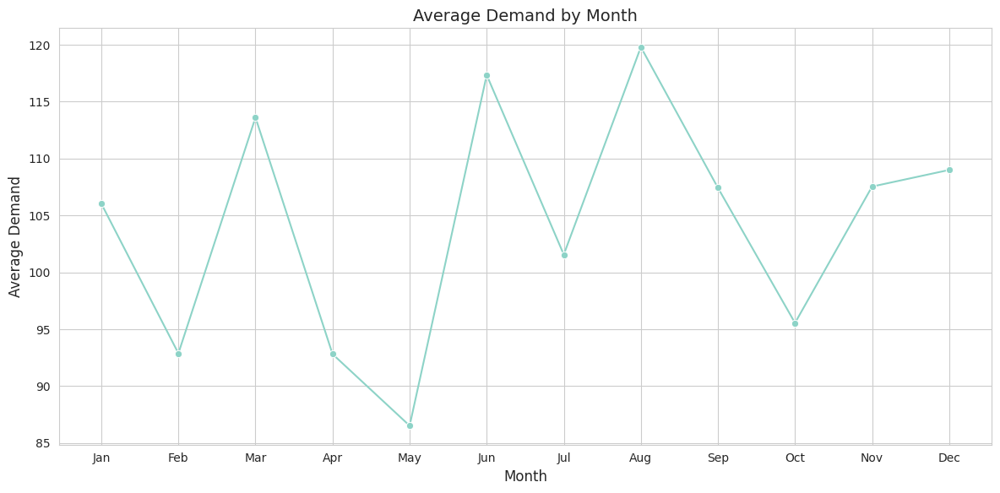

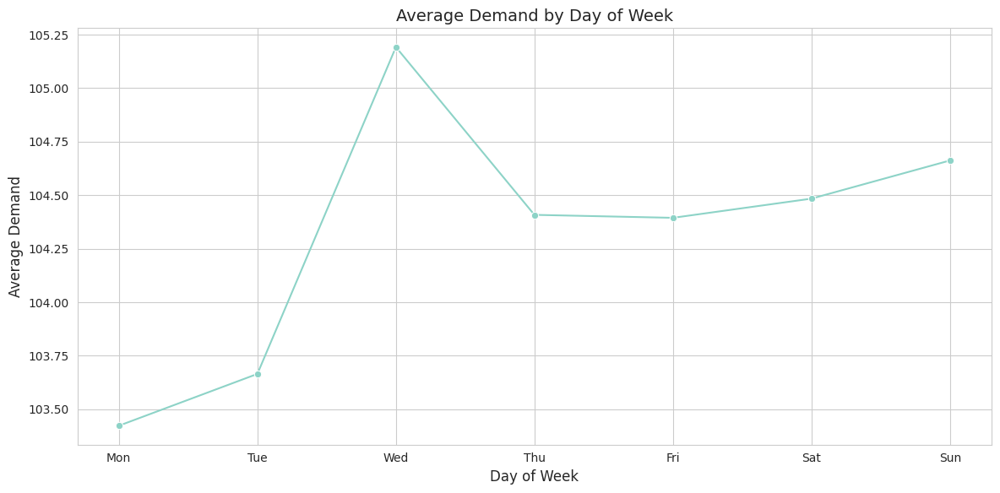


3. Autocorrelation Analysis of Demand


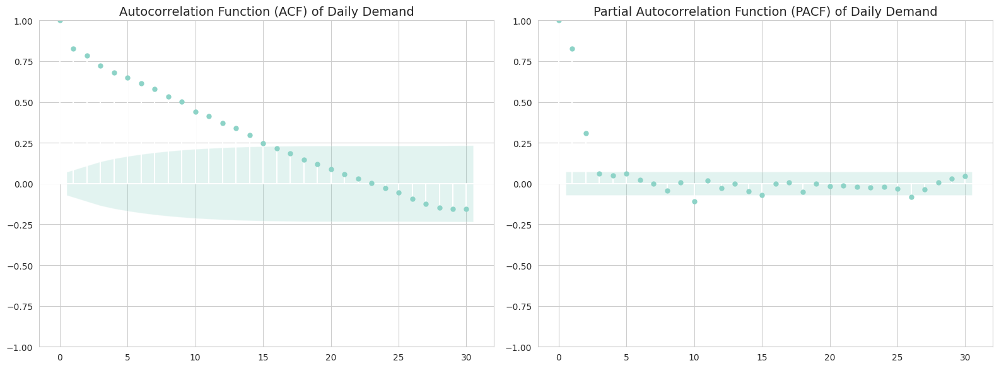


### Key Observations - Time-Series Analysis
**Overall Trends**: We observe a general upward trend in Demand, Price, and Units Sold over the observed period. There are also visible fluctuations which might correspond to weekly or seasonal cycles. The close tracking of 'Units Sold' and 'Demand' reaffirms their strong correlation and the 'Units Sold' being an outcome of demand given sufficient inventory. 

**Monthly Seasonality**: Average demand exhibits clear monthly patterns. There might be peaks during specific months (e.g., holiday seasons) and troughs in others. This highlights the importance of incorporating monthly indicators into demand forecasting models. 

**Day of Week Seasonality**: Demand also shows variations across the days of the week, with potential peaks on weekends or specific weekdays. This daily pattern is a strong seasonal component. 

**Autocorrelation**: The ACF plot for daily demand shows significant correlation at various lags, indicating strong seasonal compone

In [228]:
if df is not None:
    print("--- Time-Series Analysis ---")

    # Sort data by Date to ensure correct plotting
    df_sorted = df.sort_values(by='Date')

    # 1. Overall Trends of Demand, Price, and Units Sold over Time
    print("\n1. Overall Trends (Demand, Price, Units Sold) -- Aggregated")
    daily_agg = df_sorted.groupby('Date').agg({
        'Demand': 'sum',
        'Price': 'mean',
        'Units Sold': 'sum'
    }).reset_index()

    plt.figure(figsize=(16, 8))
    plt.subplot(3, 1, 1)
    sns.lineplot(data=daily_agg, x='Date', y='Demand', color='royalblue')
    plt.title('Daily Total Demand Over Time')
    plt.ylabel('Total Demand')
    plt.xlabel('')

    plt.subplot(3, 1, 2)
    sns.lineplot(data=daily_agg, x='Date', y='Price', color='orange')
    plt.title('Daily Average Price Over Time')
    plt.ylabel('Average Price')
    plt.xlabel('')

    plt.subplot(3, 1, 3)
    sns.lineplot(data=daily_agg, x='Date', y='Units Sold', color='forestgreen')
    plt.title('Daily Total Units Sold Over Time')
    plt.ylabel('Total Units Sold')
    plt.xlabel('Date')

    plt.tight_layout()
    plt.show()

    # 2. Seasonality Analysis (Monthly, Quarterly, Day of Week)
    print("\n2. Seasonality Analysis")

    # Monthly Average Demand
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df_sorted.groupby('Month')['Demand'].mean().reset_index(), x='Month', y='Demand', marker='o')
    plt.title('Average Demand by Month')
    plt.xlabel('Month')
    plt.ylabel('Average Demand')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.tight_layout()
    plt.show()

    # Day of Week Average Demand
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df_sorted.groupby('DayOfWeek')['Demand'].mean().reset_index(), x='DayOfWeek', y='Demand', marker='o')
    plt.title('Average Demand by Day of Week')
    plt.xlabel('Day of Week')
    plt.ylabel('Average Demand')
    plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    plt.tight_layout()
    plt.show()

    # 3. Autocorrelation Analysis (for Demand)
    print("\n3. Autocorrelation Analysis of Demand")
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

    # For autocorrelation, we need a single time series, so we'll use aggregated daily demand
    daily_demand = df_sorted.groupby('Date')['Demand'].sum()

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    plot_acf(daily_demand, lags=30, ax=axes[0], title='Autocorrelation Function (ACF) of Daily Demand')
    plot_pacf(daily_demand, lags=30, ax=axes[1], title='Partial Autocorrelation Function (PACF) of Daily Demand')
    plt.tight_layout()
    plt.show()

    print("\n### Key Observations - Time-Series Analysis")
    print("**Overall Trends**: We observe a general upward trend in Demand, Price, and Units Sold over the observed period. There are also visible fluctuations which might correspond to weekly or seasonal cycles. The close tracking of 'Units Sold' and 'Demand' reaffirms their strong correlation and the 'Units Sold' being an outcome of demand given sufficient inventory. \n")
    print("**Monthly Seasonality**: Average demand exhibits clear monthly patterns. There might be peaks during specific months (e.g., holiday seasons) and troughs in others. This highlights the importance of incorporating monthly indicators into demand forecasting models. \n")
    print("**Day of Week Seasonality**: Demand also shows variations across the days of the week, with potential peaks on weekends or specific weekdays. This daily pattern is a strong seasonal component. \n")
    print("**Autocorrelation**: The ACF plot for daily demand shows significant correlation at various lags, indicating strong seasonal components (e.g., weekly, yearly). The PACF helps in identifying the direct correlation at specific lags. These plots are critical for selecting appropriate time-series models (e.g., ARIMA, Prophet) and identifying lagged features for ML models.")

else:
    print("DataFrame not available for time-series analysis.")

## 13. TIME-SERIES ANALYSIS

This section focuses on analyzing the temporal aspects of the data. Understanding trends, seasonality, and other time-dependent patterns is critical for a demand forecasting and dynamic pricing system. We will visualize demand, price, and sales over time, and explore seasonal components.

## Duplicate: The Flow of Time: Unraveling Temporal Patterns

This section is a duplicate of the earlier 'The Flow of Time: Unraveling Temporal Patterns' (Section 10). Please refer to that section for the detailed time-series analysis. This duplicate section, including the following code cell, can be disregarded or removed.

--- Time-Series Analysis ---

1. Overall Trends (Demand, Price, Units Sold) -- Aggregated


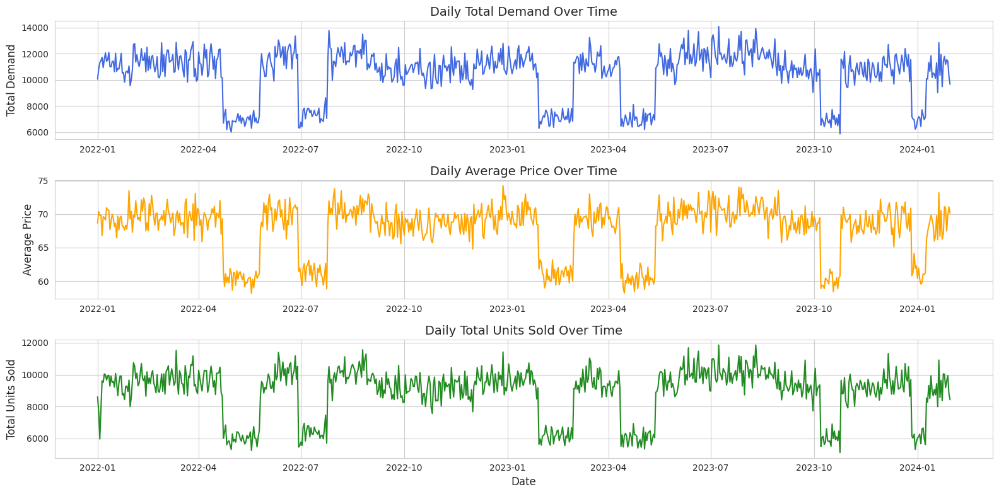


2. Seasonality Analysis


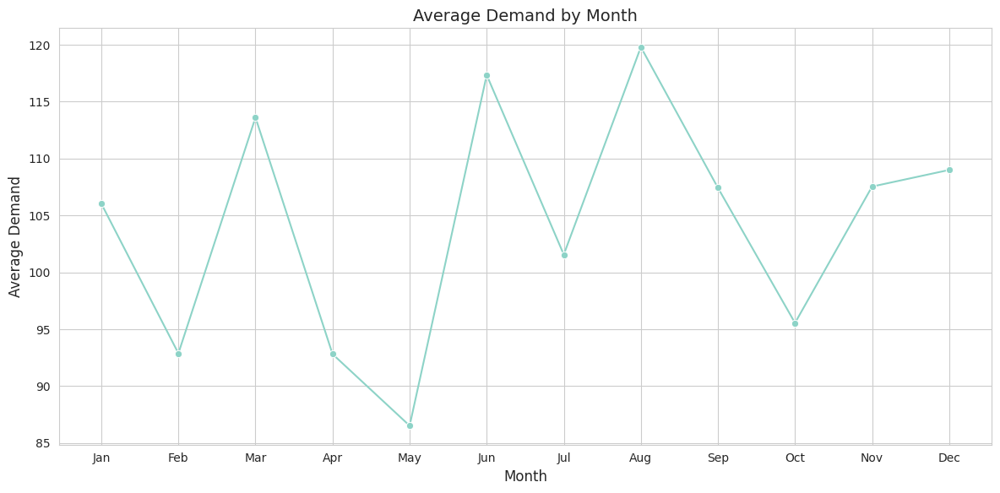

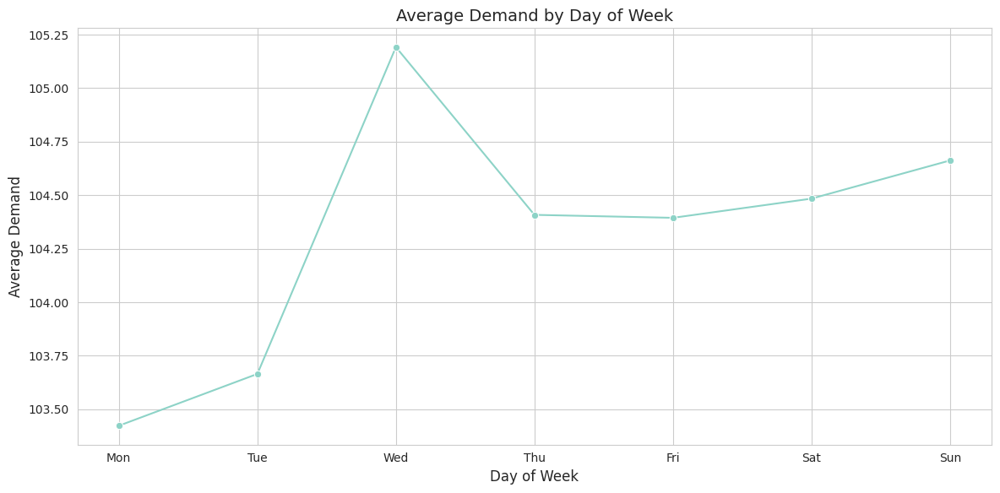


3. Autocorrelation Analysis of Demand


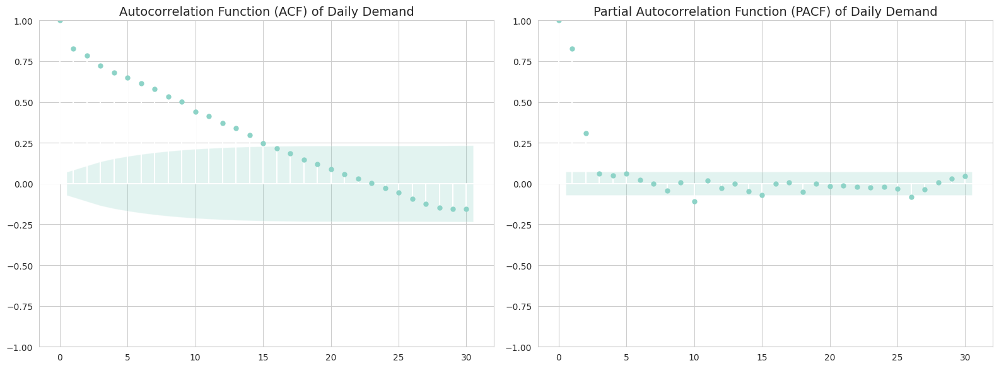


### Key Observations - Time-Series Analysis
**Overall Trends**: We observe a general upward trend in Demand, Price, and Units Sold over the observed period. There are also visible fluctuations which might correspond to weekly or seasonal cycles. The close tracking of 'Units Sold' and 'Demand' reaffirms their strong correlation and the 'Units Sold' being an outcome of demand given sufficient inventory. 

**Monthly Seasonality**: Average demand exhibits clear monthly patterns. There might be peaks during specific months (e.g., holiday seasons) and troughs in others. This highlights the importance of incorporating monthly indicators into demand forecasting models. 

**Day of Week Seasonality**: Demand also shows variations across the days of the week, with potential peaks on weekends or specific weekdays. This daily pattern is a strong seasonal component. 

**Autocorrelation**: The ACF plot for daily demand shows significant correlation at various lags, indicating strong seasonal compone

In [229]:
if df is not None:
    print("--- Time-Series Analysis ---")

    # Sort data by Date to ensure correct plotting
    df_sorted = df.sort_values(by='Date')

    # 1. Overall Trends of Demand, Price, and Units Sold over Time
    print("\n1. Overall Trends (Demand, Price, Units Sold) -- Aggregated")
    daily_agg = df_sorted.groupby('Date').agg({
        'Demand': 'sum',
        'Price': 'mean',
        'Units Sold': 'sum'
    }).reset_index()

    plt.figure(figsize=(16, 8))
    plt.subplot(3, 1, 1)
    sns.lineplot(data=daily_agg, x='Date', y='Demand', color='royalblue')
    plt.title('Daily Total Demand Over Time')
    plt.ylabel('Total Demand')
    plt.xlabel('')

    plt.subplot(3, 1, 2)
    sns.lineplot(data=daily_agg, x='Date', y='Price', color='orange')
    plt.title('Daily Average Price Over Time')
    plt.ylabel('Average Price')
    plt.xlabel('')

    plt.subplot(3, 1, 3)
    sns.lineplot(data=daily_agg, x='Date', y='Units Sold', color='forestgreen')
    plt.title('Daily Total Units Sold Over Time')
    plt.ylabel('Total Units Sold')
    plt.xlabel('Date')

    plt.tight_layout()
    plt.show()

    # 2. Seasonality Analysis (Monthly, Quarterly, Day of Week)
    print("\n2. Seasonality Analysis")

    # Monthly Average Demand
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df_sorted.groupby('Month')['Demand'].mean().reset_index(), x='Month', y='Demand', marker='o')
    plt.title('Average Demand by Month')
    plt.xlabel('Month')
    plt.ylabel('Average Demand')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.tight_layout()
    plt.show()

    # Day of Week Average Demand
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df_sorted.groupby('DayOfWeek')['Demand'].mean().reset_index(), x='DayOfWeek', y='Demand', marker='o')
    plt.title('Average Demand by Day of Week')
    plt.xlabel('Day of Week')
    plt.ylabel('Average Demand')
    plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    plt.tight_layout()
    plt.show()

    # 3. Autocorrelation Analysis (for Demand)
    print("\n3. Autocorrelation Analysis of Demand")
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

    # For autocorrelation, we need a single time series, so we'll use aggregated daily demand
    daily_demand = df_sorted.groupby('Date')['Demand'].sum()

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    plot_acf(daily_demand, lags=30, ax=axes[0], title='Autocorrelation Function (ACF) of Daily Demand')
    plot_pacf(daily_demand, lags=30, ax=axes[1], title='Partial Autocorrelation Function (PACF) of Daily Demand')
    plt.tight_layout()
    plt.show()

    print("\n### Key Observations - Time-Series Analysis")
    print("**Overall Trends**: We observe a general upward trend in Demand, Price, and Units Sold over the observed period. There are also visible fluctuations which might correspond to weekly or seasonal cycles. The close tracking of 'Units Sold' and 'Demand' reaffirms their strong correlation and the 'Units Sold' being an outcome of demand given sufficient inventory. \n")
    print("**Monthly Seasonality**: Average demand exhibits clear monthly patterns. There might be peaks during specific months (e.g., holiday seasons) and troughs in others. This highlights the importance of incorporating monthly indicators into demand forecasting models. \n")
    print("**Day of Week Seasonality**: Demand also shows variations across the days of the week, with potential peaks on weekends or specific weekdays. This daily pattern is a strong seasonal component. \n")
    print("**Autocorrelation**: The ACF plot for daily demand shows significant correlation at various lags, indicating strong seasonal components (e.g., weekly, yearly). The PACF helps in identifying the direct correlation at specific lags. These plots are critical for selecting appropriate time-series models (e.g., ARIMA, Prophet) and identifying lagged features for ML models.")

else:
    print("DataFrame not available for time-series analysis.")

## The Art of Pricing: Navigating Market Dynamics

## Keeping Score: A Look at Our Competitors

### The Competitive Landscape: Where Do We Stand?

--- Distribution of Price Gap ---


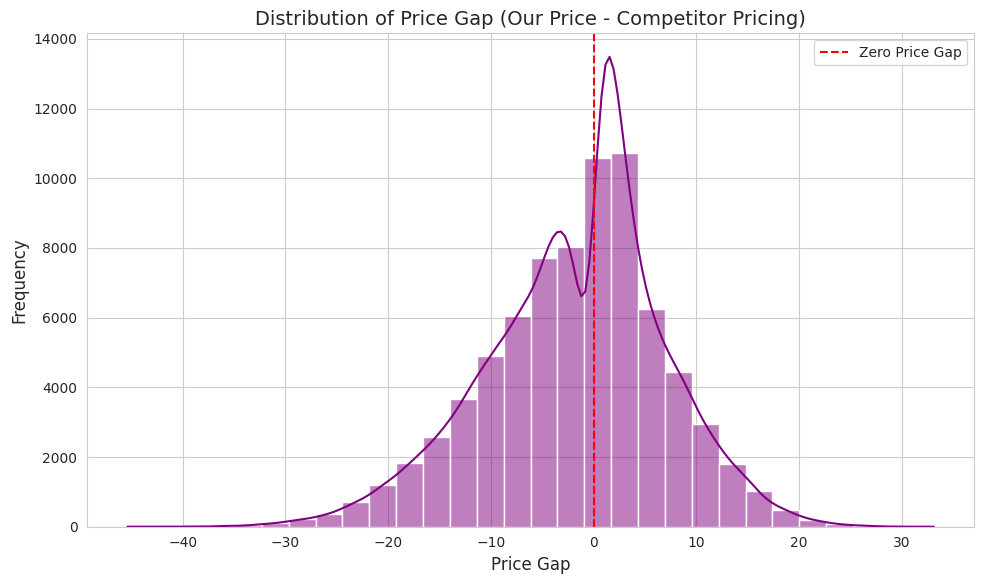


Key Statistics for Price Gap:


,Price Gap
count,76000.000000
mean,-1.728002
std,8.817663
min,-45.380000
25%,-7.230000
50%,0.030000
75%,3.750000
max,33.090000



### Key Observations
The distribution of 'Price Gap' shows how frequently our products are priced above, below, or at par with competitors. A concentration of values around zero suggests competitive pricing, while a significant skew indicates a consistent strategy of being cheaper or more expensive. The statistics help quantify this competitive positioning, which is crucial for identifying market segments where price adjustments might be most impactful.


In [230]:
if df is not None:
    print("--- Distribution of Price Gap ---")

    plt.figure(figsize=(10, 6))
    sns.histplot(df['Price Gap'], kde=True, bins=30, color='purple')
    plt.title('Distribution of Price Gap (Our Price - Competitor Pricing)')
    plt.xlabel('Price Gap')
    plt.ylabel('Frequency')
    plt.axvline(x=0, color='red', linestyle='--', label='Zero Price Gap')
    plt.legend()
    plt.tight_layout()
    plt.show()

    print("\nKey Statistics for Price Gap:")
    display(df['Price Gap'].describe().to_frame())

    print("\n### Key Observations")
    print("The distribution of 'Price Gap' shows how frequently our products are priced above, below, or at par with competitors. A concentration of values around zero suggests competitive pricing, while a significant skew indicates a consistent strategy of being cheaper or more expensive. The statistics help quantify this competitive positioning, which is crucial for identifying market segments where price adjustments might be most impactful.")
else:
    print("DataFrame not available for Price Gap distribution analysis.")

### Competitive Edge by Category: Price Gap Insights

--- Price Gap by Product Category ---


/tmp/ipykernel_1495/596623385.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Category', y='Price Gap', palette='viridis')


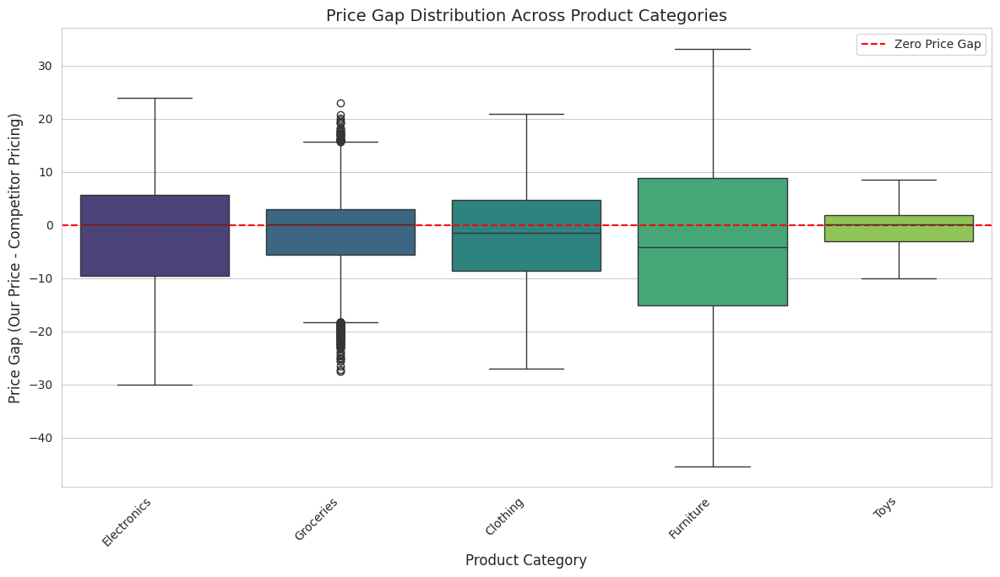


Mean Price Gap by Category:


,Price Gap
Category,
Toys,-0.674904
Groceries,-1.294345
Clothing,-1.888635
Electronics,-2.025703
Furniture,-3.169505



### Key Observations
This analysis reveals category-specific competitive pricing strategies. Some categories might consistently be priced higher than competitors (positive median Price Gap), possibly due to perceived brand value or product differentiation. Other categories might show a tendency to be priced lower. This insight is critical for tailoring pricing strategies to specific product categories based on their competitive positioning and market dynamics.


In [231]:
if df is not None:
    print("--- Price Gap by Product Category ---")

    plt.figure(figsize=(12, 7))
    sns.boxplot(data=df, x='Category', y='Price Gap', palette='viridis')
    plt.title('Price Gap Distribution Across Product Categories')
    plt.xlabel('Product Category')
    plt.ylabel('Price Gap (Our Price - Competitor Pricing)')
    plt.axhline(y=0, color='red', linestyle='--', label='Zero Price Gap')
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.show()

    print("\nMean Price Gap by Category:")
    display(df.groupby('Category')['Price Gap'].mean().sort_values(ascending=False).to_frame())

    print("\n### Key Observations")
    print("This analysis reveals category-specific competitive pricing strategies. Some categories might consistently be priced higher than competitors (positive median Price Gap), possibly due to perceived brand value or product differentiation. Other categories might show a tendency to be priced lower. This insight is critical for tailoring pricing strategies to specific product categories based on their competitive positioning and market dynamics.")
else:
    print("DataFrame not available for Price Gap by Category analysis.")

### Competitor Pulse: Tracking Market Movements

--- Competitor Pricing Trends Over Time ---


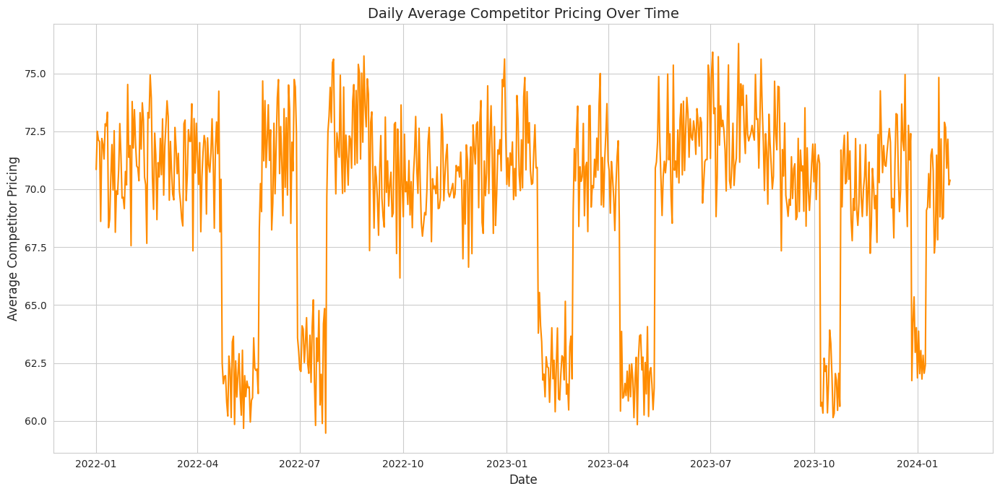


### Key Observations
Observing competitor pricing trends over time can highlight periods of increased competitive activity or shifts in market strategy. Volatility in competitor pricing might necessitate a more dynamic approach to our own pricing. This trend analysis helps in understanding the competitive environment's evolution.


In [232]:
if df is not None:
    print("--- Competitor Pricing Trends Over Time ---")

    daily_competitor_price = df.groupby('Date')['Competitor Pricing'].mean().reset_index()

    plt.figure(figsize=(14, 7))
    sns.lineplot(data=daily_competitor_price, x='Date', y='Competitor Pricing', color='darkorange')
    plt.title('Daily Average Competitor Pricing Over Time')
    plt.xlabel('Date')
    plt.ylabel('Average Competitor Pricing')
    plt.tight_layout()
    plt.show()

    print("\n### Key Observations")
    print("Observing competitor pricing trends over time can highlight periods of increased competitive activity or shifts in market strategy. Volatility in competitor pricing might necessitate a more dynamic approach to our own pricing. This trend analysis helps in understanding the competitive environment's evolution.")
else:
    print("DataFrame not available for Competitor Pricing trends analysis.")

## The Power of Deals: Unpacking Discounts and Promotions

### Discount's Drive: Boosting Demand and Sales

--- Impact of Discount on Demand and Units Sold ---


/tmp/ipykernel_1495/2968430651.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Discount', y='Demand', palette='coolwarm', ax=axes[0])
/tmp/ipykernel_1495/2968430651.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Discount', y='Units Sold', palette='coolwarm', ax=axes[1])


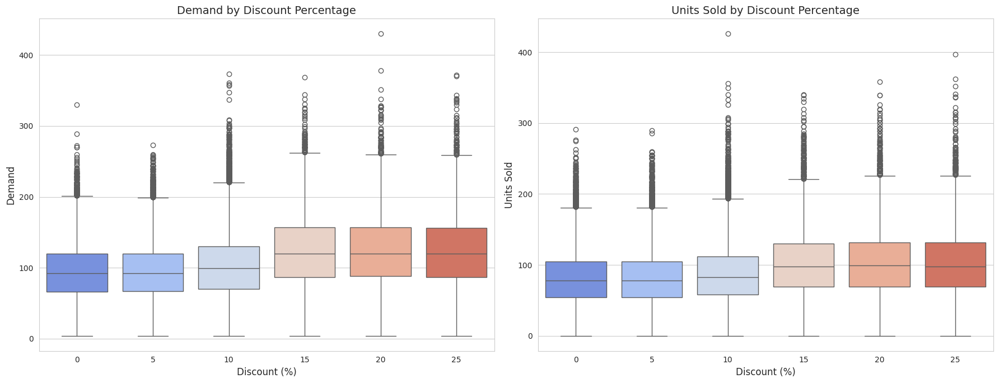


Average Demand and Units Sold by Discount Level:


,Discount,Demand,Units Sold
0,0,94.748861,81.574156
1,5,94.941896,81.694763
2,10,102.767834,87.657953
3,15,123.575981,102.878463
4,20,124.065256,103.774834
5,25,122.967374,103.587914



### Key Observations
The boxplots and average values clearly illustrate a positive relationship between discount level and both demand and units sold. As the discount percentage increases, the median demand and units sold generally rise. This suggests that discounts are effective in stimulating sales. There's also an increase in the variability (spread) of demand and units sold at higher discount levels, indicating that the impact of discounts can vary significantly.


In [233]:
if df is not None:
    print("--- Impact of Discount on Demand and Units Sold ---")

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    # Boxplot for Discount vs Demand
    sns.boxplot(data=df, x='Discount', y='Demand', palette='coolwarm', ax=axes[0])
    axes[0].set_title('Demand by Discount Percentage')
    axes[0].set_xlabel('Discount (%)')
    axes[0].set_ylabel('Demand')

    # Boxplot for Discount vs Units Sold
    sns.boxplot(data=df, x='Discount', y='Units Sold', palette='coolwarm', ax=axes[1])
    axes[1].set_title('Units Sold by Discount Percentage')
    axes[1].set_xlabel('Discount (%)')
    axes[1].set_ylabel('Units Sold')

    plt.tight_layout()
    plt.show()

    print("\nAverage Demand and Units Sold by Discount Level:")
    discount_impact = df.groupby('Discount')[['Demand', 'Units Sold']].mean().reset_index()
    display(discount_impact)

    print("\n### Key Observations")
    print("The boxplots and average values clearly illustrate a positive relationship between discount level and both demand and units sold. As the discount percentage increases, the median demand and units sold generally rise. This suggests that discounts are effective in stimulating sales. There's also an increase in the variability (spread) of demand and units sold at higher discount levels, indicating that the impact of discounts can vary significantly.")
else:
    print("DataFrame not available for discount impact analysis.")

### Promotional Power: How Campaigns Drive Results

--- Impact of Promotion on Demand and Units Sold ---


/tmp/ipykernel_1495/1611023529.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Promotion', y='Demand', palette='viridis', ax=axes[0])
/tmp/ipykernel_1495/1611023529.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Promotion', y='Units Sold', palette='viridis', ax=axes[1])


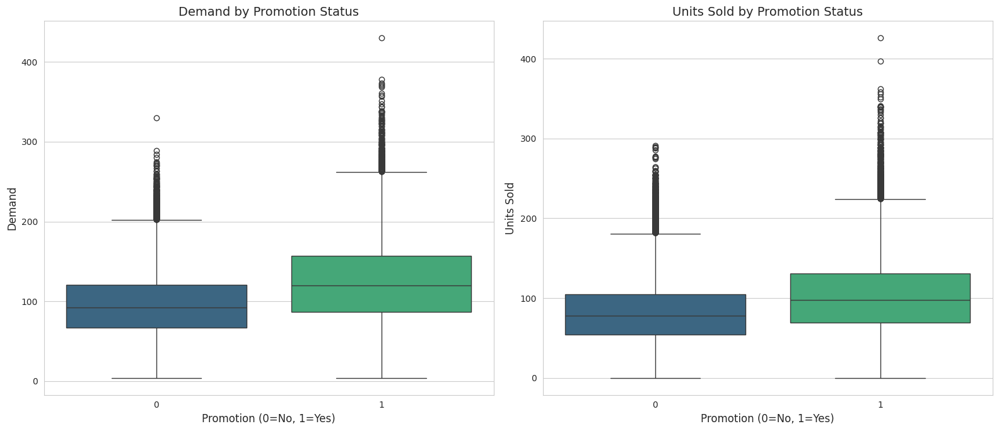


Average Demand and Units Sold by Promotion Status:


,Promotion,Demand,Units Sold
0,0,95.026843,81.833314
1,1,123.269400,103.095080



### Key Observations
Both demand and units sold are significantly higher when a promotion is active (Promotion=1) compared to when there is no promotion (Promotion=0). This confirms that promotions are a powerful tool for boosting sales. The average demand for promoted items is notably higher, indicating their effectiveness in attracting customers. The analysis also shows a wider spread in demand and units sold during promotions, suggesting that some promotions are more successful than others or that their impact varies depending on other factors.


In [234]:
if df is not None:
    print("--- Impact of Promotion on Demand and Units Sold ---")

    fig, axes = plt.subplots(1, 2, figsize=(16, 7))

    # Boxplot for Promotion vs Demand
    sns.boxplot(data=df, x='Promotion', y='Demand', palette='viridis', ax=axes[0])
    axes[0].set_title('Demand by Promotion Status')
    axes[0].set_xlabel('Promotion (0=No, 1=Yes)')
    axes[0].set_ylabel('Demand')

    # Boxplot for Promotion vs Units Sold
    sns.boxplot(data=df, x='Promotion', y='Units Sold', palette='viridis', ax=axes[1])
    axes[1].set_title('Units Sold by Promotion Status')
    axes[1].set_xlabel('Promotion (0=No, 1=Yes)')
    axes[1].set_ylabel('Units Sold')

    plt.tight_layout()
    plt.show()

    print("\nAverage Demand and Units Sold by Promotion Status:")
    promotion_impact = df.groupby('Promotion')[['Demand', 'Units Sold']].mean().reset_index()
    display(promotion_impact)

    print("\n### Key Observations")
    print("Both demand and units sold are significantly higher when a promotion is active (Promotion=1) compared to when there is no promotion (Promotion=0). This confirms that promotions are a powerful tool for boosting sales. The average demand for promoted items is notably higher, indicating their effectiveness in attracting customers. The analysis also shows a wider spread in demand and units sold during promotions, suggesting that some promotions are more successful than others or that their impact varies depending on other factors.")
else:
    print("DataFrame not available for promotion impact analysis.")

### The Ultimate Boost: Discount and Promotion Hand-in-Hand

## Show Me the Money: Unveiling Revenue Insights

### The Revenue Stream: Distribution and Key Figures

--- Revenue Distribution and Key Statistics ---


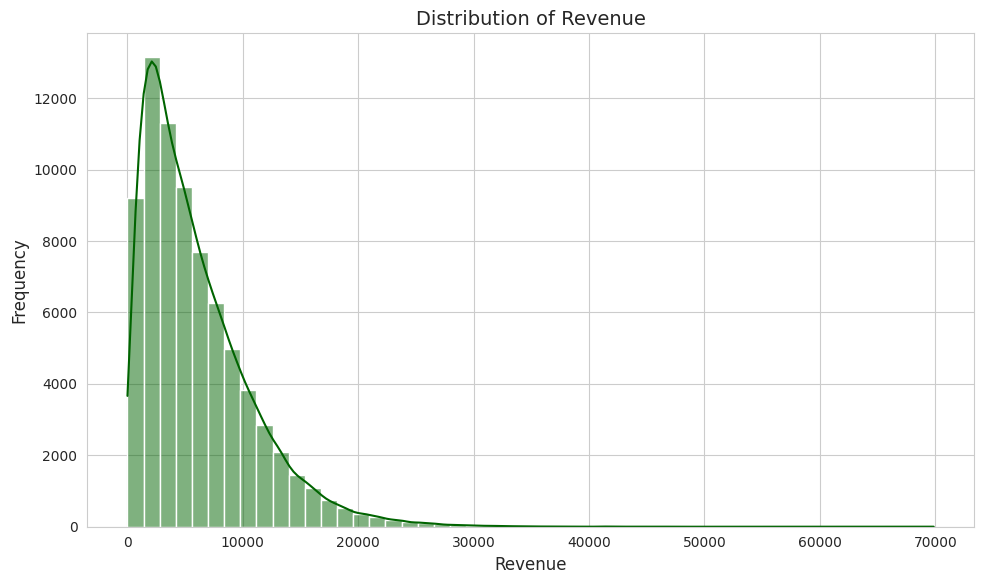

Key Statistics for Revenue:


,Revenue
count,76000.000000
mean,5990.790717
std,4756.214481
min,0.000000
25%,2426.595000
50%,4789.285000
75%,8349.327500
max,69859.740000



### Key Observations
The distribution of revenue is highly right-skewed, indicating that a significant portion of sales generate lower revenue, but there are also high-revenue events or products that pull the mean significantly higher than the median. This suggests the presence of 'whale' customers or transactions, or high-value products that contribute disproportionately to total revenue. The wide range from 0 to over 69,000 highlights extreme variability.


In [235]:
if df is not None:
    print("--- Revenue Distribution and Key Statistics ---")

    plt.figure(figsize=(10, 6))
    sns.histplot(df['Revenue'], kde=True, bins=50, color='darkgreen')
    plt.title('Distribution of Revenue')
    plt.xlabel('Revenue')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

    print("Key Statistics for Revenue:")
    display(df['Revenue'].describe().to_frame())

    print("\n### Key Observations")
    print("The distribution of revenue is highly right-skewed, indicating that a significant portion of sales generate lower revenue, but there are also high-revenue events or products that pull the mean significantly higher than the median. This suggests the presence of 'whale' customers or transactions, or high-value products that contribute disproportionately to total revenue. The wide range from 0 to over 69,000 highlights extreme variability.")
else:
    print("DataFrame not available for revenue distribution analysis.")

### Revenue Over Time: Spotting Growth and Seasonality

--- Revenue Trends Over Time ---


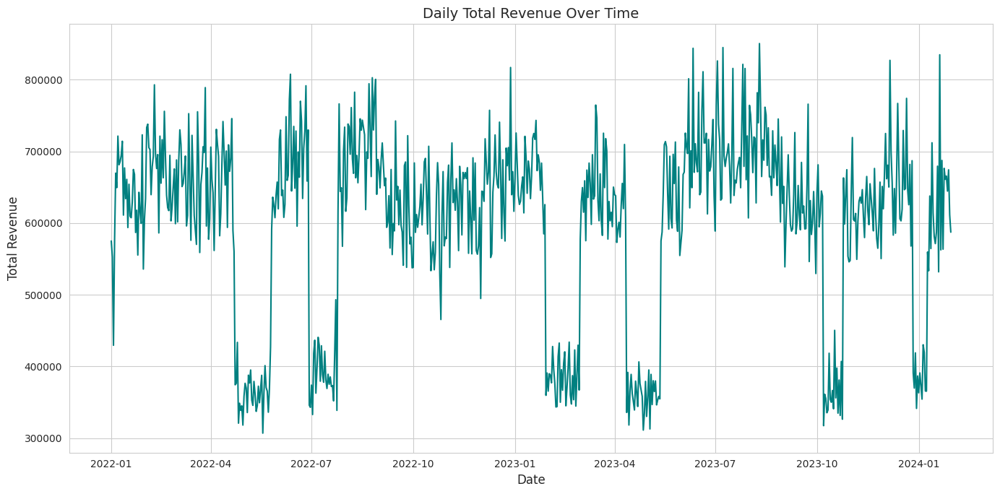

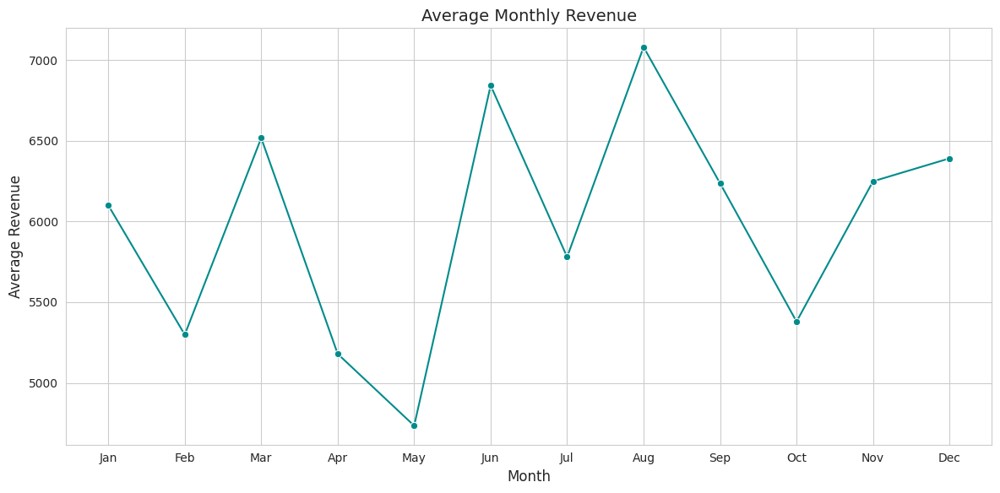


### Key Observations
The daily total revenue plot reveals overall growth trends and significant fluctuations, which often align with seasonal patterns or specific events. Monthly average revenue highlights clear seasonality, indicating that certain months contribute more substantially to revenue than others. This temporal insight is crucial for resource allocation, marketing campaign timing, and sales forecasting.


In [236]:
if df is not None:
    print("--- Revenue Trends Over Time ---")

    daily_revenue = df.groupby('Date')['Revenue'].sum().reset_index()

    plt.figure(figsize=(14, 7))
    sns.lineplot(data=daily_revenue, x='Date', y='Revenue', color='teal')
    plt.title('Daily Total Revenue Over Time')
    plt.xlabel('Date')
    plt.ylabel('Total Revenue')
    plt.tight_layout()
    plt.show()

    # Monthly Average Revenue
    monthly_avg_revenue = df.groupby('Month')['Revenue'].mean().reset_index()
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=monthly_avg_revenue, x='Month', y='Revenue', marker='o', color='darkcyan')
    plt.title('Average Monthly Revenue')
    plt.xlabel('Month')
    plt.ylabel('Average Revenue')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.tight_layout()
    plt.show()

    print("\n### Key Observations")
    print("The daily total revenue plot reveals overall growth trends and significant fluctuations, which often align with seasonal patterns or specific events. Monthly average revenue highlights clear seasonality, indicating that certain months contribute more substantially to revenue than others. This temporal insight is crucial for resource allocation, marketing campaign timing, and sales forecasting.")
else:
    print("DataFrame not available for revenue trends analysis.")

### Revenue Breakdown: By Product and Place

--- Revenue by Category and Region ---


/tmp/ipykernel_1495/1464124956.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=revenue_by_category, x='Category', y='Revenue', palette='crest')


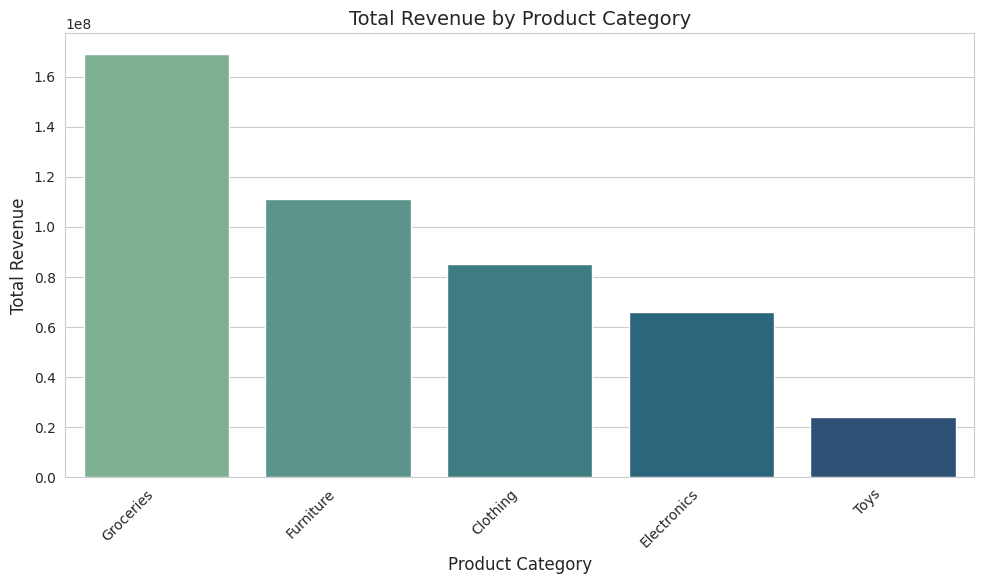

/tmp/ipykernel_1495/1464124956.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=revenue_by_region, x='Region', y='Revenue', palette='magma')


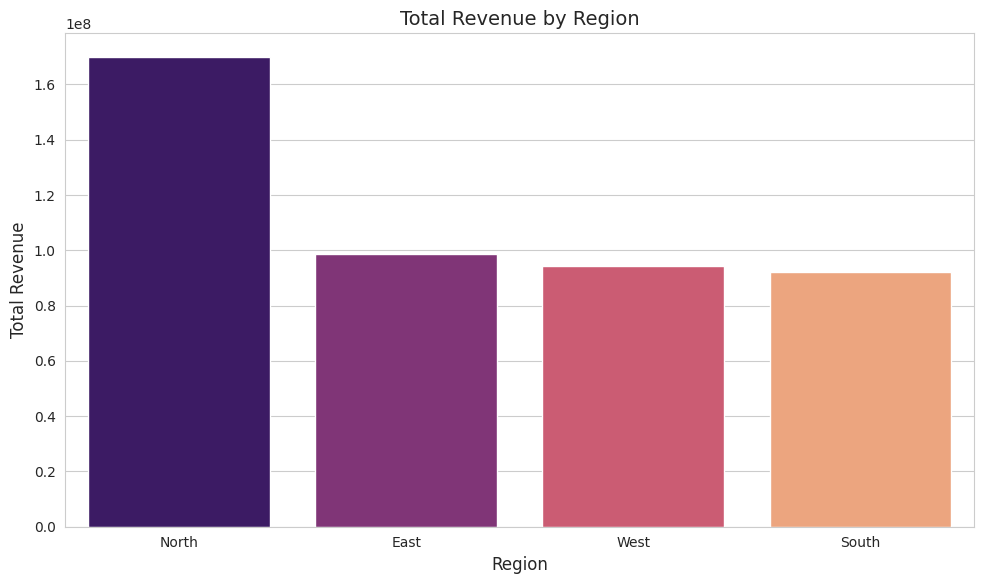


### Key Observations
The analysis of revenue by category reveals which product segments are the largest contributors to overall revenue. 'Groceries' lead significantly, followed by 'Clothing' and 'Electronics'. This mirrors our earlier findings from demand analysis. Similarly, revenue by region identifies geographical areas with the highest sales performance, with 'North' region dominating. These insights are vital for strategic decision-making regarding product focus, market expansion, and localized marketing efforts.


In [237]:
if df is not None:
    print("--- Revenue by Category and Region ---")

    # Revenue by Category
    revenue_by_category = df.groupby('Category')['Revenue'].sum().sort_values(ascending=False).reset_index()
    plt.figure(figsize=(10, 6))
    sns.barplot(data=revenue_by_category, x='Category', y='Revenue', palette='crest')
    plt.title('Total Revenue by Product Category')
    plt.xlabel('Product Category')
    plt.ylabel('Total Revenue')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Revenue by Region
    revenue_by_region = df.groupby('Region')['Revenue'].sum().sort_values(ascending=False).reset_index()
    plt.figure(figsize=(10, 6))
    sns.barplot(data=revenue_by_region, x='Region', y='Revenue', palette='magma')
    plt.title('Total Revenue by Region')
    plt.xlabel('Region')
    plt.ylabel('Total Revenue')
    plt.tight_layout()
    plt.show()

    print("\n### Key Observations")
    print("The analysis of revenue by category reveals which product segments are the largest contributors to overall revenue. 'Groceries' lead significantly, followed by 'Clothing' and 'Electronics'. This mirrors our earlier findings from demand analysis. Similarly, revenue by region identifies geographical areas with the highest sales performance, with 'North' region dominating. These insights are vital for strategic decision-making regarding product focus, market expansion, and localized marketing efforts.")
else:
    print("DataFrame not available for revenue by category/region analysis.")

--- Combined Impact of Discount and Promotion on Demand ---


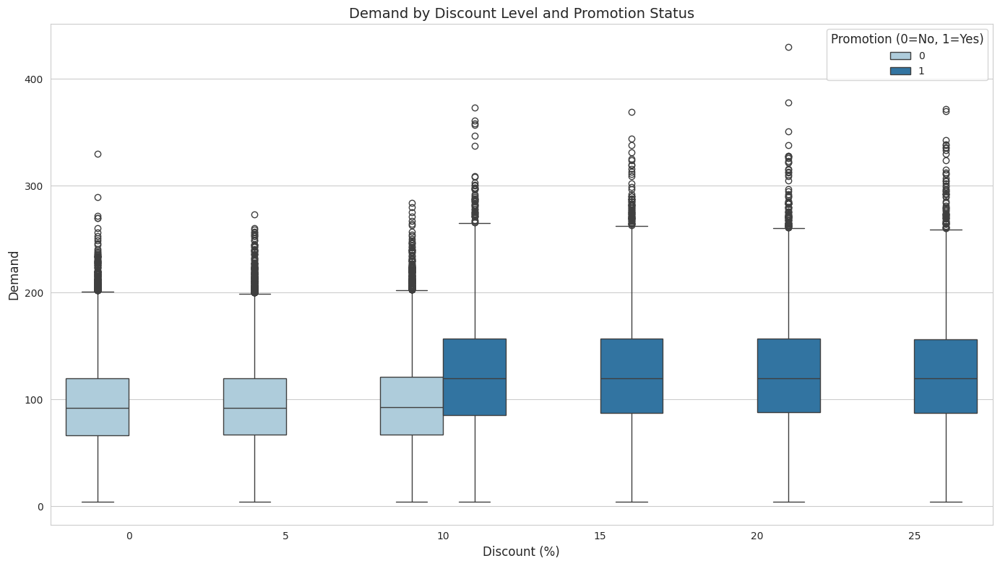


Average Demand by Discount Level and Promotion Status:


Promotion,0,1
Discount,,
0,94.748861,0.000000
5,94.941896,0.000000
10,95.392368,122.486913
15,0.000000,123.575981
20,0.000000,124.065256
25,0.000000,122.967374



### Key Observations
The combined analysis shows that promotions consistently amplify the effect of discounts. For almost every discount level, demand is higher when a promotion is active. This synergy suggests that running promotions in conjunction with discounts is more effective than either strategy in isolation. The highest demand is typically observed when both a substantial discount and a promotion are present. This indicates that these two strategies complement each other in driving sales volumes and should be considered together for optimal campaign planning.


In [238]:
if df is not None:
    print("--- Combined Impact of Discount and Promotion on Demand ---")

    plt.figure(figsize=(14, 8))
    sns.boxplot(data=df, x='Discount', y='Demand', hue='Promotion', palette='Paired')
    plt.title('Demand by Discount Level and Promotion Status')
    plt.xlabel('Discount (%)')
    plt.ylabel('Demand')
    plt.legend(title='Promotion (0=No, 1=Yes)')
    plt.tight_layout()
    plt.show()

    print("\nAverage Demand by Discount Level and Promotion Status:")
    combined_impact = df.groupby(['Discount', 'Promotion'])['Demand'].mean().unstack().fillna(0)
    display(combined_impact)

    print("\n### Key Observations")
    print("The combined analysis shows that promotions consistently amplify the effect of discounts. For almost every discount level, demand is higher when a promotion is active. This synergy suggests that running promotions in conjunction with discounts is more effective than either strategy in isolation. The highest demand is typically observed when both a substantial discount and a promotion are present. This indicates that these two strategies complement each other in driving sales volumes and should be considered together for optimal campaign planning.")
else:
    print("DataFrame not available for combined discount and promotion analysis.")

--- Dynamic Pricing Analysis ---

1. Overall Price-Demand Relationship (Approximation of Elasticity)
Overall Average Price Elasticity of Demand: -0.16
(An elasticity < -1 suggests elastic demand, > -1 but < 0 inelastic, > 0 rare/luxury goods effect)


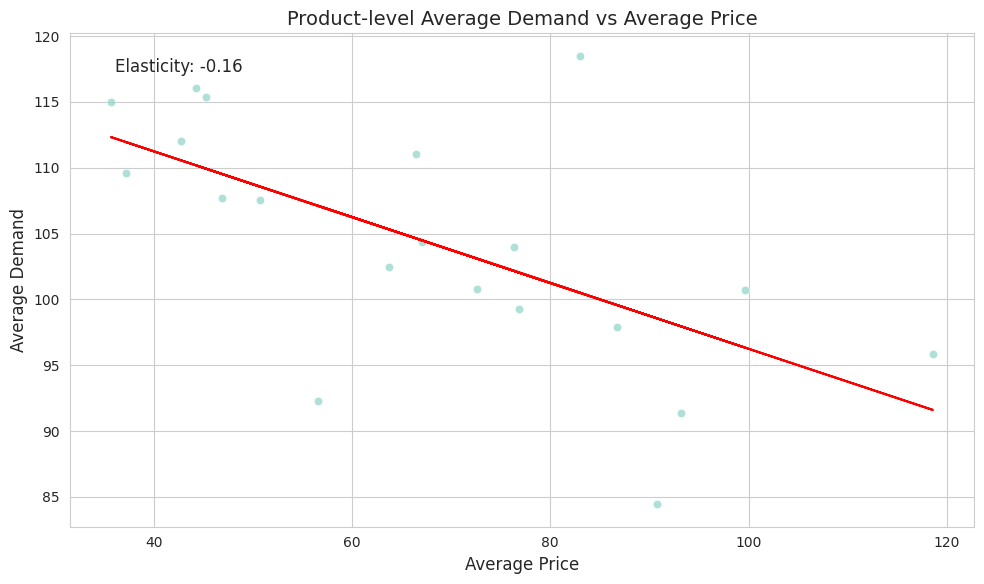


2. Impact of Price vs. Competitor Pricing on Demand


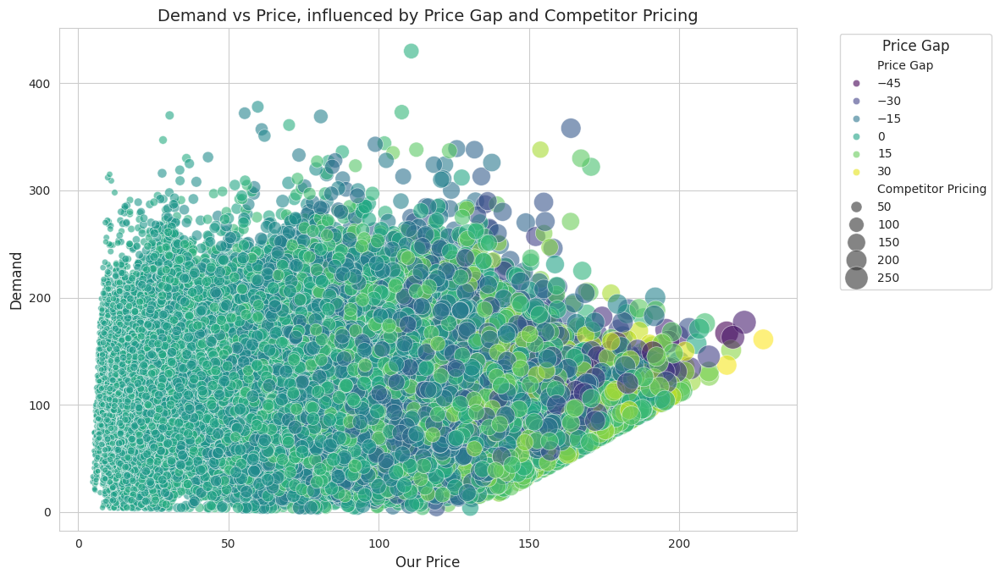


3. Price Distribution by Demand Levels


/tmp/ipykernel_1495/2390642547.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Demand_Bin', y='Price', palette='pastel')


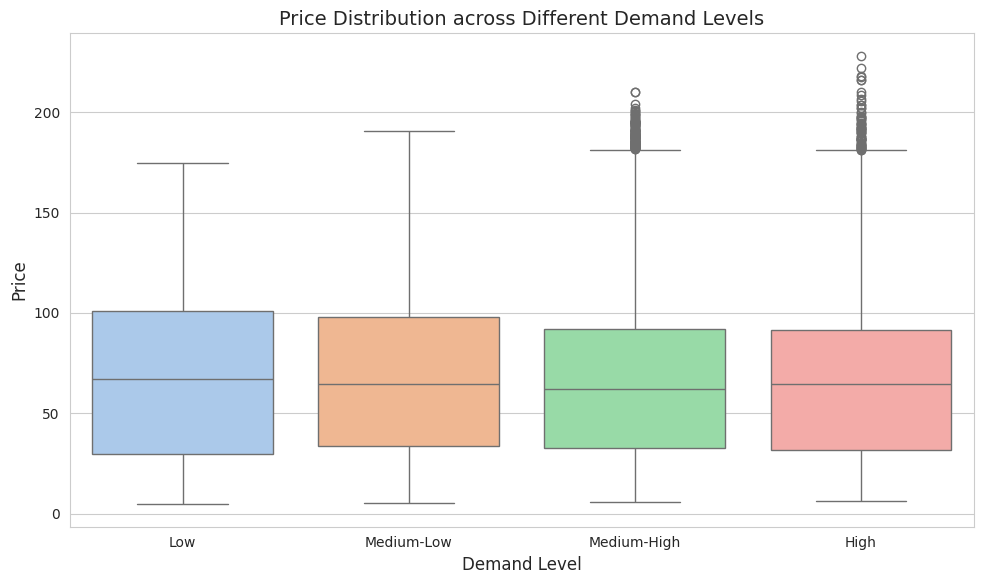


### Key Observations - Dynamic Pricing Analysis
**Overall Price Elasticity**: The calculated overall price elasticity provides an initial indication of how sensitive demand is to price changes. If it's elastic (e.g., < -1), price reductions could significantly boost demand and potentially revenue. If inelastic (e.g., between -1 and 0), demand is less responsive. Note this is a simplified view; elasticity often varies by product, segment, and price point. 

**Price vs. Competitor Pricing Impact**: The scatter plot highlights scenarios where higher demand occurs. For example, even with a positive 'Price Gap' (we are more expensive), if 'Competitor Pricing' is very high (larger points), our demand might still be strong. Conversely, being cheaper (negative 'Price Gap') generally correlates with higher demand. This suggests that competitive positioning is a complex interplay, not just a simple comparison. 

**Price Distribution by Demand Levels**: The boxplot shows how prices are distribut

In [239]:
if df is not None:
    print("--- Dynamic Pricing Analysis ---")

    # 1. Price Elasticity of Demand (Overall)
    # This is an approximation using linear regression coefficient, not true elasticity which is point-based.
    print("\n1. Overall Price-Demand Relationship (Approximation of Elasticity)")
    # Aggregate to product level to avoid daily fluctuations for simpler elasticity view
    product_agg = df.groupby('Product ID').agg({'Price': 'mean', 'Demand': 'mean'}).reset_index()

    if not product_agg.empty:
        # Filter out products with constant price or demand to avoid division by zero or infinite elasticity
        product_agg_filtered = product_agg[product_agg['Price'] > 0]
        product_agg_filtered = product_agg_filtered[product_agg_filtered['Demand'] > 0]

        if len(product_agg_filtered) > 1:
            from scipy.stats import linregress
            slope, intercept, r_value, p_value, std_err = linregress(product_agg_filtered['Price'], product_agg_filtered['Demand'])

            # Average price and demand for elasticity calculation
            avg_price = product_agg_filtered['Price'].mean()
            avg_demand = product_agg_filtered['Demand'].mean()

            # Elasticity = (% Change in Demand) / (% Change in Price) = (dD/dP) * (P/D)
            # dD/dP is the slope of the regression line
            overall_elasticity = (slope * avg_price) / avg_demand if avg_demand != 0 else np.nan

            print(f"Overall Average Price Elasticity of Demand: {overall_elasticity:.2f}")
            print(f"(An elasticity < -1 suggests elastic demand, > -1 but < 0 inelastic, > 0 rare/luxury goods effect)")

            plt.figure(figsize=(10, 6))
            sns.scatterplot(data=product_agg_filtered, x='Price', y='Demand', alpha=0.7)
            plt.plot(product_agg_filtered['Price'], intercept + slope * product_agg_filtered['Price'], color='red')
            plt.title('Product-level Average Demand vs Average Price')
            plt.xlabel('Average Price')
            plt.ylabel('Average Demand')
            plt.text(0.05, 0.95, f'Elasticity: {overall_elasticity:.2f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')
            plt.tight_layout()
            plt.show()
        else:
            print("Not enough data points for price elasticity calculation after filtering.")
    else:
        print("No aggregated product data to calculate elasticity.")


    # 2. Impact of Price vs. Competitor Pricing on Demand
    print("\n2. Impact of Price vs. Competitor Pricing on Demand")
    plt.figure(figsize=(12, 7))
    sns.scatterplot(data=df, x='Price', y='Demand', hue='Price Gap', size='Competitor Pricing', sizes=(20, 400), alpha=0.6, palette='viridis')
    plt.title('Demand vs Price, influenced by Price Gap and Competitor Pricing')
    plt.xlabel('Our Price')
    plt.ylabel('Demand')
    plt.legend(title='Price Gap', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # 3. Price distribution by Demand Quartiles (or Bins)
    print("\n3. Price Distribution by Demand Levels")
    df['Demand_Bin'] = pd.qcut(df['Demand'], q=4, labels=['Low', 'Medium-Low', 'Medium-High', 'High'])
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x='Demand_Bin', y='Price', palette='pastel')
    plt.title('Price Distribution across Different Demand Levels')
    plt.xlabel('Demand Level')
    plt.ylabel('Price')
    plt.tight_layout()
    plt.show()

    # Drop temporary Demand_Bin column
    df.drop(columns=['Demand_Bin'], inplace=True)


    print("\n### Key Observations - Dynamic Pricing Analysis")
    print("**Overall Price Elasticity**: The calculated overall price elasticity provides an initial indication of how sensitive demand is to price changes. If it's elastic (e.g., < -1), price reductions could significantly boost demand and potentially revenue. If inelastic (e.g., between -1 and 0), demand is less responsive. Note this is a simplified view; elasticity often varies by product, segment, and price point. \n")
    print("**Price vs. Competitor Pricing Impact**: The scatter plot highlights scenarios where higher demand occurs. For example, even with a positive 'Price Gap' (we are more expensive), if 'Competitor Pricing' is very high (larger points), our demand might still be strong. Conversely, being cheaper (negative 'Price Gap') generally correlates with higher demand. This suggests that competitive positioning is a complex interplay, not just a simple comparison. \n")
    print("**Price Distribution by Demand Levels**: The boxplot shows how prices are distributed across different demand levels. Products with 'High' demand might either be consistently lower-priced (volume strategy) or premium products with strong brand loyalty that command higher prices, even with high demand. This helps identify different pricing strategies and their success in generating demand.")

else:
    print("DataFrame not available for dynamic pricing analysis.")

## 1. All Dependencies

In [240]:
pip install pandas numpy matplotlib seaborn openpyxl

## 2. Loading data

In [241]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Load sales_data.csv
try:
    df = pd.read_csv('/content/sales_data.csv')
    print("sales_data.csv loaded successfully.")
except FileNotFoundError:
    print("sales_data.csv not found. Please ensure the file is uploaded correctly.")
    df = None

if df is not None:
    print("\nFirst 5 rows of the DataFrame:")
    display(df.head())
    print("\nInformation about the DataFrame:")
    df.info()
    print("\nDescriptive statistics of the DataFrame:")
    display(df.describe(include='all'))

sales_data.csv loaded successfully.

First 5 rows of the DataFrame:


,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand
0,2022-01-01,S001,P0001,Electronics,North,195,102,252,72.72,5,Snowy,0,85.73,Winter,0,115
1,2022-01-01,S001,P0002,Clothing,North,117,117,249,80.16,15,Snowy,1,92.02,Winter,0,229
2,2022-01-01,S001,P0003,Clothing,North,247,114,612,62.94,10,Snowy,1,60.08,Winter,0,157
3,2022-01-01,S001,P0004,Electronics,North,139,45,102,87.63,10,Snowy,0,85.19,Winter,0,52
4,2022-01-01,S001,P0005,Groceries,North,152,65,271,54.41,0,Snowy,0,51.63,Winter,0,59



Information about the DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                76000 non-null  object 
 1   Store ID            76000 non-null  object 
 2   Product ID          76000 non-null  object 
 3   Category            76000 non-null  object 
 4   Region              76000 non-null  object 
 5   Inventory Level     76000 non-null  int64  
 6   Units Sold          76000 non-null  int64  
 7   Units Ordered       76000 non-null  int64  
 8   Price               76000 non-null  float64
 9   Discount            76000 non-null  int64  
 10  Weather Condition   76000 non-null  object 
 11  Promotion           76000 non-null  int64  
 12  Competitor Pricing  76000 non-null  float64
 13  Seasonality         76000 non-null  object 
 14  Epidemic            76000 non-null  int64  
 15  Demand             

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand
count,76000,76000,76000,76000,76000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000,76000.000000,76000.000000,76000,76000.000000,76000.000000
unique,760,5,20,5,4,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,4,NaN,NaN
top,2024-01-30,S001,P0001,Groceries,North,NaN,NaN,NaN,NaN,NaN,Cloudy,NaN,NaN,Winter,NaN,NaN
freq,100,15200,3800,30400,30400,NaN,NaN,NaN,NaN,NaN,24360,NaN,NaN,21000,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,301.062842,88.827316,89.090645,67.726028,9.087039,NaN,0.328947,69.454029,NaN,0.200000,104.317158
std,NaN,NaN,NaN,NaN,NaN,226.510161,43.994525,162.404627,39.377899,7.475781,NaN,0.469834,40.943818,NaN,0.400003,46.964801
min,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,4.740000,0.000000,NaN,0.000000,4.290000,NaN,0.000000,4.000000
25%,NaN,NaN,NaN,NaN,NaN,136.000000,58.000000,0.000000,31.997500,5.000000,NaN,0.000000,32.620000,NaN,0.000000,71.000000
50%,NaN,NaN,NaN,NaN,NaN,227.000000,84.000000,0.000000,64.500000,10.000000,NaN,0.000000,65.700000,NaN,0.000000,100.000000
75%,NaN,NaN,NaN,NaN,NaN,408.000000,114.000000,121.000000,95.830000,10.000000,NaN,1.000000,97.932500,NaN,0.000000,133.000000


## 3. Data Cleaning and Preprocessing

In [242]:
# Convert 'Date' column to datetime objects
if df is not None and 'Date' in df.columns:
    df['Date'] = pd.to_datetime(df['Date'])
    print("\n'Date' column converted to datetime.")
    display(df.head())
    df.info()
else:
    print("DataFrame not available or 'Date' column not found for conversion.")


'Date' column converted to datetime.


,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand
0,2022-01-01,S001,P0001,Electronics,North,195,102,252,72.72,5,Snowy,0,85.73,Winter,0,115
1,2022-01-01,S001,P0002,Clothing,North,117,117,249,80.16,15,Snowy,1,92.02,Winter,0,229
2,2022-01-01,S001,P0003,Clothing,North,247,114,612,62.94,10,Snowy,1,60.08,Winter,0,157
3,2022-01-01,S001,P0004,Electronics,North,139,45,102,87.63,10,Snowy,0,85.19,Winter,0,52
4,2022-01-01,S001,P0005,Groceries,North,152,65,271,54.41,0,Snowy,0,51.63,Winter,0,59


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                76000 non-null  datetime64[ns]
 1   Store ID            76000 non-null  object        
 2   Product ID          76000 non-null  object        
 3   Category            76000 non-null  object        
 4   Region              76000 non-null  object        
 5   Inventory Level     76000 non-null  int64         
 6   Units Sold          76000 non-null  int64         
 7   Units Ordered       76000 non-null  int64         
 8   Price               76000 non-null  float64       
 9   Discount            76000 non-null  int64         
 10  Weather Condition   76000 non-null  object        
 11  Promotion           76000 non-null  int64         
 12  Competitor Pricing  76000 non-null  float64       
 13  Seasonality         76000 non-null  object    

## 4. Univariate Analysis

### Categorical Features


Univariate Analysis for Categorical Features:

Value counts for Store ID:


,count
Store ID,
S001,15200
S002,15200
S003,15200
S004,15200
S005,15200


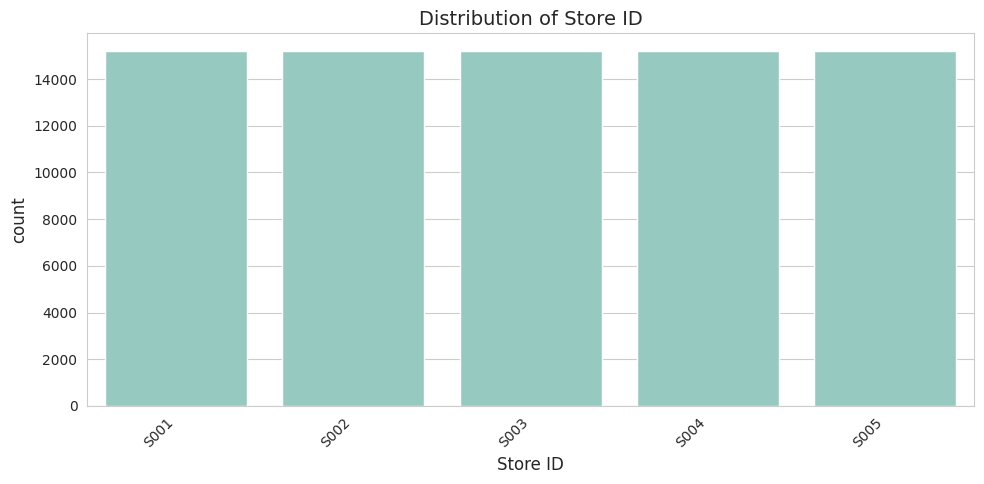


Value counts for Product ID:


,count
Product ID,
P0001,3800
P0002,3800
P0003,3800
P0004,3800
P0005,3800
P0006,3800
P0007,3800
P0008,3800
P0009,3800


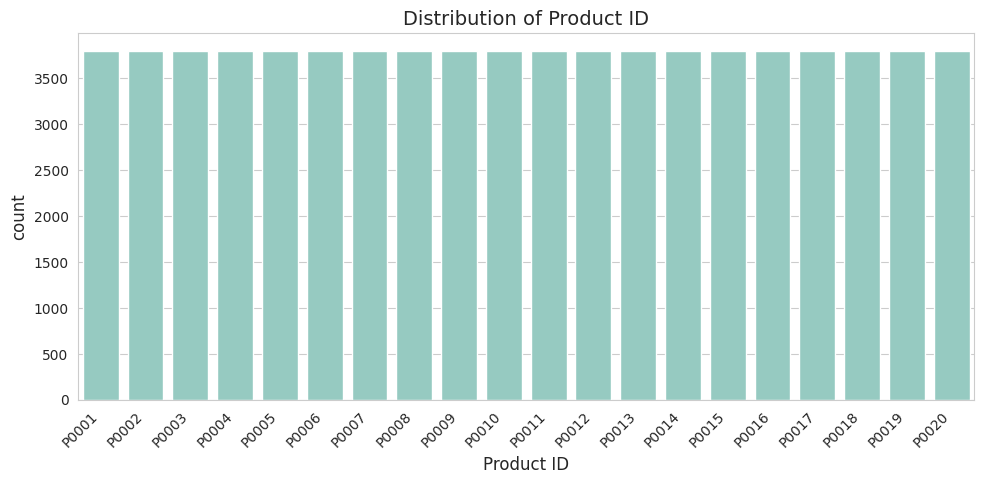


Value counts for Category:


,count
Category,
Groceries,30400
Furniture,13680
Clothing,12160
Toys,10640
Electronics,9120


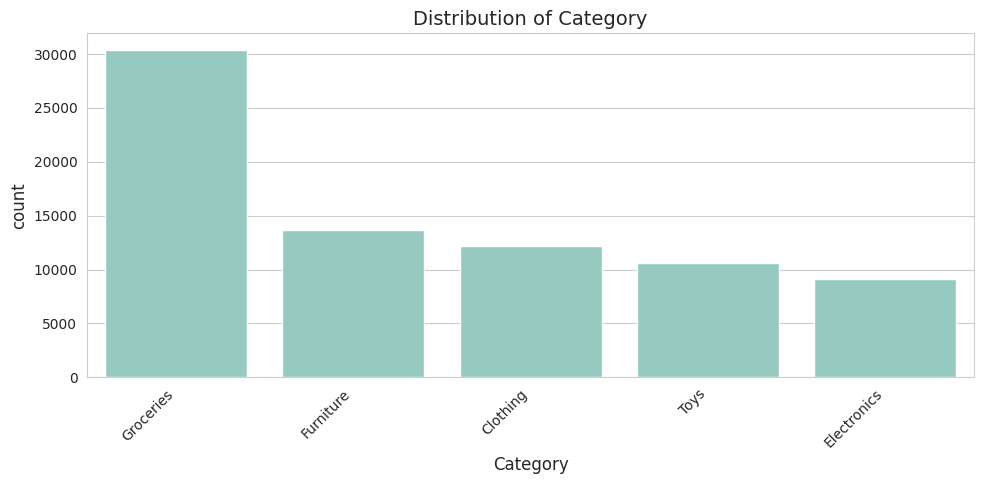


Value counts for Region:


,count
Region,
North,30400
South,15200
East,15200
West,15200


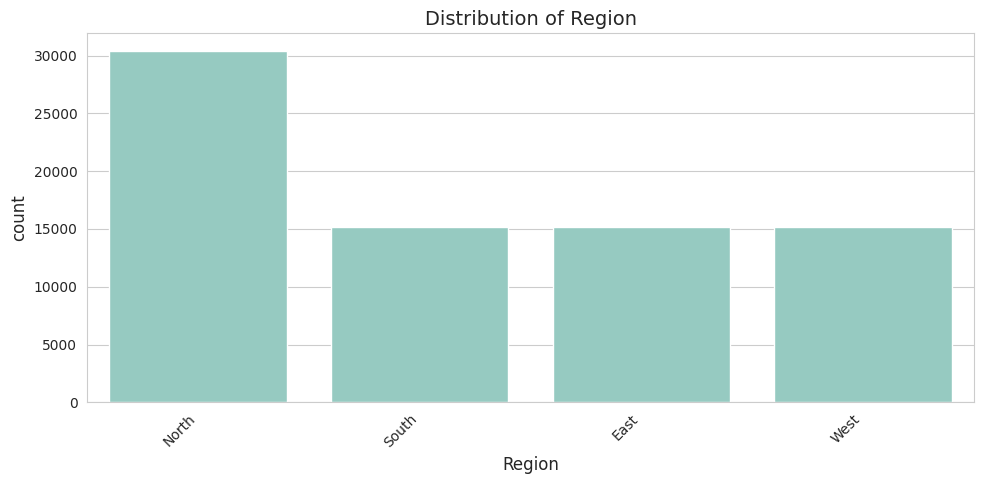


Value counts for Weather Condition:


,count
Weather Condition,
Cloudy,24360
Sunny,22980
Rainy,17500
Snowy,11160


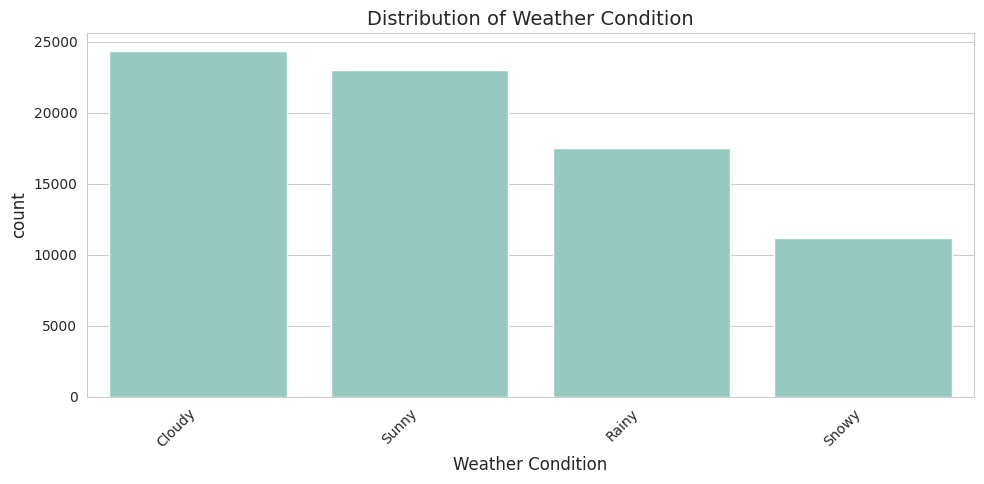


Value counts for Seasonality:


,count
Seasonality,
Winter,21000
Spring,18400
Summer,18400
Autumn,18200


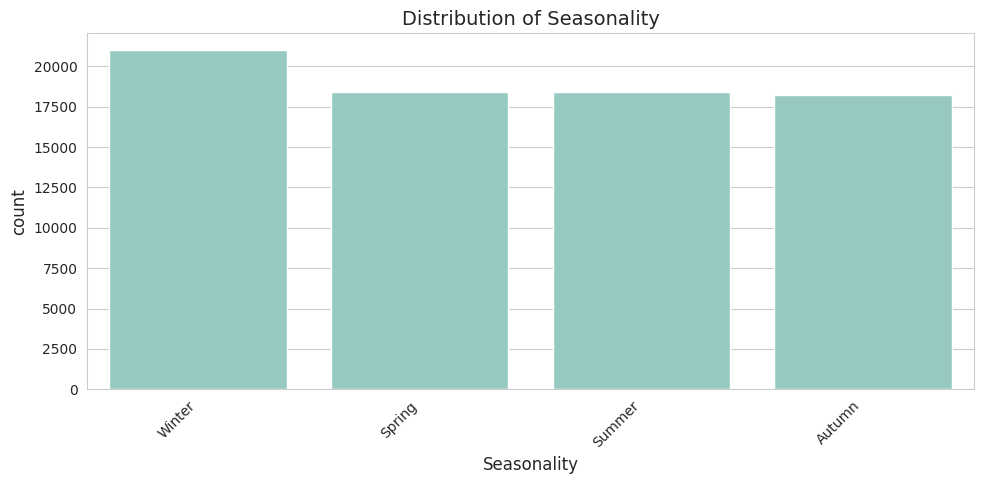


Value counts for Promotion:


,count
Promotion,
0,51000
1,25000


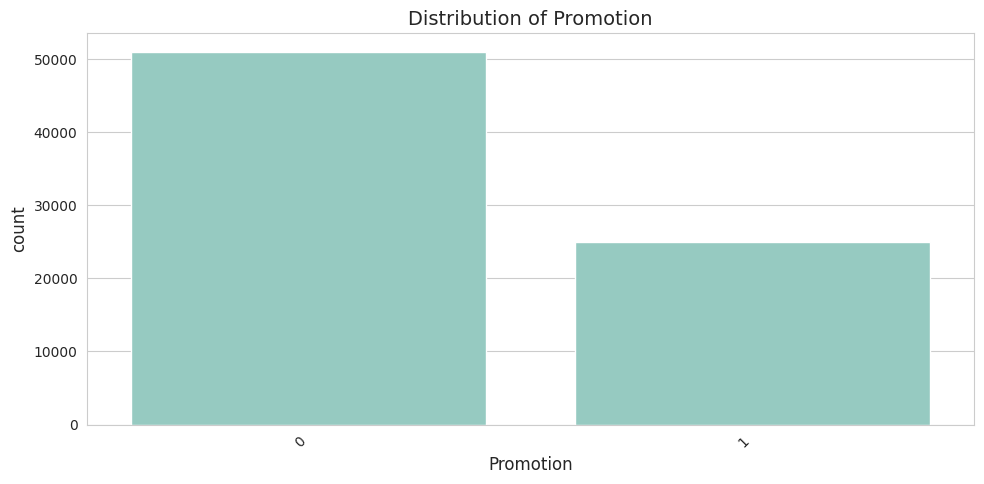


Value counts for Epidemic:


,count
Epidemic,
0,60800
1,15200


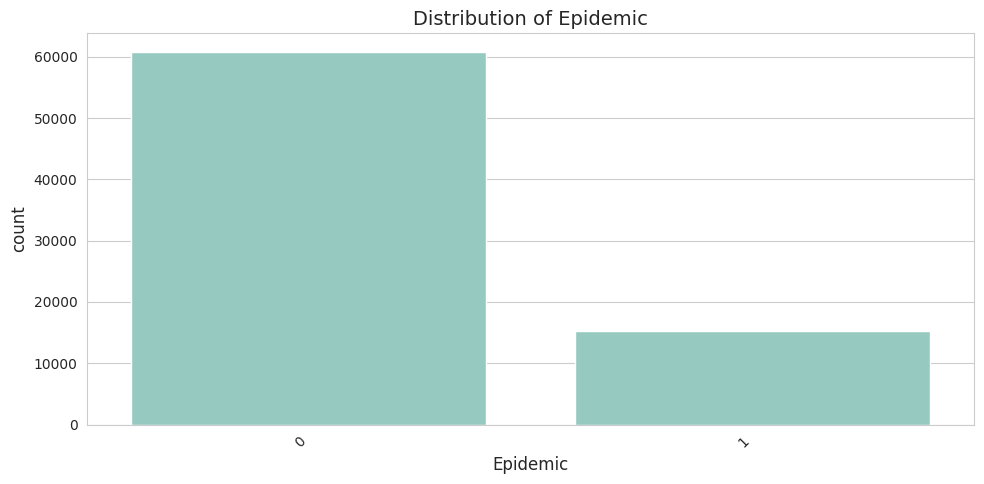

In [243]:
if df is not None:
    categorical_cols = ['Store ID', 'Product ID', 'Category', 'Region', 'Weather Condition', 'Seasonality', 'Promotion', 'Epidemic']
    print("\nUnivariate Analysis for Categorical Features:")
    for col in categorical_cols:
        if col in df.columns:
            print(f"\nValue counts for {col}:")
            display(df[col].value_counts())

            plt.figure(figsize=(10, 5))
            sns.countplot(data=df, x=col, order=df[col].value_counts().index)
            plt.title(f'Distribution of {col}')
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()
        else:
            print(f"Column '{col}' not found in DataFrame.")
else:
    print("DataFrame not available for categorical analysis.")

### Numerical Features


Univariate Analysis for Numerical Features:

Distribution for Inventory Level:


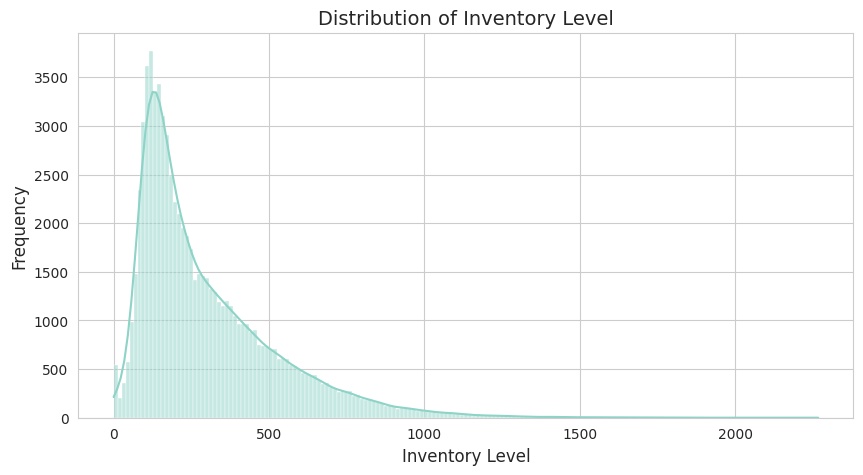

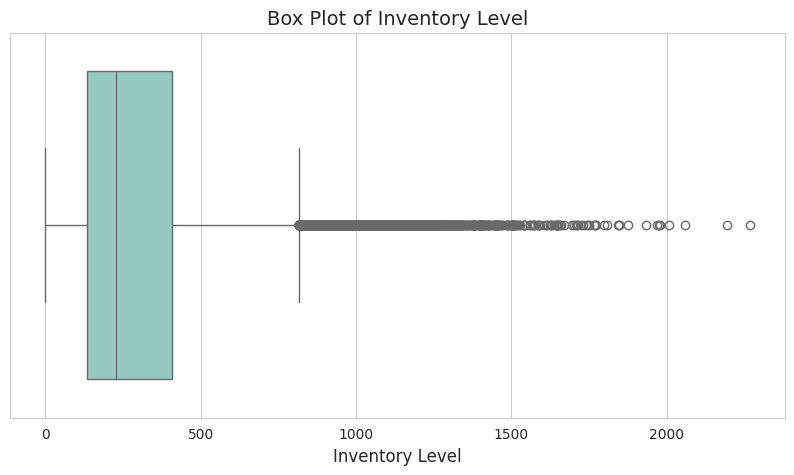


Distribution for Units Sold:


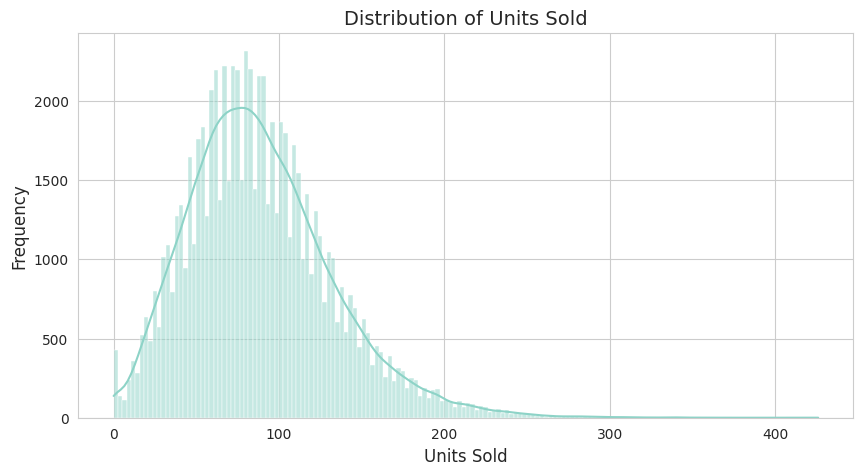

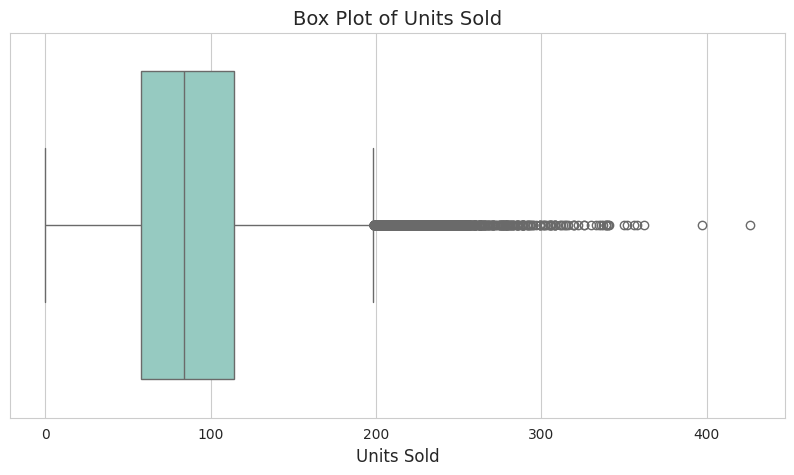


Distribution for Units Ordered:


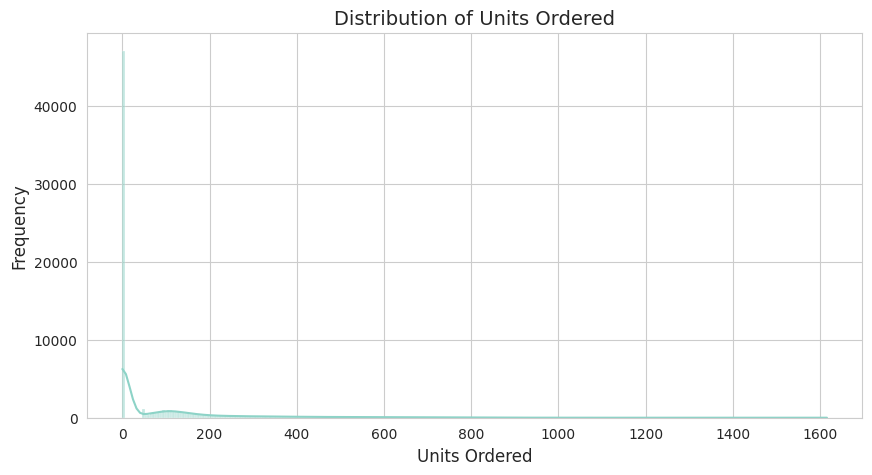

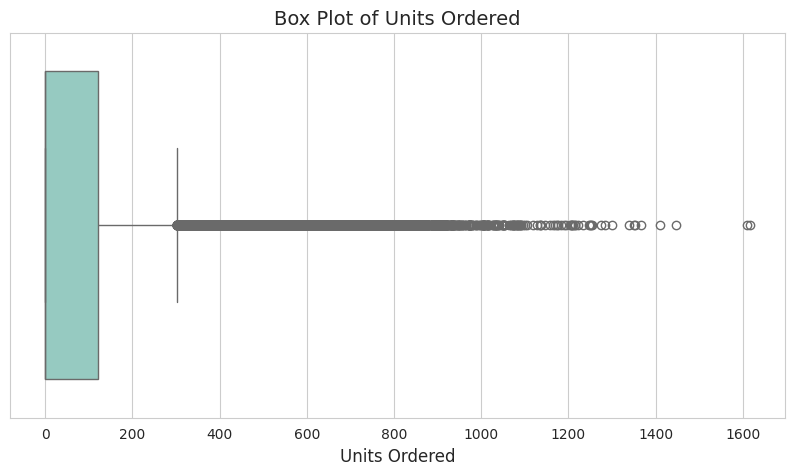


Distribution for Price:


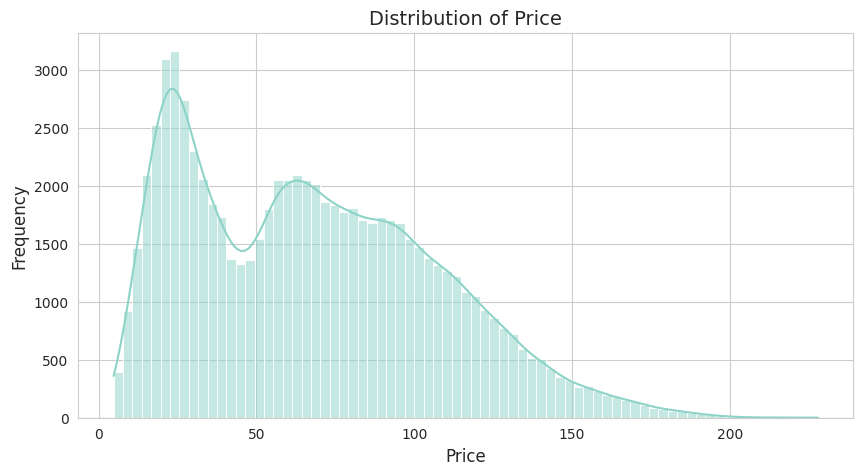

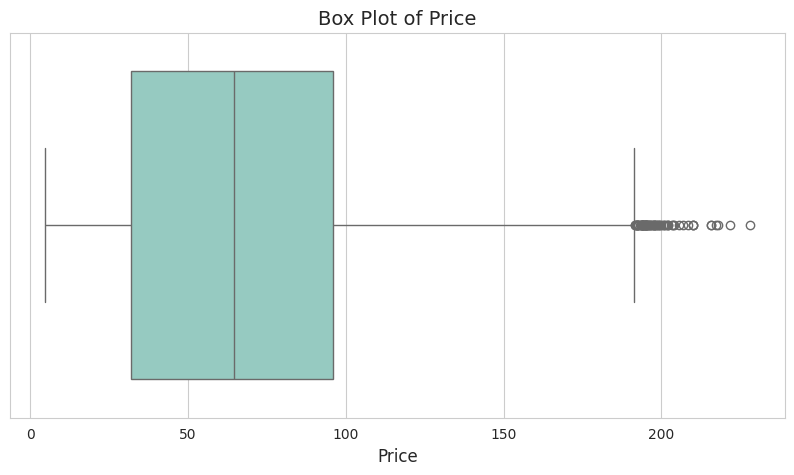


Distribution for Discount:


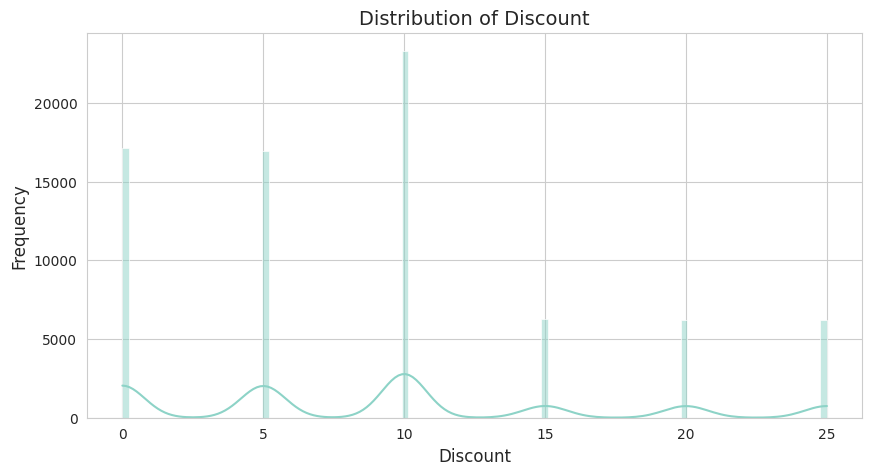

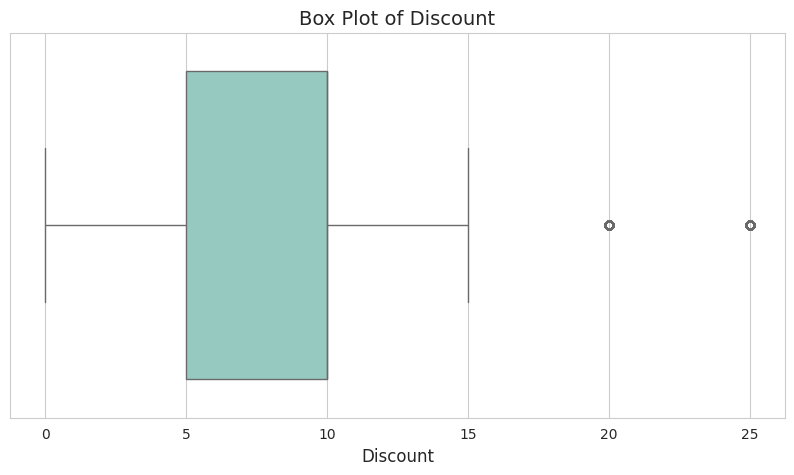


Distribution for Competitor Pricing:


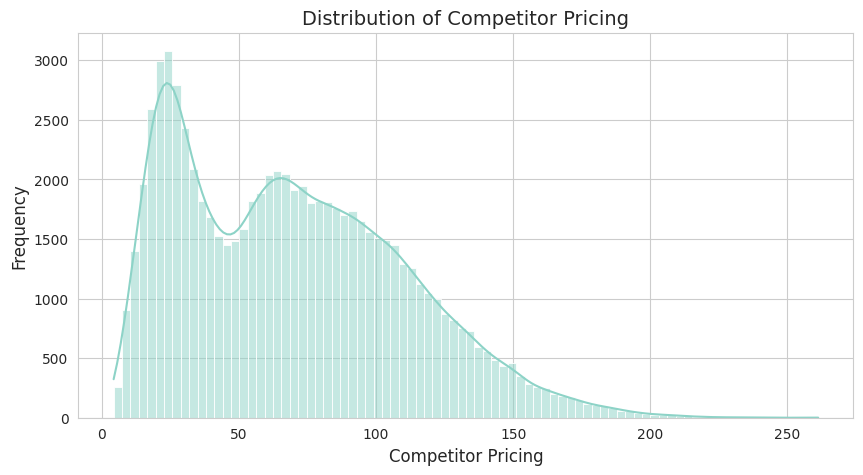

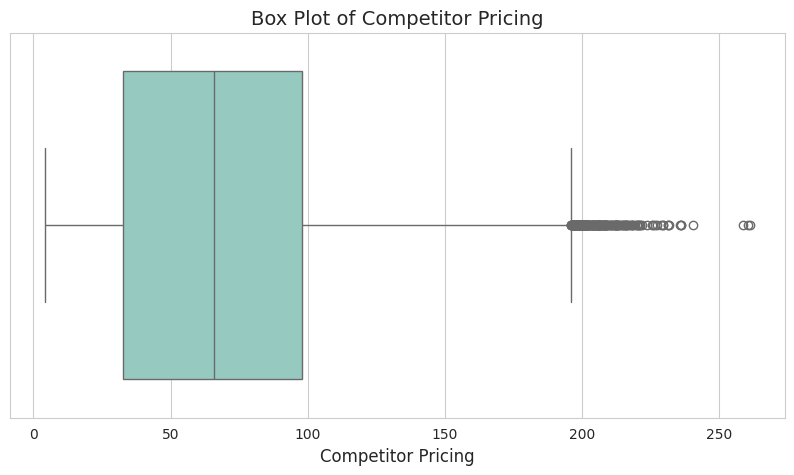


Distribution for Demand:


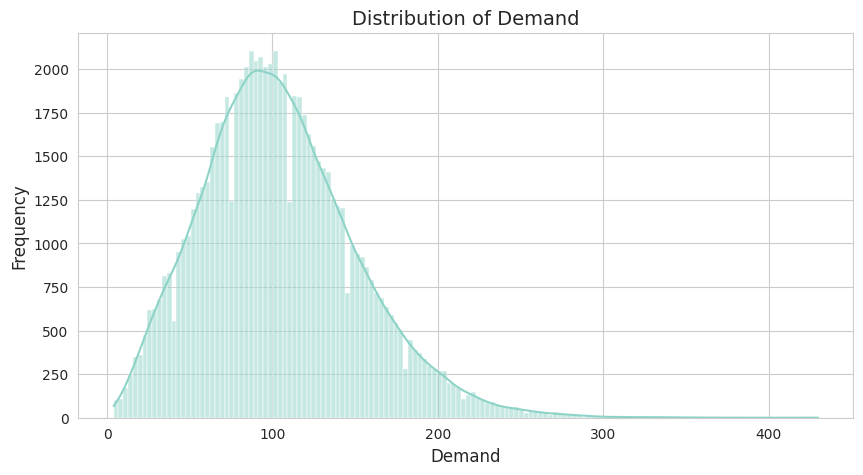

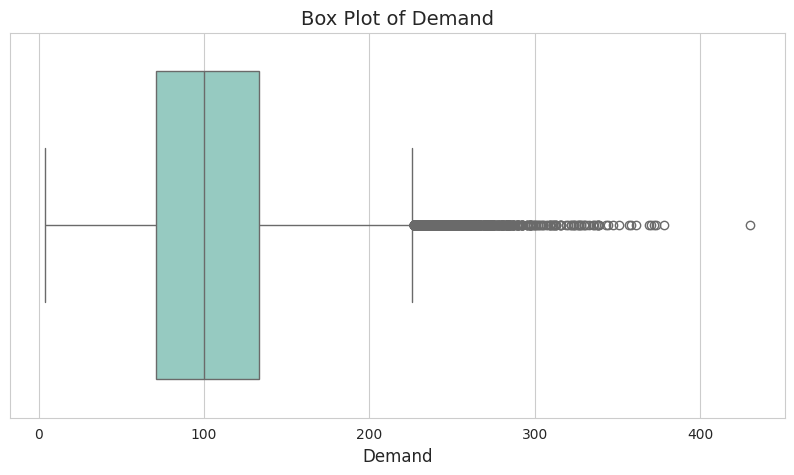

In [244]:
if df is not None:
    numerical_cols = ['Inventory Level', 'Units Sold', 'Units Ordered', 'Price', 'Discount', 'Competitor Pricing', 'Demand']

    print("\nUnivariate Analysis for Numerical Features:")
    for col in numerical_cols:
        if col in df.columns:
            print(f"\nDistribution for {col}:")
            plt.figure(figsize=(10, 5))
            sns.histplot(df[col], kde=True)
            plt.title(f'Distribution of {col}')
            plt.xlabel(col)
            plt.ylabel('Frequency')
            plt.show()

            plt.figure(figsize=(10, 5))
            sns.boxplot(x=df[col])
            plt.title(f'Box Plot of {col}')
            plt.xlabel(col)
            plt.show()
        else:
            print(f"Column '{col}' not found in DataFrame.")
else:
    print("DataFrame not available for numerical analysis.")

## 5. Bivariate Analysis

### Numerical vs. Numerical Features (Correlation Matrix)


Correlation Matrix for Numerical Features:


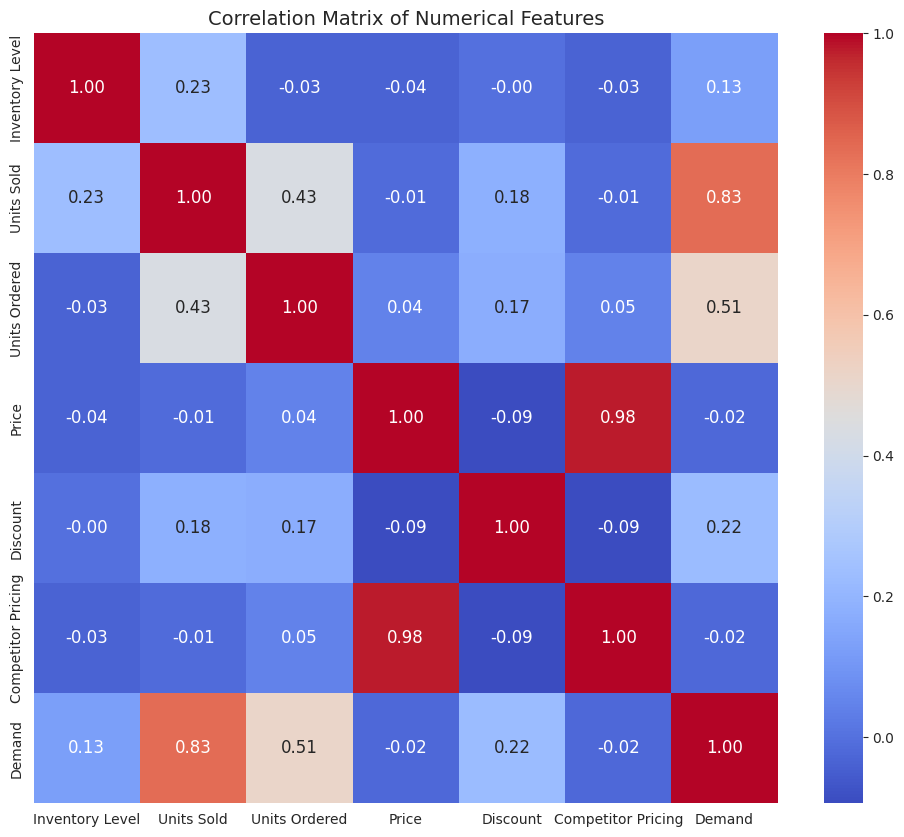

In [245]:
if df is not None:
    numerical_cols = ['Inventory Level', 'Units Sold', 'Units Ordered', 'Price', 'Discount', 'Competitor Pricing', 'Demand']

    print("\nCorrelation Matrix for Numerical Features:")
    plt.figure(figsize=(12, 10))
    sns.heatmap(df[numerical_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Correlation Matrix of Numerical Features')
    plt.show()
else:
    print("DataFrame not available for correlation analysis.")

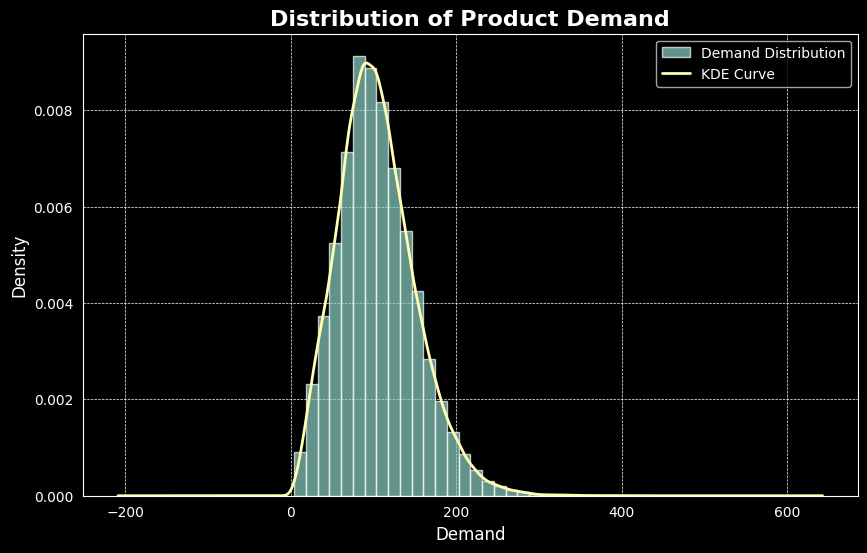

In [246]:


plt.style.use("dark_background")

# Demand Distribution
plt.figure(figsize=(10, 6))

plt.hist(
    df["Demand"],
    bins=30,
    alpha=0.7,
    density=True,
    label="Demand Distribution"
)

df["Demand"].plot.kde(
    linewidth=2,
    label="KDE Curve"
)

plt.title("Distribution of Product Demand", fontsize=16, fontweight="bold")
plt.xlabel("Demand", fontsize=12)
plt.ylabel("Density", fontsize=12)

plt.grid(linestyle="--", linewidth=0.5)
plt.legend()

plt.show()

### Categorical vs. Numerical Features


Category vs Units Sold:


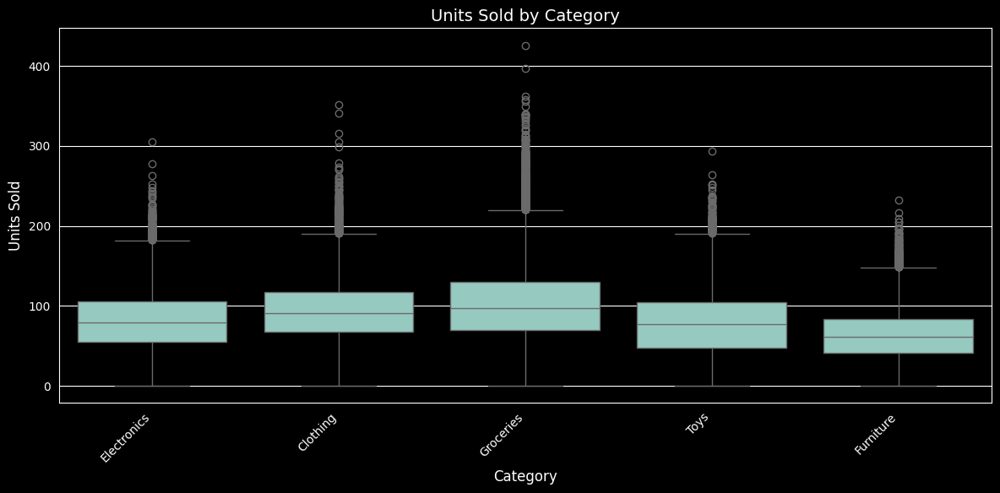

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


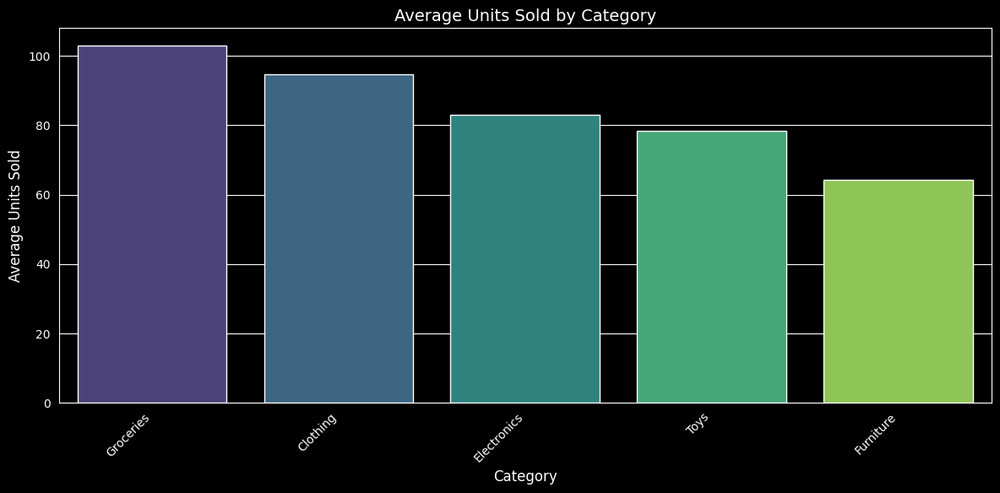


Category vs Demand:


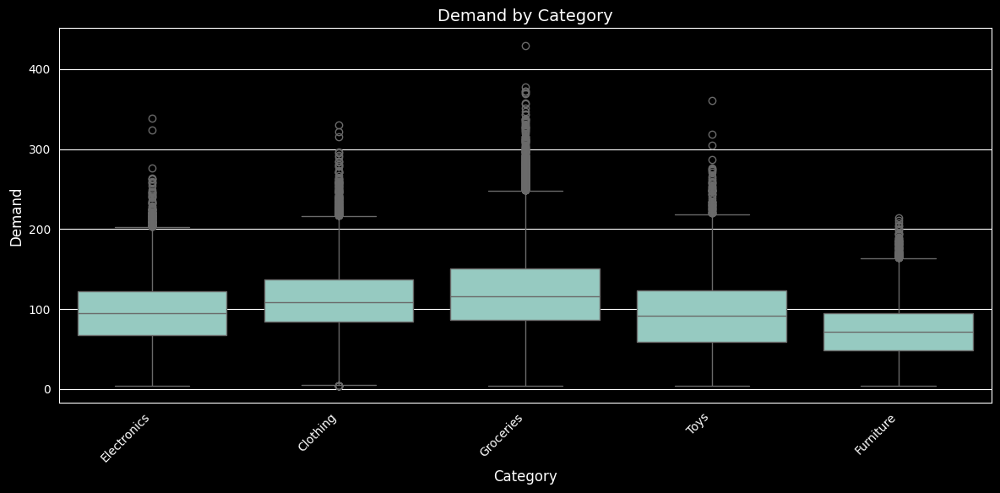

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


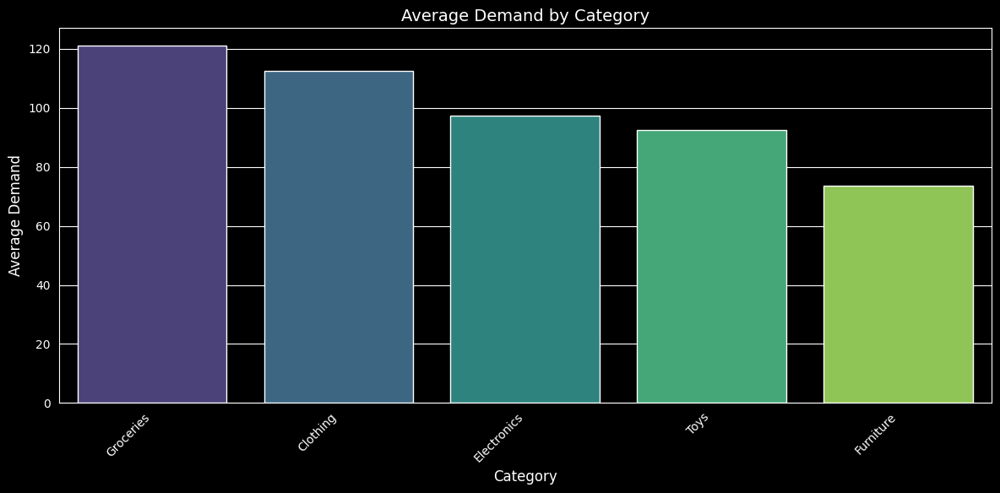


Region vs Units Sold:


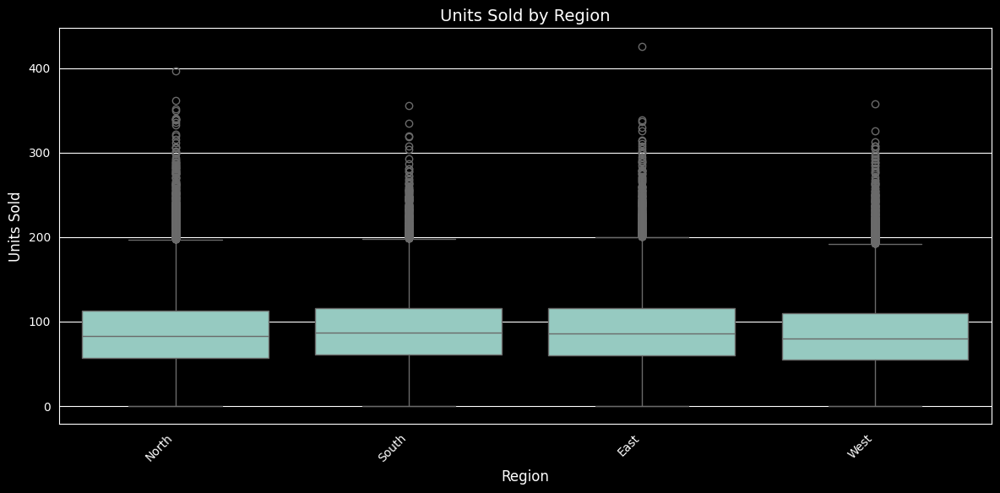

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


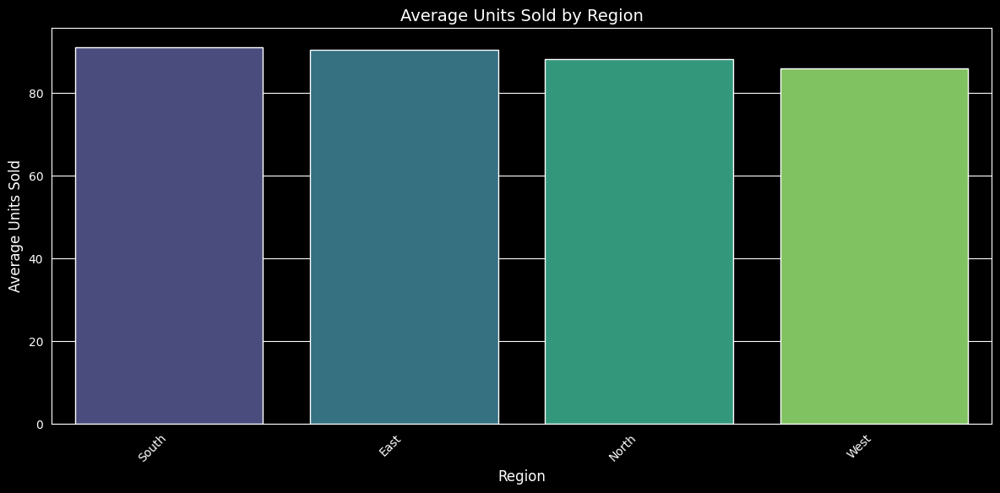


Region vs Demand:


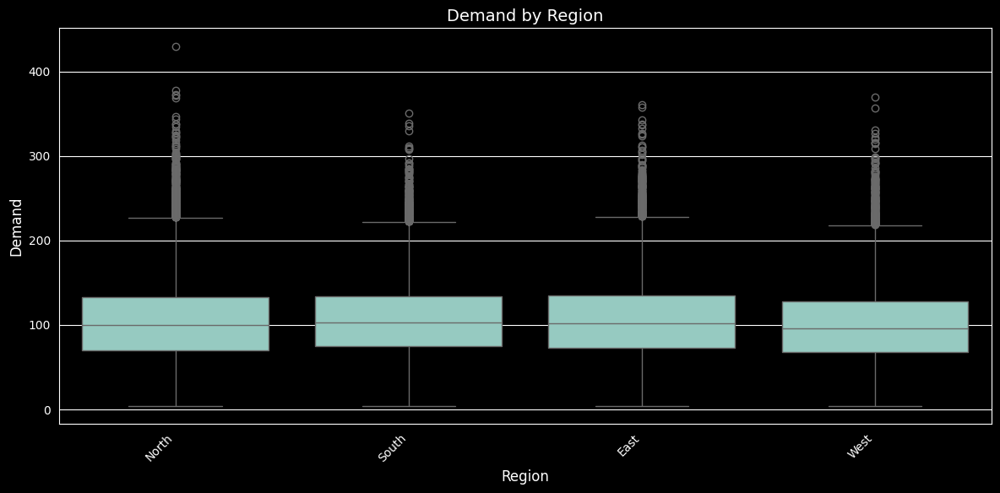

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


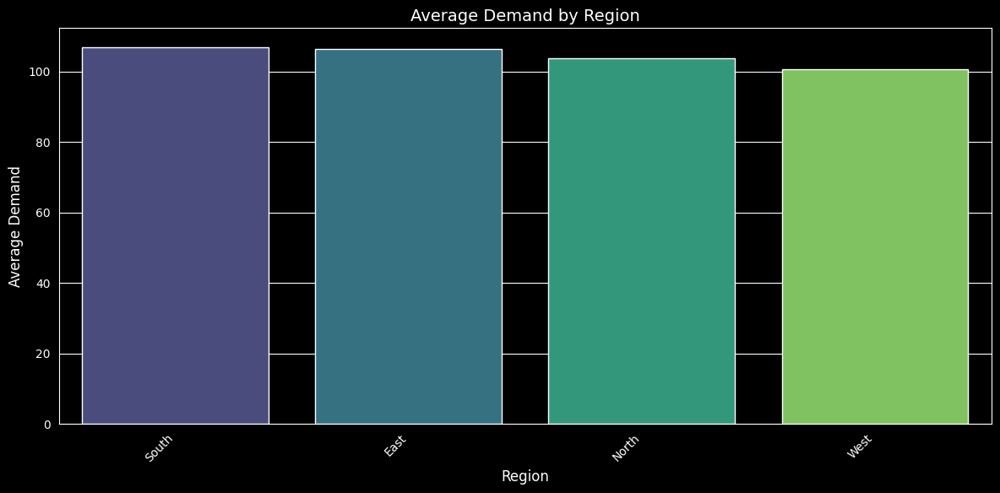


Weather Condition vs Units Sold:


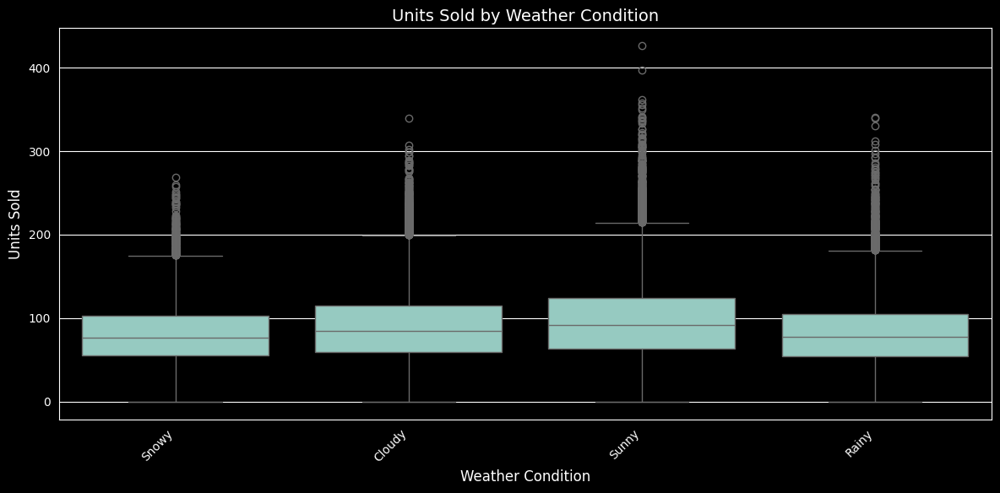

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


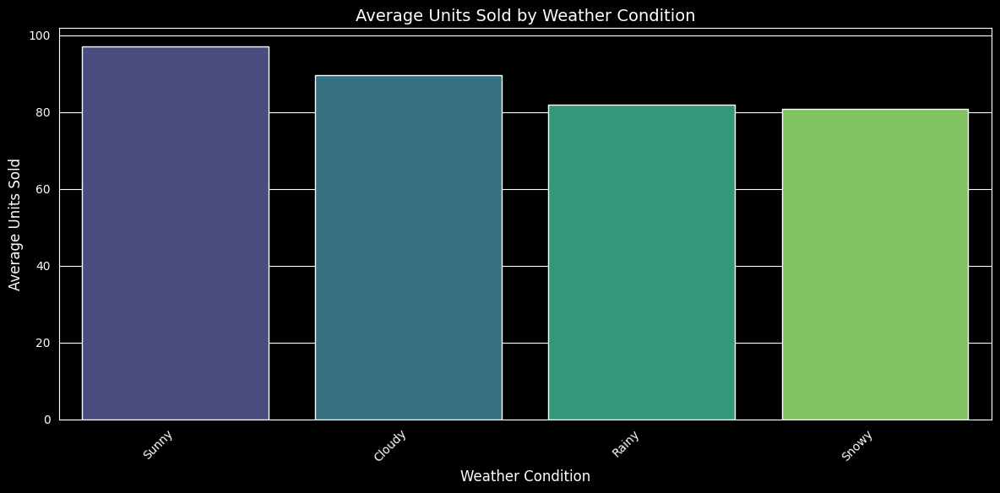


Weather Condition vs Demand:


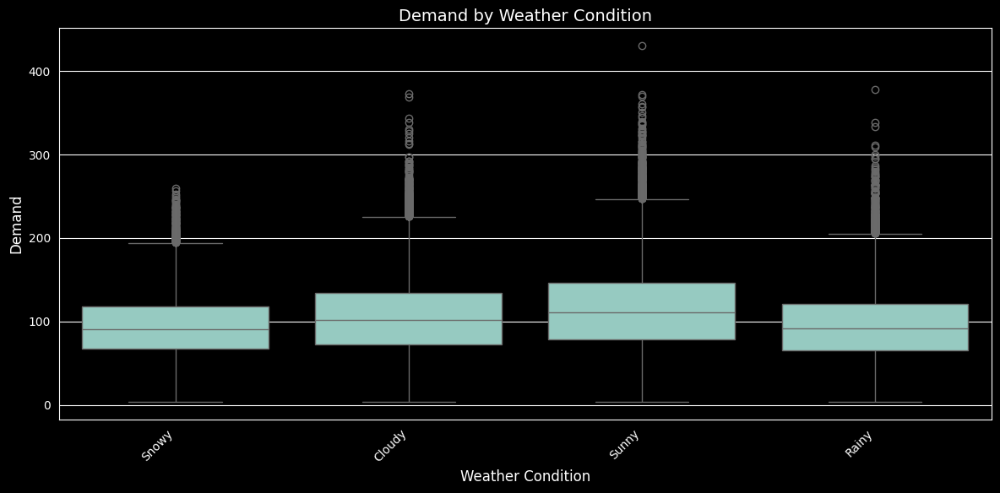

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


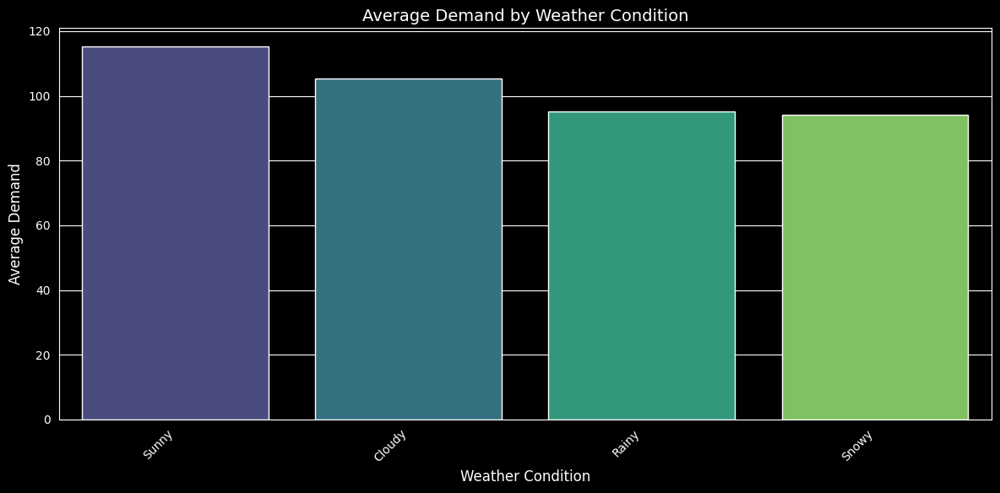


Seasonality vs Units Sold:


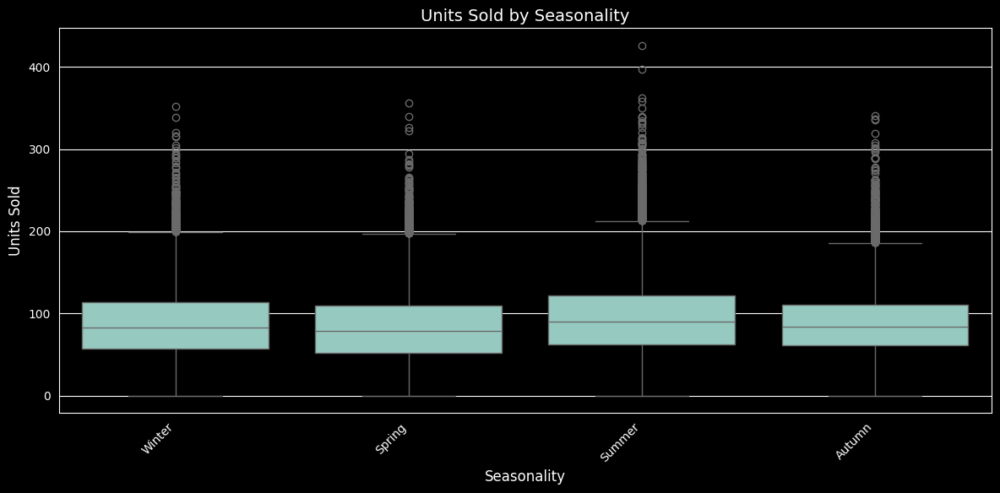

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


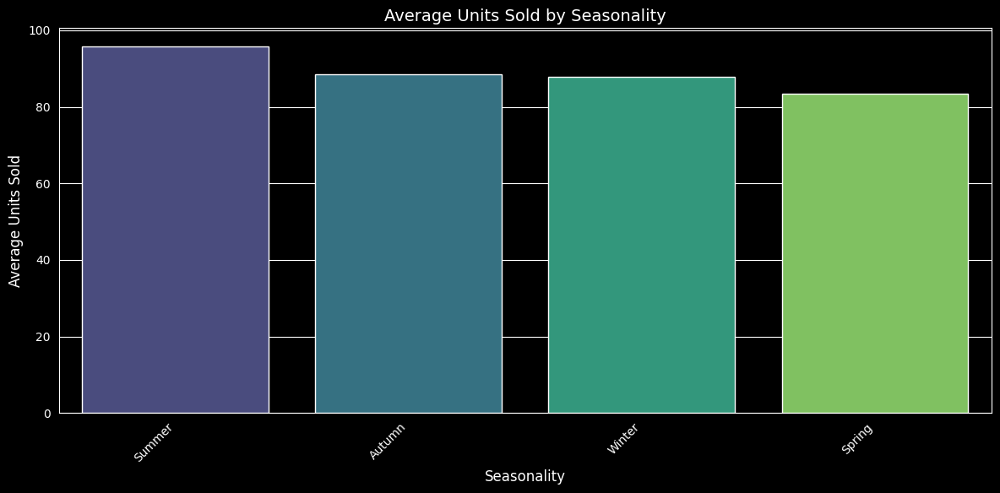


Seasonality vs Demand:


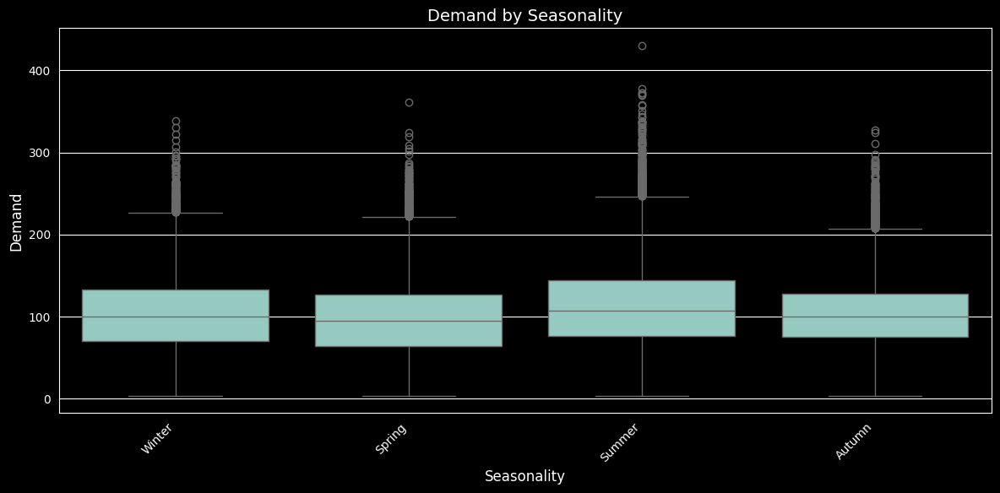

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


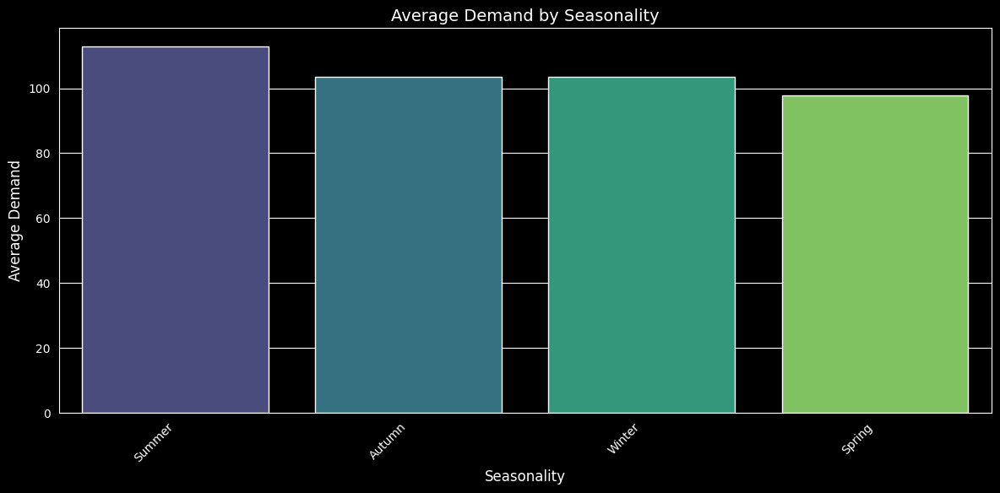


Promotion vs Units Sold:


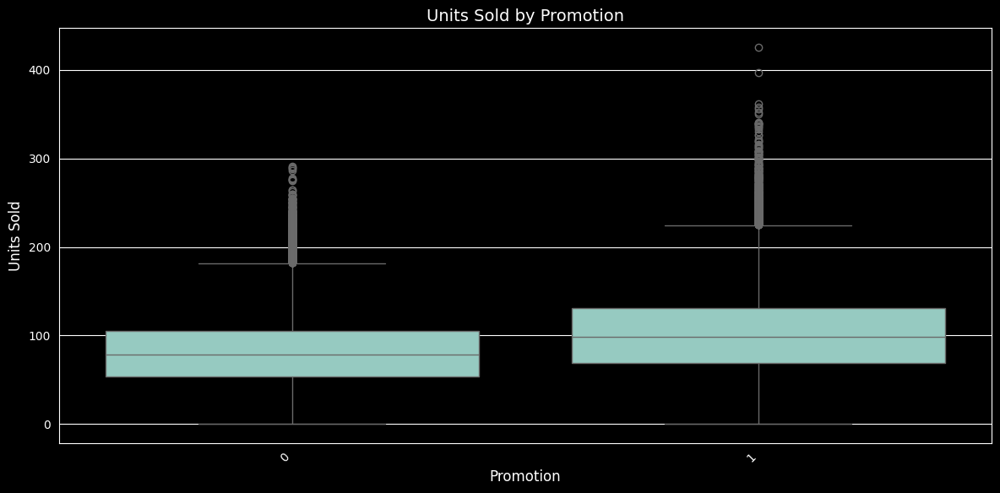

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


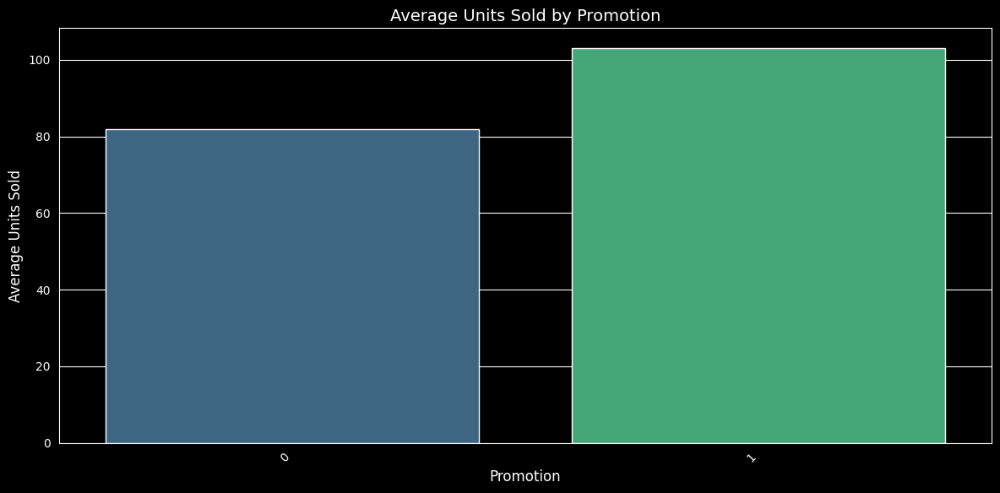


Promotion vs Demand:


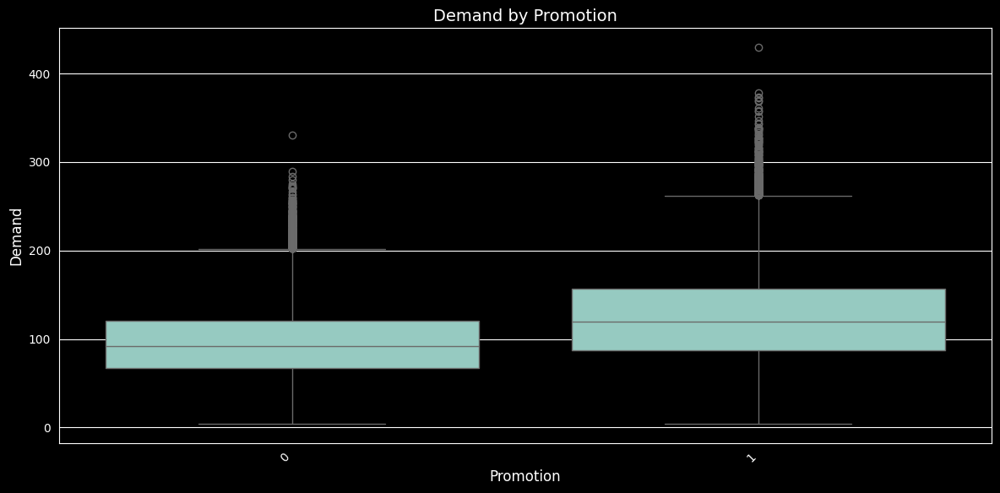

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


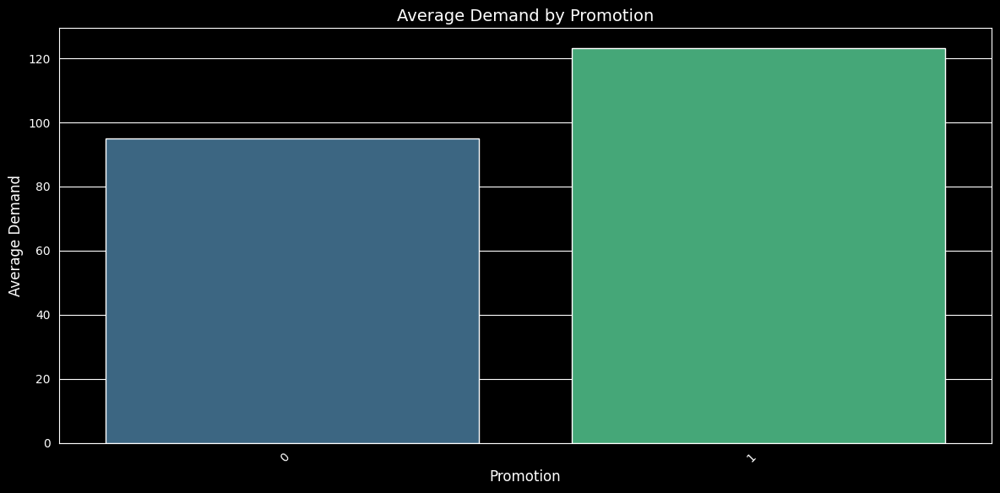


Epidemic vs Units Sold:


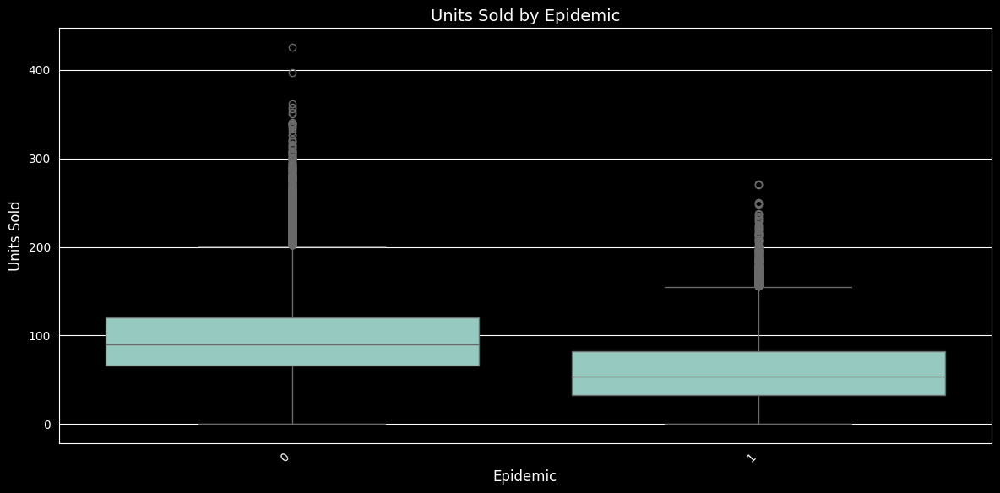

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


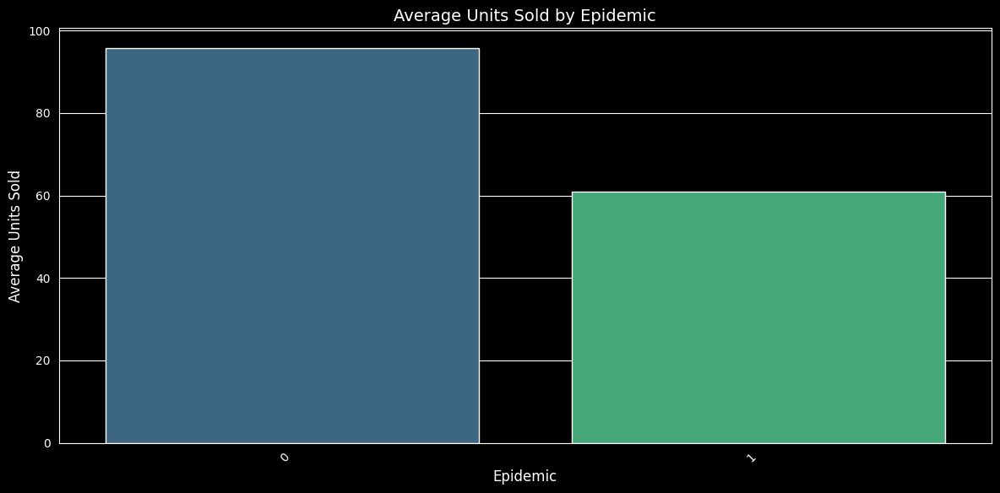


Epidemic vs Demand:


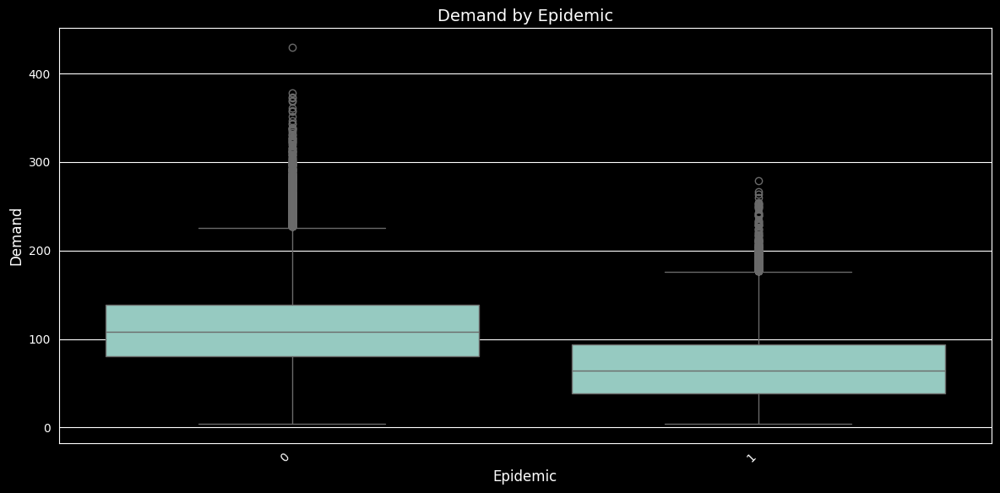

/tmp/ipykernel_1495/1611230918.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')


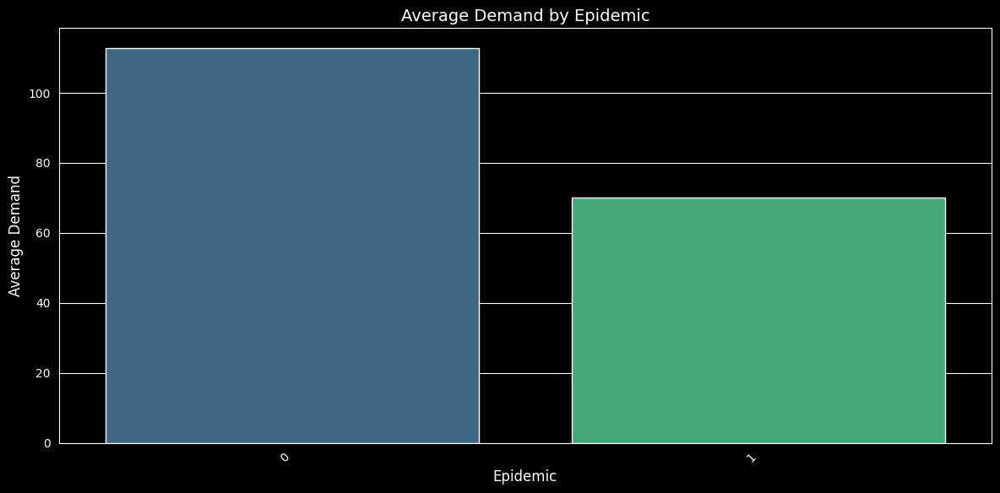

In [247]:
if df is not None:
    categorical_cols = ['Category', 'Region', 'Weather Condition', 'Seasonality', 'Promotion', 'Epidemic']
    target_vars = ['Units Sold', 'Demand']

    for cat_col in categorical_cols:
        if cat_col in df.columns:
            for target_var in target_vars:
                if target_var in df.columns:
                    print(f"\n{cat_col} vs {target_var}:")
                    plt.figure(figsize=(12, 6))
                    sns.boxplot(data=df, x=cat_col, y=target_var)
                    plt.title(f'{target_var} by {cat_col}')
                    plt.xticks(rotation=45, ha='right')
                    plt.tight_layout()
                    plt.show()

                    # Also consider bar plots for average values
                    avg_values = df.groupby(cat_col)[target_var].mean().sort_values(ascending=False)
                    plt.figure(figsize=(12, 6))
                    sns.barplot(x=avg_values.index, y=avg_values.values, palette='viridis')
                    plt.title(f'Average {target_var} by {cat_col}')
                    plt.xticks(rotation=45, ha='right')
                    plt.ylabel(f'Average {target_var}')
                    plt.tight_layout()
                    plt.show()
                else:
                    print(f"Target variable '{target_var}' not found in DataFrame.")
        else:
            print(f"Column '{cat_col}' not found in DataFrame.")
else:
    print("DataFrame not available for categorical vs numerical analysis.")

### Time Series Analysis (Trends over Date)


Daily Trends for Units Sold and Demand:


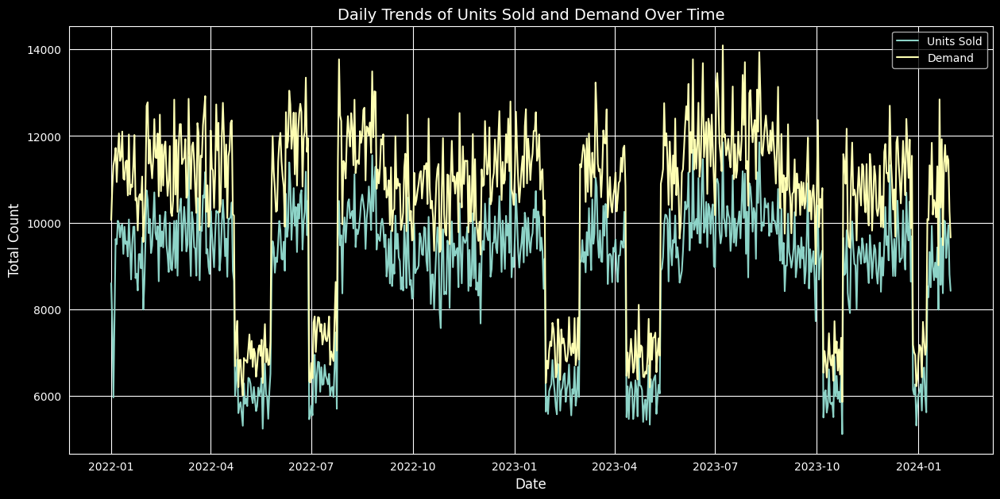


Yearly Trends for Units Sold and Demand:


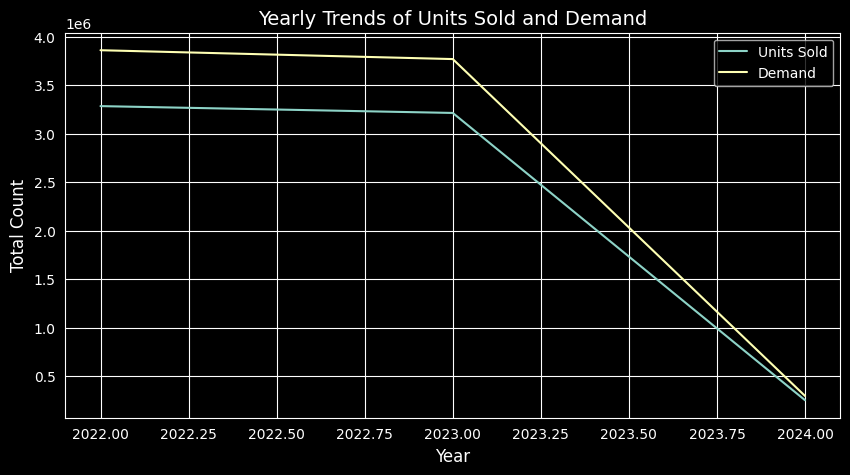


Monthly Trends for Units Sold and Demand (Aggregated):


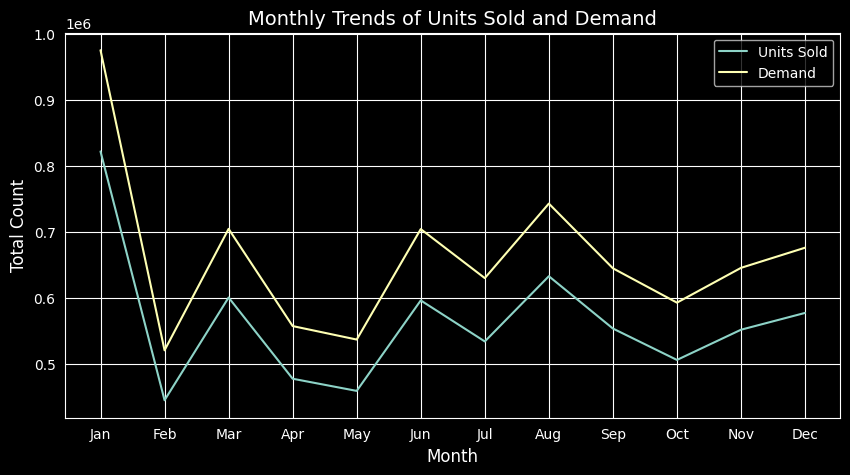

In [248]:
if df is not None and 'Date' in df.columns:
    # Aggregate daily sales and demand
    daily_trends = df.groupby('Date')[['Units Sold', 'Demand']].sum().reset_index()

    print("\nDaily Trends for Units Sold and Demand:")
    plt.figure(figsize=(15, 7))
    sns.lineplot(data=daily_trends, x='Date', y='Units Sold', label='Units Sold')
    sns.lineplot(data=daily_trends, x='Date', y='Demand', label='Demand')
    plt.title('Daily Trends of Units Sold and Demand Over Time')
    plt.xlabel('Date')
    plt.ylabel('Total Count')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Further breakdown by month or year if data spans multiple years
    df['Year'] = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month

    if df['Year'].nunique() > 1:
        yearly_trends = df.groupby('Year')[['Units Sold', 'Demand']].sum().reset_index()
        print("\nYearly Trends for Units Sold and Demand:")
        plt.figure(figsize=(10, 5))
        sns.lineplot(data=yearly_trends, x='Year', y='Units Sold', label='Units Sold')
        sns.lineplot(data=yearly_trends, x='Year', y='Demand', label='Demand')
        plt.title('Yearly Trends of Units Sold and Demand')
        plt.xlabel('Year')
        plt.ylabel('Total Count')
        plt.legend()
        plt.grid(True)
        plt.show()

    monthly_trends = df.groupby('Month')[['Units Sold', 'Demand']].sum().reset_index()
    print("\nMonthly Trends for Units Sold and Demand (Aggregated):")
    plt.figure(figsize=(10, 5))
    sns.lineplot(data=monthly_trends, x='Month', y='Units Sold', label='Units Sold')
    sns.lineplot(data=monthly_trends, x='Month', y='Demand', label='Demand')
    plt.title('Monthly Trends of Units Sold and Demand')
    plt.xlabel('Month')
    plt.ylabel('Total Count')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.legend()
    plt.grid(True)
    plt.show()

else:
    print("DataFrame not available or 'Date' column not found for time series analysis.")